# Trust-region configurations and the limit point

**Companion notebook (Julia) — Survey of trust-region radius update mechanisms**

This notebook runs a trust-region method on a single quartic in two variables across a matrix of
configurations, built along three orthogonal axes:

| axis | choices |
|---|---|
| **radius mechanism** | R-delta, R-step, R-DFO ($\zeta$), R-grad ($\mu_{\max}$) |
| **subproblem solver** | Steihaug–Toint truncated CG, exact Moré–Sorensen |
| **model Hessian** | true Hessian, L-BFGS, SR1, constructed positive definite |

The test function is chosen so that **the limit point depends on the configuration**: the same
starting point is delivered to a degenerate critical point, a local minimiser, or a saddle,
according to which model Hessian is used. The headline finding is that this split is governed by
the *model*, not by the radius rule — the radius mechanism sets the step *length*, never its
*direction*.

### Requirements

## Setup

```julia 
using Pkg; Pkg.activate(joinpath(@__DIR__, ".."))
```

To run just once, 
```julia 
Pkg.develop(joinpath(@__DIR__, "..", ".."))
```

```julia
Pkg.add(["ADNLPModels", "Plots", "LaTeXStrings", "Printf", "LinearAlgebra", "NLPModels"])
```

## 1. Setup: function, gradient, Hessian, critical points

### Relationship to `TrustRegionRadius.jl`

This notebook predates the package and carries its own implementation of all three axes,
kept because the discussion needs per-iteration diagnostics the package does not trace —
the **iterate path** above all, without which the phase portraits below cannot be drawn.

That local implementation **shadows package names**: `RadiusRule`, `ModelHessian`,
`RDelta`, `RStep`, `RDFO`, `RGrad` and `SPDTarget` are all defined here *and* exported by
the package. A bare `using TrustRegionRadius` in this kernel would collide with every one
of them.

So the package is imported **qualified** wherever it is used below:

```julia
import TrustRegionRadius as TRR
TRR.RGradTau(μ = 1.0)      # unambiguous
```

Two differences to keep in mind when comparing the local driver against the package:

| | this notebook | the package |
|:--|:--|:--|
| acceptance | `η = 1e-4`, `η1 = 0.25`, `η2 = 0.75` | `η` defaults to `η1`; both are `TRParams` fields |
| `R-grad` cap | `μmax` applied every iteration | that is `RGradCapped`; `RGrad` is uncapped |
| initial radius | `0.1‖g₀‖` for the unanchored rules | `Δ0`, taken literally |

The local `RGrad` caps $\mu$ unconditionally, so it corresponds to the package's
`RGradCapped(μ_max = ...)`, not to `RGrad`. That distinction matters for the $\mu_{\max}$
sweep in §8 and §10: the package's uncapped `RGrad` climbs past **any** threshold, which is
why it is the one rule in the survey whose eventual inactivity needs no hypothesis on an
unknowable constant.

In [1]:
using LinearAlgebra
using Printf

# ---------------------------------------------------------------- test function
f(p) = p[1]^4 - p[1]^3 + (0.25 - p[1]/2)*p[2]^2 + p[2]^4/4

grad(p) = [4p[1]^3 - 3p[1]^2 - p[2]^2/2,
           p[2]^3 + 2p[2]*(0.25 - p[1]/2)]

hess(p) = [6p[1]*(2p[1]-1)   -p[2];
           -p[2]             (-p[1] + 3p[2]^2 + 0.5)]

# ---------------------------------------------------------------- critical points
const ORIGIN = [0.0, 0.0]                                   # degenerate, singular, PSD
const SADDLE = [0.75, 0.0]                                  # nonsingular saddle
const MINP   = [(1+sqrt(5))/4,  sqrt((sqrt(5)-1)/4)]        # local minimum
const MINM   = [(1+sqrt(5))/4, -sqrt((sqrt(5)-1)/4)]        # local minimum

const X0_DEFAULT = [-0.5, 0.6]

const CRITPTS = [("origin",  ORIGIN), ("saddle", SADDLE),
                 ("min+",    MINP),   ("min-",   MINM)]

println("Critical points of f\n")
@printf("%-8s %-22s %12s %12s %22s\n", "name", "x", "f(x)", "||grad||", "eig(hess)")
println("-"^80)
for (nm, p) in CRITPTS
    w = eigvals(Symmetric(hess(p)))
    @printf("%-8s (%+.6f, %+.6f) %12.8f %12.2e   (%+.5f, %+.5f)\n",
            nm, p[1], p[2], f(p), norm(grad(p)), w[1], w[2])
end

Critical points of f

name     x                              f(x)     ||grad||              eig(hess)
--------------------------------------------------------------------------------
origin   (+0.000000, +0.000000)   0.00000000     0.00e+00   (-0.00000, +0.50000)
saddle   (+0.750000, +0.000000)  -0.10546875     0.00e+00   (-0.25000, +2.25000)
min+     (+0.809017, +0.555893)  -0.12500000     3.93e-17   (+0.49469, +3.12334)
min-     (+0.809017, -0.555893)  -0.12500000     3.93e-17   (+0.49469, +3.12334)


### Structure worth noting

The second gradient component factors as

$$(\nabla f)_2 = y\left(y^2 - x + \tfrac12\right),$$

so it vanishes identically on $\{y=0\}$: **the line $y=0$ is invariant** under the gradient flow
$\dot z = -\nabla f(z)$. That line is exactly the stable manifold of the saddle $(3/4,0)$, of
codimension one and hence of measure zero — so the gradient flow from a *generic* point does not
reach the saddle. Any run that lands there must have been *steered* by the model.

At the origin $\nabla^2 f = \operatorname{diag}(0, 1/2)$ is singular and positive semidefinite, so
the second-order criticality measure $\tau(x) = \max\{\|g\|, -\lambda^-\}$ **vanishes** there. Yet
$f(x,0) = x^3(x-1) < 0$ for small $x>0$, so the origin is *not* a local minimiser: $\tau$ certifies
a point that second-order theory should reject.

In [2]:
# invariance and degeneracy checks
@printf("(grad f)_2 on {y=0}, sampled at x=0.3 : %.3e   (identically zero)\n", grad([0.3,0.0])[2])
@printf("(grad f)_1 on {y=0} is x^2(4x-3), roots x = 0 (double), x = 3/4\n")
@printf("f(x,0) = x^3(x-1) < 0 for small x>0, e.g. f(0.1,0) = %+.6f\n", f([0.1,0.0]))

w = eigvals(Symmetric(hess(ORIGIN)))
@printf("\nAt the origin: eig(hess) = (%.3f, %.3f)  => tau = max(||g||, -lambda^-) = %.3f\n",
        w[1], w[2], max(norm(grad(ORIGIN)), -min(w[1],0.0)))
println("   ... but the origin is NOT a local minimiser. tau = 0 there regardless.")

(grad f)_2 on {y=0}, sampled at x=0.3 : 0.000e+00   (identically zero)
(grad f)_1 on {y=0} is x^2(4x-3), roots x = 0 (double), x = 3/4
f(x,0) = x^3(x-1) < 0 for small x>0, e.g. f(0.1,0) = -0.000900

At the origin: eig(hess) = (-0.000, 0.500)  => tau = max(||g||, -lambda^-) = 0.000
   ... but the origin is NOT a local minimiser. tau = 0 there regardless.


## 2. Axis 1 — radius mechanisms

Each rule is a struct carrying its own parameters, plus two common methods:

- `init_radius(rule, gn)` — the initial radius, which for R-grad depends on $\|g_0\|$;
- `update_radius(rule, Δ, ρ, s, gn, η₁, η₂)` — the new radius.

Adding a fifth rule means adding one struct and two methods, nothing else.

In [3]:
abstract type RadiusRule end

# ---- R-delta: fixed-factor, reads only rho -------------------------------------
Base.@kwdef mutable struct RDelta <: RadiusRule
    Δ0::Float64   = 0.05
    γ1::Float64   = 0.25
    γ2::Float64   = 0.5
    γ3::Float64   = 2.0
    Δmax::Float64 = 1e3
end
name(r::RDelta) = "R-delta"

# ---- R-step: anchored to the accepted step length ------------------------------
Base.@kwdef mutable struct RStep <: RadiusRule
    Δ0::Float64   = 0.05
    γ1::Float64   = 0.25
    γ2::Float64   = 0.5
    γ3::Float64   = 2.0
    Δmax::Float64 = 1e3
end
name(r::RStep) = "R-step"

# ---- R-DFO: expand only when the radius is small vs criticality ----------------
Base.@kwdef mutable struct RDFO <: RadiusRule
    Δ0::Float64   = 0.05
    ζ::Float64    = 1.0
    γ1::Float64   = 0.25
    γ2::Float64   = 0.5
    γ3::Float64   = 2.0
    Δmax::Float64 = 1e3
end
name(r::RDFO) = @sprintf("R-DFO(ζ=%g)", r.ζ)

# ---- R-grad: Delta_k = mu_k ||g_k||, mu capped ---------------------------------
Base.@kwdef mutable struct RGrad <: RadiusRule
    μmax::Float64 = 1.0
    μ::Float64    = 1.0
    γ1::Float64   = 0.25
    γ2::Float64   = 0.5
    γ3::Float64   = 2.0
end
name(r::RGrad) = @sprintf("R-grad(μmax=%g)", r.μmax)

"True when the rule ties the radius to the criticality measure ||g_k||."
is_anchored(::RadiusRule) = false
is_anchored(::RGrad)      = true

# ---- initial radius ------------------------------------------------------------
init_radius(r::RDelta, gn) = 0.1*norm(gn)  # arbitrary, but not too small
init_radius(r::RStep,  gn) = 0.1*norm(gn)
init_radius(r::RDFO,   gn) = 0.1*norm(gn)
function init_radius(r::RGrad, gn)
    r.μ = r.μmax
    return r.μ * gn
end

# ---- radius update -------------------------------------------------------------
# Returns the new radius, or `nothing` when the rule recomputes it from ||g||
# at the top of the next iteration (R-grad).
function update_radius(r::RDelta, Δ, ρ, s, gn, η1, η2)
    ρ < η1 && return r.γ1*Δ
    ρ < η2 && return r.γ2*Δ
    return min(r.γ3*Δ, r.Δmax)
end

function update_radius(r::RStep, Δ, ρ, s, gn, η1, η2)
    ns = norm(s)
    ρ < η1 && return r.γ1*ns
    ρ < η2 && return r.γ2*ns
    return min(r.γ3*ns, r.Δmax)
end

function update_radius(r::RDFO, Δ, ρ, s, gn, η1, η2)
    ρ < η1        && return r.γ1*Δ          # unsuccessful: contract
    Δ > r.ζ*gn    && return r.γ2*Δ          # radius large vs criticality: shrink
    return min(r.γ3*Δ, r.Δmax)              # small vs criticality: expand
end

function update_radius(r::RGrad, Δ, ρ, s, gn, η1, η2)
    if ρ < η1
        r.μ = r.γ1*r.μ
    elseif ρ < η2
        r.μ = r.γ2*r.μ
    else
        r.μ = min(r.γ3*r.μ, r.μmax)
    end
    return nothing                           # Δ = μ*||g|| recomputed next iteration
end

println("radius rules loaded: R-delta, R-step, R-DFO, R-grad")

radius rules loaded: R-delta, R-step, R-DFO, R-grad


## 3. Axis 2 — subproblem solvers

Both solve
$$\min_{\|s\| \le \Delta} \; g^\top s + \tfrac12 s^\top B s .$$

**Steihaug–Toint truncated CG** stops on negative curvature or on hitting the boundary. Its first
iterate travels along $-g$, so if the boundary is hit on CG iteration 1 the returned step is
exactly the **Cauchy point** $-\Delta g/\|g\|$ — a fact §7 exploits.

**Exact Moré–Sorensen** uses the characterisation: $s^*$ is optimal iff there is $\lambda \ge 0$
with $(B+\lambda I)s^* = -g$, $B + \lambda I \succeq 0$, and $\lambda(\Delta - \|s^*\|) = 0$.
Since $\|s(\lambda)\|$ is strictly decreasing in $\lambda$, the root is bracketed and bisected.
Here $B$ may be **indefinite** (true Hessian, SR1), so the **hard case** — $g$ orthogonal to the
eigenspace of $\lambda_{\min}(B)$, no $\lambda$ attaining $\|s(\lambda)\| = \Delta$ — genuinely
arises and is handled by adding the appropriate multiple of that eigenvector.

In [4]:
"""
    steihaug(g, B, Δ; tol, maxit) -> (s, active, iters)

Steihaug–Toint truncated CG. `active` flags a binding trust-region constraint.
The first CG direction is `-g`, so `iters == 1 && active` means `s` is the Cauchy point.
"""
function steihaug(g, B, Δ; tol=1e-10, maxit=50)
    z = zeros(length(g)); r = copy(g); d = -r
    norm(r) < tol && return z, false, 0
    for j in 1:maxit
        dBd = dot(d, B*d)
        if dBd <= 0                                    # negative curvature: go to boundary
            aa = dot(d,d); bb = 2*dot(z,d); cc = dot(z,z) - Δ^2
            τ  = (-bb + sqrt(bb^2 - 4aa*cc))/(2aa)
            return z + τ*d, true, j
        end
        α  = dot(r,r)/dBd
        zn = z + α*d
        if norm(zn) >= Δ                               # boundary hit
            aa = dot(d,d); bb = 2*dot(z,d); cc = dot(z,z) - Δ^2
            τ  = (-bb + sqrt(bb^2 - 4aa*cc))/(2aa)
            return z + τ*d, true, j
        end
        rn = r + α*(B*d)
        norm(rn) < tol*norm(g) && return zn, false, j
        β = dot(rn,rn)/dot(r,r); d = -rn + β*d; z = zn; r = rn
    end
    return z, false, maxit
end

"""
    exact_ms(g, B, Δ) -> (s, active)

Exact trust-region step by the Moré–Sorensen characterisation, valid for **indefinite** `B`.
Handles the hard case explicitly.
"""
function exact_ms(g, B, Δ)
    F = eigen(Symmetric(B))
    w, Q = F.values, F.vectors
    λmin = w[1]
    gq = Q' * g

    if λmin > 0                                        # interior Newton point?
        s = -(B \ g)
        norm(s) <= Δ && return s, false
    end

    snorm(λ) = sqrt(sum((gq ./ (w .+ λ)).^2))

    # --- hard case: g orthogonal to the leftmost eigenspace ---
    idx  = abs.(w .- λmin) .< 1e-12
    if all(abs.(gq[idx]) .< 1e-12) && λmin <= 0
        safe = .!idx
        sbar = zeros(length(g))
        if any(safe)
            sbar[safe] = -gq[safe] ./ (w[safe] .- λmin)
        end
        ns = norm(sbar)
        if ns <= Δ
            τ = sqrt(max(Δ^2 - ns^2, 0.0))
            return Q * (sbar .+ τ .* idx), true
        end
    end

    # --- regular case: bisect on lambda ---
    lo = max(0.0, -λmin) + 1e-14
    hi = max(lo + 1.0, norm(g)/max(Δ, 1e-300))         # ||s(λ)|| ~ ||g||/λ for large λ
    it = 0
    while snorm(hi) > Δ && it < 200
        hi = lo + 2*(hi - lo); it += 1
        hi > 1e300 && break
    end
    for _ in 1:100
        mid = 0.5*(lo + hi)
        snorm(mid) > Δ ? (lo = mid) : (hi = mid)
        hi - lo <= 1e-14*max(1.0, hi) && break
    end
    return -Q * (gq ./ (w .+ hi)), true
end

println("subproblem solvers loaded: steihaug, exact_ms")

subproblem solvers loaded: steihaug, exact_ms


## 4. Axis 3 — model Hessians

Each model is a mutable struct with `reset!`, `model_hessian(model, x)`, and
`update_model!(model, s, y)` where $y = g_{k+1} - g_k$.

The **constructed positive definite** model deserves comment. Given a target $x^\star$ and
$d_k = x^\star - x_k$, write $u = d_k/\|d_k\|$ and $v = u^\perp$. The family

$$B_k = a\,uu^\top + b\,(uv^\top + vu^\top) + c\,vv^\top,
\qquad a = -\frac{g_k^\top u}{\|d_k\|}, \quad b = -\frac{g_k^\top v}{\|d_k\|},$$

has unconstrained minimiser exactly $x^\star$ for **every** value of the free parameter $c$, and is
positive definite iff $a > 0$ and $c > b^2/a$; we take $c = b^2/a + \lambda_\perp$. The condition
$a>0$ is equivalent to

$$\varphi(x_k) = g_k^\top\left(x^\star - x_k\right) < 0,$$

i.e. **the target must lie downhill**, and it is necessary for *any* SPD model with that minimiser,
since $d^\top B d = -\alpha^{-1}g^\top d > 0$. Where it fails we report a clean `breakdown` rather
than returning an indefinite matrix.

In [5]:
abstract type ModelHessian end

# ---- true Hessian --------------------------------------------------------------
struct TrueHessian <: ModelHessian end
name(::TrueHessian) = "true"
reset!(::TrueHessian) = nothing
model_hessian(::TrueHessian, x) = hess(x)
update_model!(::TrueHessian, s, y) = nothing

# ---- L-BFGS --------------------------------------------------------------------
Base.@kwdef mutable struct LBFGS <: ModelHessian
    m::Int = 5
    S::Vector{Vector{Float64}} = Vector{Float64}[]
    Y::Vector{Vector{Float64}} = Vector{Float64}[]
end
name(M::LBFGS) = @sprintf("L-BFGS(m=%d)", M.m)
function reset!(M::LBFGS)
    empty!(M.S); empty!(M.Y); return nothing
end
function model_hessian(M::LBFGS, x)
    n = length(x)
    B = Matrix{Float64}(I, n, n)
    if !isempty(M.S)                                   # scale by the latest pair
        s, y = M.S[end], M.Y[end]
        γ = dot(s,y) > 0 ? dot(y,y)/dot(s,y) : 1.0
        B = γ * Matrix{Float64}(I, n, n)
    end
    for (s, y) in zip(M.S, M.Y)                        # BFGS updates, oldest first
        Bs = B*s
        B  = B - (Bs*Bs')/dot(s,Bs) + (y*y')/dot(y,s)
    end
    return B
end
function update_model!(M::LBFGS, s, y)
    if dot(s,y) > 1e-8*norm(s)*norm(y)                 # curvature condition; skip otherwise
        push!(M.S, copy(s)); push!(M.Y, copy(y))
        if length(M.S) > M.m
            popfirst!(M.S); popfirst!(M.Y)
        end
    end
    return nothing
end

# ---- SR1 (may be indefinite: that is the point) --------------------------------
Base.@kwdef mutable struct SR1 <: ModelHessian
    B::Matrix{Float64} = Matrix{Float64}(I, 2, 2)
end
name(::SR1) = "SR1"
reset!(M::SR1) = (M.B = Matrix{Float64}(I, 2, 2); nothing)
model_hessian(M::SR1, x) = M.B
function update_model!(M::SR1, s, y)
    r = y - M.B*s
    if abs(dot(r,s)) >= 1e-8*norm(s)*norm(r)           # standard SR1 safeguard
        M.B = M.B + (r*r')/dot(r,s)
    end
    return nothing
end

# ---- constructed positive definite, minimiser pinned to a target ---------------
Base.@kwdef mutable struct SPDTarget <: ModelHessian
    target::Vector{Float64} = SADDLE
    λ⊥::Float64             = 1.0
end
name(M::SPDTarget) = "SPD→target"
reset!(::SPDTarget) = nothing

"Descent functional φ(x) = g(x)'(target - x); the SPD construction needs φ < 0."
φ_target(M::SPDTarget, x) = dot(grad(x), M.target .- x)

function model_hessian(M::SPDTarget, x)
    d  = M.target .- x
    nd = norm(d)
    nd < 1e-14 && return Matrix{Float64}(I, 2, 2)      # already at the target
    u  = d ./ nd
    v  = [-u[2], u[1]]
    g  = grad(x)
    a  = -dot(g,u)/nd
    b  = -dot(g,v)/nd
    a <= 0 && throw(DomainError(a, "no SPD model with minimiser at target: φ(x) >= 0"))
    c  = b*b/a + M.λ⊥
    return a*(u*u') + b*(u*v' + v*u') + c*(v*v')
end
update_model!(::SPDTarget, s, y) = nothing

println("model Hessians loaded: TrueHessian, LBFGS, SR1, SPDTarget")

model Hessians loaded: TrueHessian, LBFGS, SR1, SPDTarget


## 5. The driver

`run_tr` accepts any (radius, solver, model) combination and records per iteration: $k$, $x_k$,
$f_k$, $\|g_k\|$, $\Delta_k$, $\rho_k$, $\|s_k\|$, whether the trust-region constraint was active,
the CG iteration count, $\lambda_{\min}(B_k)$, $\lambda_{\min}(\nabla^2 f(x_k))$, and
$\cos(s_k, -g_k)$.

**On the `stagnated` status.** When the radius collapses far enough, $\|s_k\|$ falls below the
point where $f(x_k) - f(x_k + s_k)$ carries any information: the subtraction is pure roundoff, so
$\rho_k$ becomes noise, every step is rejected, and the radius contracts forever. This is a real
numerical failure mode of the anchored rules rather than an artefact, so the driver detects and
reports it instead of spinning.

In [6]:
Base.@kwdef struct Row
    k::Int
    x::Vector{Float64}
    f::Float64
    gn::Float64
    Δ::Float64
    ρ::Float64
    ns::Float64
    active::Bool
    cg::Int
    λminB::Float64
    λminH::Float64
    cosCauchy::Float64
    status::String
end

"""
    run_tr(x0; radius, solver, model, kmax, tol, η, η1, η2) -> (rows, status, xfinal)

Trust-region driver. `solver` is `:cg` or `:exact`.

Statuses: `converged` (||g|| < tol), `breakdown` (no model exists here),
`stagnated` (step below the roundoff floor of f, so ρ is noise), `maxiter`.
"""
function run_tr(x0 = X0_DEFAULT; radius::RadiusRule, model::ModelHessian,
                solver::Symbol = :cg, kmax = 2000, tol = 1e-9,
                η = 1e-4, η1 = 0.25, η2 = 0.75)
    x = collect(float.(x0))
    reset!(model)
    Δ = init_radius(radius, norm(grad(x)))
    rows = Row[]
    status = "maxiter"

    for k in 0:kmax-1
        fk = f(x); g = grad(x); gn = norm(g)
        isa(radius, RGrad) && (Δ = radius.μ * gn)
        λH = eigvals(Symmetric(hess(x)))[1]

        if gn < tol
            status = "converged"
            push!(rows, Row(k=k, x=copy(x), f=fk, gn=gn, Δ=Δ, ρ=NaN, ns=NaN, active=false,
                            cg=0, λminB=NaN, λminH=λH, cosCauchy=NaN, status=status))
            break
        end

        local B
        try
            B = model_hessian(model, x)
        catch err
            isa(err, DomainError) || rethrow()
            status = "breakdown"
            push!(rows, Row(k=k, x=copy(x), f=fk, gn=gn, Δ=Δ, ρ=NaN, ns=NaN, active=false,
                            cg=0, λminB=NaN, λminH=λH, cosCauchy=NaN, status=status))
            break
        end

        local s, active, cgit
        if solver === :cg
            s, active, cgit = steihaug(g, B, Δ)
        else
            s, active = exact_ms(g, B, Δ)
            cgit = 0
        end

        pred = -(dot(g,s) + 0.5*dot(s, B*s))
        ared = fk - f(x .+ s)
        ρ    = pred > 1e-300 ? ared/pred : -Inf
        cosC = norm(s) > 0 ? dot(s, -g)/(norm(s)*gn) : NaN
        λB   = eigvals(Symmetric(B))[1]

        push!(rows, Row(k=k, x=copy(x), f=fk, gn=gn, Δ=Δ, ρ=ρ, ns=norm(s), active=active,
                        cg=cgit, λminB=λB, λminH=λH, cosCauchy=cosC,
                        status = ρ >= η ? "accept" : "reject"))

        # stagnation: |ared| at the roundoff floor of f and the step is numerically nil
        if abs(ared) <= 1e-14*max(1.0, abs(fk)) && norm(s) < 1e-12
            status = "stagnated"; break
        end

        if ρ >= η
            xnew = x .+ s
            update_model!(model, s, grad(xnew) .- g)
            x = xnew
        end

        Δn = update_radius(radius, Δ, ρ, s, gn, η1, η2)
        Δn === nothing || (Δ = Δn)
    end
    return rows, status, x
end

"""
    classify(x, status; tol=1e-4) -> String

Name the limit point: which critical point the run reached, or the failure mode.
"""
function classify(x, status; tol = 1e-4)
    status == "breakdown" && return "breakdown"
    for (nm, p) in CRITPTS
        norm(x .- p) < tol && return nm
    end
    return status == "converged" ? "other" : status
end

println("driver loaded: run_tr, classify")

driver loaded: run_tr, classify


## 6. LaTeX output helpers

Tables print to the console **and** write to disk. The writer takes an `IO` first argument, so
`open(io -> latex_table(io, ...), "tab.txt", "w")` produces a pastable file; passing `stdout`
previews it. `sci` renders infinities as `$+\infty$` rather than crashing, which matters because
some runs overflow.

In [7]:
"""
    latex_table(io, header, rows; caption, label, align, note)

Write a `booktabs` table to `io`. `rows` is a vector of vectors of formatted strings.
"""
function latex_table(io::IO, header, rows; caption="", label="", align="", note="")
    align = isempty(align) ? "l" * "r"^(length(header)-1) : align
    println(io, "\\begin{table}[htbp]")
    println(io, "  \\centering")
    isempty(caption) || println(io, "  \\caption{", caption, "}")
    isempty(label)   || println(io, "  \\label{", label, "}")
    println(io, "  \\begin{tabular}{", align, "}")
    println(io, "    \\toprule")
    println(io, "    ", join(header, " & "), " \\\\")
    println(io, "    \\midrule")
    for r in rows
        println(io, "    ", join(r, " & "), " \\\\")
    end
    println(io, "    \\bottomrule")
    println(io, "  \\end{tabular}")
    isempty(note) || println(io, "  \\\\[2pt] \\footnotesize ", note)
    println(io, "\\end{table}")
    return nothing
end
latex_table(header, rows; kwargs...) = latex_table(stdout, header, rows; kwargs...)

"Scientific notation, LaTeX math. Infinities render as \$+\\infty\$ rather than crashing."
function sci(x; d=3)
    isinf(x) && return "\$" * (x > 0 ? "+" : "-") * "\\infty\$"
    isnan(x) && return "---"
    x == 0    && return "\$0\$"
    e = floor(Int, log10(abs(x)))
    m = x / 10.0^e
    return @sprintf("\$%.*f\\times10^{%d}\$", d, m, e)
end

"Fixed-point math cell."
fix(x; d=3) = isnan(x) ? "---" : (isinf(x) ? "\$\\infty\$" : @sprintf("\$%.*f\$", d, x))

"Escape a plain string for LaTeX (the rule names contain no specials, but be safe)."
tex(s) = replace(String(s), "_" => "\\_")

println("LaTeX helpers loaded: latex_table, sci, fix, tex")

LaTeX helpers loaded: latex_table, sci, fix, tex


## 7. The configuration matrix

The coarse sweep: every model against every rule, both solvers. One line per run, classified by
limit point.

This is the central table of the notebook, and the pattern in it is the result: **the limit is
determined by the model Hessian, not by the radius rule.**

In [8]:
# ---- parameters (edit here, nothing below) ----
X0_SWEEP  = [-0.5, 0.6]
KMAX_FAST = 60_000
TOL_FAST  = 1e-9

make_models() = [TrueHessian(), LBFGS(m=5), SR1(), SPDTarget(target=SADDLE)]
make_rules()  = [RDelta(), RStep(), RDFO(ζ=1.0), RGrad(μmax=1.0)]

sweep_rows = Vector{String}[]
println("Configuration matrix from x0 = ", X0_SWEEP, "\n")
@printf("%-12s %-7s %-16s %-11s %8s %-10s %12s\n",
        "model", "solver", "rule", "status", "iters", "limit", "dist")
println("-"^88)

for M in make_models(), solver in (:cg, :exact), R in make_rules()
    rows, st, xf = run_tr(X0_SWEEP; radius=R, model=M, solver=solver,
                          kmax=KMAX_FAST, tol=TOL_FAST)
    lim  = classify(xf, st)
    dist = minimum(norm(xf .- p) for (_, p) in CRITPTS)
    @printf("%-12s %-7s %-16s %-11s %8d %-10s %12.2e\n",
            name(M), string(solver), name(R), st, rows[end].k, lim, dist)
    push!(sweep_rows, [tex(name(M)), string(solver), tex(name(R)),
                       st, string(rows[end].k), tex(lim), sci(dist)])
end

open(io -> latex_table(io,
        ["Model", "Solver", "Rule", "Status", "Iters", "Limit", "Dist."],
        sweep_rows;
        align   = "llllrlr",
        caption = raw"Configuration matrix on $f(x,y)=x^4-x^3+(\tfrac14-\tfrac{x}{2})y^2+\tfrac14y^4$ " *
                  raw"from $x_0=(-0.5,0.6)$. The limit point is determined by the model Hessian, " *
                  raw"not by the radius mechanism: the true Hessian and the quasi-Newton models " *
                  raw"deliver the iterates to the degenerate origin or to a minimiser, while the " *
                  raw"constructed positive definite model steers them to the saddle. " *
                  raw"``Stagnated'' means the step fell below the roundoff floor of $f$, so " *
                  raw"$\rho_k$ became noise.",
        label   = "tab: config matrix"),
     "tab_config_matrix.txt", "w")
println("\n✓ wrote tab_config_matrix.txt")

Configuration matrix from x0 = [-0.5, 0.6]

model        solver  rule             status         iters limit              dist
----------------------------------------------------------------------------------------
true         cg      R-delta          converged         16 origin         1.72e-05
true         cg      R-step           converged         16 origin         1.72e-05
true         cg      R-DFO(ζ=1)       converged         16 origin         1.72e-05
true         cg      R-grad(μmax=1)   converged      18245 origin         1.83e-05
true         exact   R-delta          converged         17 origin         9.18e-06
true         exact   R-step           converged         17 origin         9.18e-06
true         exact   R-DFO(ζ=1)       converged         17 origin         9.18e-06
true         exact   R-grad(μmax=1)   converged      18245 origin         1.83e-05
L-BFGS(m=5)  cg      R-delta          converged         27 origin         2.45e-06
L-BFGS(m=5)  cg      R-step          

## 8. Small $\mu_{\max}$ + truncated CG: R-grad degenerates to gradient descent

The claim, in four links:

1. $\Delta_k = \mu_k\|g_k\| \le \mu_{\max}\|g_k\|$ is small, so CG leaves the trust region on its
   **first** step;
2. that step is along $-g_k$, so truncated CG returns the **Cauchy point**
   $s_k = -\Delta_k g_k/\|g_k\|$ — steepest descent with step length $\mu_{\max}\|g_k\|$;
3. the model Hessian is therefore **never consulted for direction**, entering only through
   $\rho_k$;
4. the run inherits gradient-descent asymptotics and converges to whatever attracts the gradient
   flow.

The cell below tests links 1–2 directly: `cos(s_k, -g_k) = 1` to machine precision, with CG
stopping after one iteration.

In [9]:
MU_TEST = [0.01, 0.05, 0.1, 0.3, 1.0, 2.0]
X0_CG   = [-0.5, 0.6]
NPROBE  = 3

println("Does truncated CG return the steepest-descent (Cauchy) point?\n")
@printf("%8s %4s %13s %9s %8s %20s\n", "μmax", "k", "Δ_k", "CG iters", "active", "cos(s_k, -g_k)")
println("-"^70)
for μmax in MU_TEST
    x = copy(X0_CG)
    for k in 0:NPROBE-1
        g = grad(x); B = hess(x); Δ = μmax*norm(g)
        s, act, its = steihaug(g, B, Δ)
        cosd = dot(s, -g)/(norm(s)*norm(g))
        @printf("%8.3f %4d %13.4e %9d %8s %20.14f\n", μmax, k, Δ, its, string(act), cosd)
        x = x .+ s
    end
    println()
end
println("cos = 1 exactly and CG iters = 1  =>  s_k is the Cauchy point of radius Δ_k.")
println("The model Hessian never influences the DIRECTION: R-grad has become gradient descent.")

Does truncated CG return the steepest-descent (Cauchy) point?

    μmax    k           Δ_k  CG iters   active       cos(s_k, -g_k)
----------------------------------------------------------------------
   0.010    0    1.6464e-02         1     true     1.00000000000000
   0.010    1    1.5569e-02         1     true     1.00000000000000
   0.010    2    1.4759e-02         1     true     1.00000000000000

   0.050    0    8.2322e-02         1     true     1.00000000000000
   0.050    1    6.1766e-02         1     true     1.00000000000000
   0.050    2    4.9336e-02         1     true     1.00000000000000

   0.100    0    1.6464e-01         1     true     1.00000000000000
   0.100    1    9.1037e-02         1     true     1.00000000000000
   0.100    2    6.4162e-02         1     true     1.00000000000000

   0.300    0    4.9393e-01         2    false     0.87728513992144
   0.300    1    1.3841e-01         1     true     1.00000000000000
   0.300    2    5.8176e-02         1     true 

### Where the run actually lands

From $(-0.5,0.6)$ the gradient flow is attracted to the **degenerate** point $(0,0)$, not to a
minimiser. The $y$-component collapses to zero almost immediately — the iterates fall onto the
invariant line $\{y=0\}$ and then inch leftward along it.

In [10]:
MU_SWEEP  = [0.01, 0.05, 0.1, 0.3, 0.5, 1.0, 2.0, 4.0, 8.0, 128.0]
KMAX_CRAWL = 60_000

grad_rows = Vector{String}[]
println("R-grad + truncated CG + true Hessian from ", X0_CG, "  (kmax = $KMAX_CRAWL)\n")
@printf("%8s %-11s %8s %28s %-10s %12s %12s\n",
        "μmax", "status", "iters", "final iterate", "limit", "Σ Δ_k", "Σ Δ_k²")
println("-"^100)
for μmax in MU_SWEEP
    rows, st, xf = run_tr(X0_CG; radius=RGrad(μmax=μmax), model=TrueHessian(),
                          solver=:cg, kmax=KMAX_CRAWL, tol=1e-9)
    Δs  = [r.Δ for r in rows]
    sΔ, sΔ2 = sum(Δs), sum(abs2, Δs)
    lim = classify(xf, st; tol=1e-3)
    @printf("%8.3f %-11s %8d      (%+.7f, %+.3e) %-10s %12.4g %12.4g\n",
            μmax, st, rows[end].k, xf[1], xf[2], lim, sΔ, sΔ2)
    push!(grad_rows, [fix(μmax; d=2), st, string(rows[end].k), tex(lim),
                      sci(sΔ), sci(sΔ2)])
end

open(io -> latex_table(io,
        [raw"$\mu_{\max}$", "Status", "Iters", "Limit",
         raw"$\sum_k\Delta_k$", raw"$\sum_k\Delta_k^2$"],
        grad_rows;
        align   = "rlrlrr",
        caption = raw"R-grad with truncated CG and the true Hessian, from $x_0=(-0.5,0.6)$, " *
                  raw"capped at $k_{\max}=" * string(KMAX_CRAWL) * raw"$. For every " *
                  raw"$\mu_{\max}$ the trust region is small enough that CG truncates on its " *
                  raw"first step, the step is the Cauchy point, and the method is gradient " *
                  raw"descent; the limit is accordingly the degenerate point $(0,0)$ that " *
                  raw"attracts the gradient flow, not a minimiser. Smaller $\mu_{\max}$ merely " *
                  raw"slows the crawl.",
        label   = "tab: rgrad mumax"),
     "tab_rgrad_mumax.txt", "w")
println("\n✓ wrote tab_rgrad_mumax.txt")

R-grad + truncated CG + true Hessian from [-0.5, 0.6]  (kmax = 60000)

    μmax status         iters                final iterate limit             Σ Δ_k       Σ Δ_k²


----------------------------------------------------------------------------------------------------
   0.010 maxiter        59999      (-0.0005510, +1.691e-132) origin            0.809     0.004069
   0.050 maxiter        59999      (-0.0001109, +8.893e-323) origin           0.8116      0.02194
   0.100 maxiter        59999      (-0.0000555, +3.953e-323) origin           0.8157      0.04906
   0.300 maxiter        59999      (-0.0000185, +9.881e-324) origin           0.9079       0.2701
   0.500 converged      36496      (-0.0000183, +9.881e-324) origin            1.243        0.736
   1.000 converged      18245      (-0.0000183, +0.000e+00) origin            2.324         2.94
   2.000 converged       9120      (-0.0000183, +0.000e+00) origin            4.569        11.76
   4.000 converged       5416      (-0.0000154, -1.413e-09) origin            9.097        47.03
   8.000 converged       1680      (-0.0000170, +9.975e-10) origin            18.17        188.1
 128.000 converged   

### The sublinear crawl

At the origin $\nabla^2 f = \operatorname{diag}(0,\tfrac12)$ is singular and $f$ is quartic-flat
along $x$, so gradient descent crawls: $\|x_k\| \sim C/k$ rather than linearly. The product
$k\,\|x_k\|$ below settles to a constant, which is the signature.

In [11]:
MU_CRAWL   = 0.05
KMAX_LONG  = 50_000
PROBE_KS   = [10, 100, 1000, 5000, 20000, 50000]

rows_crawl, st_crawl, xf_crawl = run_tr(X0_CG; radius=RGrad(μmax=MU_CRAWL),
                                        model=TrueHessian(), solver=:cg,
                                        kmax=KMAX_LONG, tol=1e-14)

println("R-grad, μmax = $MU_CRAWL, truncated CG — approach to the degenerate origin\n")
@printf("%8s %32s %12s %12s %12s\n", "k", "x_k", "||g_k||", "||x_k||", "k·||x_k||")
println("-"^82)
crawl_rows = Vector{String}[]
for r in rows_crawl
    if r.k in PROBE_KS
        n = norm(r.x)
        @printf("%8d   (%+.9f, %+.3e) %12.3e %12.3e %12.4f\n",
                r.k, r.x[1], r.x[2], r.gn, n, r.k*n)
        push!(crawl_rows, [string(r.k), sci(r.gn), sci(n), fix(r.k*n; d=4)])
    end
end
println("\nk·||x_k|| tends to a constant  =>  ||x_k|| = Θ(1/k), sublinear.")

open(io -> latex_table(io,
        [raw"$k$", raw"$\|g_k\|$", raw"$\|x_k\|$", raw"$k\,\|x_k\|$"],
        crawl_rows;
        align   = "rrrr",
        caption = raw"Sublinear approach to the degenerate origin under R-grad with " *
                  raw"$\mu_{\max}=" * string(MU_CRAWL) * raw"$ and truncated CG. Since " *
                  raw"$\nabla^2f(0,0)=\operatorname{diag}(0,\tfrac12)$ is singular and $f$ is " *
                  raw"quartic-flat along $x$, gradient descent crawls: $k\,\|x_k\|$ settles to " *
                  raw"a constant, so $\|x_k\|=\Theta(1/k)$.",
        label   = "tab: crawl"),
     "tab_crawl.txt", "w")
println("✓ wrote tab_crawl.txt")

R-grad, μmax = 0.05, truncated CG — approach to the degenerate origin

       k                              x_k      ||g_k||      ||x_k||    k·||x_k||
----------------------------------------------------------------------------------
      10   (-0.200893152, +3.515e-01)    3.610e-01    4.049e-01       4.0488
     100   (-0.040909027, +2.298e-02)    1.363e-02    4.692e-02       4.6921
    1000   (-0.006158455, +1.556e-12)    1.147e-04    6.158e-03       6.1585
    5000   (-0.001307756, +9.581e-57)    5.140e-06    1.308e-03       6.5388
   20000   (-0.000331488, +7.032e-222)    3.298e-07    3.315e-04       6.6298

k·||x_k|| tends to a constant  =>  ||x_k|| = Θ(1/k), sublinear.
✓ wrote tab_crawl.txt


## 9. R-DFO: the $\zeta$ sweep

R-DFO expands only when $\Delta_k \le \zeta\|g_k\|$. Small $\zeta$ makes the test hard to satisfy,
so the radius shrinks and the method slows toward gradient descent; large $\zeta$ makes it
permissive, and the rule behaves like R-delta.

In [12]:
ZETA_SWEEP = [0.1, 0.5, 1.0, 2.0]
KMAX_ZETA  = 60_000

zeta_rows = Vector{String}[]
println("R-DFO ζ sweep, true Hessian, truncated CG, from ", X0_CG, "\n")
@printf("%8s %-11s %8s %-10s %12s %12s %10s\n",
        "ζ", "status", "iters", "limit", "Σ Δ_k", "Σ Δ_k²", "min Δ_k")
println("-"^84)
for ζ in ZETA_SWEEP
    rows, st, xf = run_tr(X0_CG; radius=RDFO(ζ=ζ), model=TrueHessian(),
                          solver=:cg, kmax=KMAX_ZETA, tol=1e-9)
    Δs = [r.Δ for r in rows]
    lim = classify(xf, st; tol=1e-3)
    @printf("%8.2f %-11s %8d %-10s %12.4g %12.4g %10.2e\n",
            ζ, st, rows[end].k, lim, sum(Δs), sum(abs2, Δs), minimum(Δs))
    push!(zeta_rows, [fix(ζ; d=2), st, string(rows[end].k), tex(lim),
                      sci(sum(Δs)), sci(sum(abs2, Δs)), sci(minimum(Δs))])
end

open(io -> latex_table(io,
        [raw"$\zeta$", "Status", "Iters", "Limit", raw"$\sum_k\Delta_k$",
         raw"$\sum_k\Delta_k^2$", raw"$\min_k\Delta_k$"],
        zeta_rows;
        align   = "rlrlrrr",
        caption = raw"R-DFO with the true Hessian and truncated CG from $x_0=(-0.5,0.6)$, " *
                  raw"capped at $k_{\max}=" * string(KMAX_ZETA) * raw"$. The rule expands only " *
                  raw"when $\Delta_k\le\zeta\|g_k\|$: small $\zeta$ makes that test hard to " *
                  raw"satisfy, so the radius is driven down and the run slows sharply, while " *
                  raw"$\zeta\ge0.5$ recovers the fast behaviour of the criticality-blind rules. " *
                  raw"The limit is the degenerate origin throughout.",
        label   = "tab: rdfo zeta"),
     "tab_rdfo_zeta.txt", "w")
println("\n✓ wrote tab_rdfo_zeta.txt")

R-DFO ζ sweep, true Hessian, truncated CG, from [-0.5, 0.6]

       ζ status         iters limit             Σ Δ_k       Σ Δ_k²    min Δ_k
------------------------------------------------------------------------------------
    0.10 converged         16 origin           0.8232       0.1717   1.00e-05
    0.50 converged         16 origin            1.811       0.7138   4.02e-05
    1.00 converged         16 origin            1.811       0.7138   4.02e-05
    2.00 converged         16 origin            1.811       0.7138   4.02e-05

✓ wrote tab_rdfo_zeta.txt


## 10. The $\mu_{\max}$ threshold with quasi-Newton models

With the *true* Hessian, §8 showed the limit is the degenerate origin for every $\mu_{\max}$ — the
cap changes only the speed of the crawl. With **quasi-Newton** models the picture is sharper, and
more damaging for the cap: there is a **threshold** in $\mu_{\max}$ separating two qualitatively
different outcomes.

Below the threshold the trust region is small enough that CG truncates on its first step, the step
is the Cauchy point, and the accumulated curvature information in $B_k$ is *never used for
direction*. The method is gradient descent, and it crawls into the degenerate origin. Above the
threshold the radius is large enough for CG to take a second iteration, the quasi-Newton curvature
enters the step, and the run reaches an actual **local minimiser** in a few dozen iterations.

This is the cost of the cap made concrete. A bound $\mu_k \le \overline{\mu}$ is needed for the
asymptotic theory, but chosen too small it does not merely slow the method — it changes which
critical point the method converges to, and it converts a second-order-adequate limit into one
that is not even a minimum.

In [13]:
MU_THRESH  = [0.1, 0.3, 0.5, 1.0, 2.0]
KMAX_QN    = 30_000
X0_QN      = [-0.5, 0.6]

thresh_rows = Vector{String}[]
println("μmax threshold with quasi-Newton models, from ", X0_QN, "\n")
@printf("%-12s %8s %-7s %-11s %8s %-11s %14s\n",
        "model", "μmax", "solver", "status", "iters", "limit", "λmin(∇²f) at limit")
println("-"^86)
for (mk, mname) in [(() -> LBFGS(m=5), "L-BFGS(5)"), (() -> SR1(), "SR1")]
    for μmax in MU_THRESH, solver in (:cg, :exact)
        M = mk()
        rows, st, xf = run_tr(X0_QN; radius=RGrad(μmax=μmax), model=M,
                              solver=solver, kmax=KMAX_QN, tol=1e-9)
        lim = classify(xf, st; tol=1e-3)
        λH  = eigvals(Symmetric(hess(xf)))[1]
        @printf("%-12s %8.2f %-7s %-11s %8d %-11s %14.4f\n",
                mname, μmax, string(solver), st, rows[end].k, lim, λH)
        push!(thresh_rows, [tex(mname), fix(μmax; d=2), string(solver), st,
                            string(rows[end].k), tex(lim), fix(λH; d=4)])
    end
end

println("\nBelow μmax ≈ 0.5 : CG truncates at the Cauchy point, the curvature in B_k is never")
println("                   used for direction, and the run crawls to the DEGENERATE origin,")
println("                   where λmin(∇²f) ≈ 0 and the point is not a minimiser.")
println("Above μmax ≈ 0.5 : the quasi-Newton curvature enters the step and the run reaches a")
println("                   genuine LOCAL MINIMISER, where λmin(∇²f) = 0.4947 > 0.")

open(io -> latex_table(io,
        ["Model", raw"$\mu_{\max}$", "Solver", "Status", "Iters", "Limit",
         raw"$\lambda_{\min}(\nabla^2 f)$"],
        thresh_rows;
        align   = "lrllrlr",
        caption = raw"The $\mu_{\max}$ threshold for R-grad with quasi-Newton models, from " *
                  raw"$x_0=(-0.5,0.6)$, capped at $k_{\max}=" * string(KMAX_QN) * raw"$. " *
                  raw"Below $\mu_{\max}\approx0.5$ the trust region is small enough that " *
                  raw"truncated CG returns the Cauchy point, the accumulated curvature is never " *
                  raw"used for direction, and the run crawls to the degenerate origin, where " *
                  raw"$\lambda_{\min}(\nabla^2f)=0$ and the limit is not a minimiser. Above the " *
                  raw"threshold the curvature enters the step and the run reaches a genuine " *
                  raw"local minimiser in a few dozen iterations. The cap needed for the " *
                  raw"asymptotic theory therefore carries a real cost: chosen too small it " *
                  raw"changes which critical point is reached.",
        label   = "tab: mumax threshold"),
     "tab_mumax_threshold.txt", "w")
println("\n✓ wrote tab_mumax_threshold.txt")

μmax threshold with quasi-Newton models, from [-0.5, 0.6]

model            μmax solver  status         iters limit       λmin(∇²f) at limit
--------------------------------------------------------------------------------------
L-BFGS(5)        0.10 cg      maxiter        29999 origin              0.0007
L-BFGS(5)        0.10 exact   maxiter        29999 origin              0.0007
L-BFGS(5)        0.30 cg      maxiter        29999 origin              0.0002
L-BFGS(5)        0.30 exact   maxiter        29999 origin              0.0002
L-BFGS(5)        0.50 cg      stagnated         85 min+                0.4947
L-BFGS(5)        0.50 exact   stagnated         82 min+                0.4947
L-BFGS(5)        1.00 cg      stagnated         27 min-                0.4947
L-BFGS(5)        1.00 exact   stagnated         38 min-                0.4947
L-BFGS(5)        2.00 cg      converged         15 min-                0.4947
L-BFGS(5)        2.00 exact   converged         14 min-               

## 11. The constructed SPD model: steered to a saddle

Now the third model. The construction pins the model minimiser to the saddle $(3/4,0)$ and keeps
$B_k \succ 0$, so the model never reports negative curvature. The iterates are delivered to the
saddle in a handful of iterations, under **every** radius rule, and every $\rho_k$ is healthy
throughout.

Two things to watch in the table: $\lambda_{\min}(B_k) > 0$ always, while
$\lambda_{\min}(\nabla^2 f(x_k))$ turns negative partway through — the model is demonstrably
misreporting curvature, and no first-order quantity registers it.

In [14]:
X0_SPD = [-0.5, 0.6]
@printf("φ(x0) = g(x0)'(x* - x0) = %+.6f   (must be < 0 for the SPD model to exist)\n\n",
        dot(grad(X0_SPD), SADDLE .- X0_SPD))

rows_spd, st_spd, xf_spd = run_tr(X0_SPD; radius=RDelta(), model=SPDTarget(target=SADDLE),
                                  solver=:cg, kmax=200, tol=1e-12)

println("SPD-target model + R-delta + truncated CG\n")
@printf("%2s %26s %14s %11s %10s %10s %11s %11s %8s\n",
        "k", "x_k", "f(x_k)", "||g_k||", "Δ_k", "ρ_k", "λmin(B_k)", "λmin(∇²f)", "TR")
println("-"^116)
spd_rows = Vector{String}[]
for r in rows_spd
    xs  = @sprintf("(%+.7f, %+.7f)", r.x[1], r.x[2])
    ρs  = isnan(r.ρ)     ? "       ---" : @sprintf("%10.5f", r.ρ)
    λBs = isnan(r.λminB) ? "        ---" : @sprintf("%11.5f", r.λminB)
    @printf("%2d %26s %14.9f %11.3e %10.5f %s %s %11.5f %8s\n",
            r.k, xs, r.f, r.gn, r.Δ, ρs, λBs, r.λminH,
            r.active ? "active" : "inact")
    push!(spd_rows, [string(r.k), sci(r.gn), fix(r.Δ; d=5),
                     isnan(r.ρ) ? "---" : fix(r.ρ; d=4),
                     isnan(r.λminB) ? "---" : fix(r.λminB; d=4),
                     fix(r.λminH; d=4),
                     r.active ? "active" : "inactive"])
end
@printf("\nfinal iterate      : (%.16f, %.3e)\n", xf_spd[1], xf_spd[2])
@printf("distance to saddle : %.3e\n", norm(xf_spd .- SADDLE))
@printf("f(saddle) = -27/256 = %.10f\n", f(SADDLE))
println("\nEvery ρ_k is comfortably successful and λmin(B_k) > 0 throughout,")
println("while λmin(∇²f) turns NEGATIVE: the model misreports curvature, undetected.")

open(io -> latex_table(io,
        [raw"$k$", raw"$\|g_k\|$", raw"$\Delta_k$", raw"$\rho_k$",
         raw"$\lambda_{\min}(B_k)$", raw"$\lambda_{\min}(\nabla^2 f)$", "TR"],
        spd_rows;
        align   = "rrrrrrl",
        caption = raw"Trust-region run under the constructed positive definite model whose " *
                  raw"minimiser is pinned to the saddle $(3/4,0)$, with R-delta and truncated " *
                  raw"CG from $x_0=(-0.5,0.6)$. Every iteration is successful and the radius " *
                  raw"behaves exactly as a healthy fixed-factor rule should, yet the limit is a " *
                  raw"saddle. The last two columns are the point: $\lambda_{\min}(B_k)>0$ " *
                  raw"throughout while the true Hessian is already indefinite, so the model " *
                  raw"misreports curvature without any first-order quantity registering it.",
        label   = "tab: spd saddle"),
     "tab_spd_saddle.txt", "w")
println("\n✓ wrote tab_spd_saddle.txt")

φ(x0) = g(x0)'(x* - x0) = -2.277100   (must be < 0 for the SPD model to exist)

SPD-target model + R-delta + truncated CG

 k                        x_k         f(x_k)     ||g_k||        Δ_k        ρ_k   λmin(B_k)   λmin(∇²f)       TR
--------------------------------------------------------------------------------------------------------------------
 0   (-0.5000000, +0.6000000)    0.399900000   1.646e+00    0.16464    0.80412     0.97249     1.99022   active
 1   (-0.3570000, +0.5184000)    0.194952117   9.104e-01    0.32929    0.64025     0.63352     1.53729   active
 2   (-0.1042696, +0.3073133)    0.032015690   2.307e-01    0.16464    1.00930     0.13383     0.50757   active
 3   (-0.0440572, +0.1540748)    0.006687872   8.932e-02    0.32929    2.06559     0.03391     0.22656   active
 4   (+0.2676400, +0.0478906)   -0.013772561   1.398e-01    0.65857    2.70660     0.28833    -0.74859    inact
 5   (+0.7500000, +0.0000000)   -0.105468750   6.661e-16    1.31715        ---         -

In [15]:
# The same model under every radius rule: all reach the saddle.
println("SPD-target model: the radius rule does not change the limit\n")
@printf("%-16s %-7s %-11s %8s %-10s %12s\n", "rule", "solver", "status", "iters", "limit", "dist to x*")
println("-"^72)
spd_all = Vector{String}[]
for R in [RDelta(), RStep(), RDFO(ζ=1.0), RGrad(μmax=1.0), RGrad(μmax=0.05)], solver in (:cg, :exact)
    rows, st, xf = run_tr(X0_SPD; radius=R, model=SPDTarget(target=SADDLE),
                          solver=solver, kmax=5000, tol=1e-10)
    @printf("%-16s %-7s %-11s %8d %-10s %12.2e\n",
            name(R), string(solver), st, rows[end].k, classify(xf, st), norm(xf .- SADDLE))
    push!(spd_all, [tex(name(R)), string(solver), st, string(rows[end].k),
                    tex(classify(xf, st)), sci(norm(xf .- SADDLE))])
end
println("\nThe radius mechanism sets the step LENGTH; the model sets its DIRECTION.")

open(io -> latex_table(io,
        ["Rule", "Solver", "Status", "Iters", "Limit", raw"Dist.\ to $x^*$"],
        spd_all;
        align   = "lllrlr",
        caption = raw"Every radius mechanism, paired with the constructed positive definite " *
                  raw"model targeting the saddle, reaches that saddle from $x_0=(-0.5,0.6)$. " *
                  raw"The rules have qualitatively different radius asymptotics --- R-delta and " *
                  raw"R-step keep $\Delta_k$ bounded away from zero, R-DFO and R-grad drive it " *
                  raw"to zero --- and none of that matters: the radius rule chooses the step " *
                  raw"length, while its direction is dictated by $B_k$ alone.",
        label   = "tab: spd all rules"),
     "tab_spd_all_rules.txt", "w")
println("\n✓ wrote tab_spd_all_rules.txt")

SPD-target model: the radius rule does not change the limit

rule             solver  status         iters limit        dist to x*
------------------------------------------------------------------------
R-delta          cg      converged          5 saddle         2.22e-16
R-delta          exact   converged          5 saddle         2.26e-16
R-step           cg      converged          5 saddle         6.94e-18
R-step           exact   converged          5 saddle         0.00e+00
R-DFO(ζ=1)       cg      converged          4 saddle         3.47e-18
R-DFO(ζ=1)       exact   converged          4 saddle         2.08e-17
R-grad(μmax=1)   cg      converged          1 saddle         4.97e-16
R-grad(μmax=1)   exact   converged          1 saddle         4.97e-16
R-grad(μmax=0.05) cg      maxiter         4999 maxiter        7.51e-01
R-grad(μmax=0.05) exact   maxiter         4999 maxiter        7.51e-01

The radius mechanism sets the step LENGTH; the model sets its DIRECTION.

✓ wrote tab_spd_all

### Where the SPD construction exists

The model needs $\varphi(x) = g(x)^\top(x^\star - x) < 0$. Centring at the saddle with
$u = x-\tfrac34$, $v = y$ gives the exact quartic identity

$$\varphi\!\left(\tfrac34+u,\,v\right) = \underbrace{-\tfrac94u^2 + \tfrac14v^2}_{\text{quadratic part}} - 6u^3 + \tfrac32uv^2 - 4u^4 - v^4,$$

whose quadratic coefficients are, up to $\tfrac12$, the eigenvalues of $\nabla^2f(x^\star)$ with
reversed signs: descent along the **stable** direction, failure along the **unstable** one. One
cannot descend into a saddle from the side along which it repels. The construction is therefore
possible exactly in the region funnelling along the stable manifold, and impossible in a lens
around the unstable direction.

In [16]:
# Verify the quartic identity symbolically-by-sampling, and probe the lens.
φ_exact(x, y) = -(32x^4 - 48x^3 + 18x^2 - 12x*y^2 + 8y^4 + 7y^2)/8
φ_shift(u, v) = -2.25u^2 + 0.25v^2 - 6u^3 + 1.5u*v^2 - 4u^4 - v^4

maxerr = 0.0
for u in -0.4:0.05:0.4, v in -0.4:0.05:0.4
    maxerr = max(maxerr, abs(φ_exact(0.75+u, v) - φ_shift(u, v)))
end
@printf("max |φ_exact - φ_shifted| over the probe grid : %.3e   (identity verified)\n\n", maxerr)

println("φ near the saddle, along the two eigendirections:")
for t in [0.05, 0.15, 0.3]
    @printf("  stable   (u=±%.2f, v=0)   : φ = %+.6f, %+.6f   (both < 0: model exists)\n",
            t, φ_shift(t,0.0), φ_shift(-t,0.0))
end
for t in [0.05, 0.15, 0.3]
    @printf("  unstable (u=0, v=±%.2f)   : φ = %+.6f, %+.6f   (> 0: BREAKDOWN)\n",
            t, φ_shift(0.0,t), φ_shift(0.0,-t))
end

println("\nStarting inside the lens:")
for x0 in [[0.75, 0.3], [0.8, -0.4]]
    rows, st, xf = run_tr(x0; radius=RDelta(), model=SPDTarget(target=SADDLE),
                          solver=:cg, kmax=100, tol=1e-10)
    @printf("  x0 = (%+.2f, %+.2f)  φ = %+.5f  ->  %s at k = %d\n",
            x0[1], x0[2], dot(grad(x0), SADDLE .- x0), st, rows[end].k)
end

max |φ_exact - φ_shifted| over the probe grid : 7.772e-16   (identity verified)

φ near the saddle, along the two eigendirections:
  stable   (u=±0.05, v=0)   : φ = -0.006400, -0.004900   (both < 0: model exists)
  stable   (u=±0.15, v=0)   : φ = -0.072900, -0.032400   (both < 0: model exists)
  stable   (u=±0.30, v=0)   : φ = -0.396900, -0.072900   (both < 0: model exists)
  unstable (u=0, v=±0.05)   : φ = +0.000619, +0.000619   (> 0: BREAKDOWN)
  unstable (u=0, v=±0.15)   : φ = +0.005119, +0.005119   (> 0: BREAKDOWN)
  unstable (u=0, v=±0.30)   : φ = +0.014400, +0.014400   (> 0: BREAKDOWN)

Starting inside the lens:
  x0 = (+0.75, +0.30)  φ = +0.01440  ->  breakdown at k = 0
  x0 = (+0.80, -0.40)  φ = +0.02000  ->  breakdown at k = 0


## 12. Figures

Vector PDF, sized at final width (inches × 96) so no scaling is needed in LaTeX; curves
distinguishable in grayscale by line style and marker as well as colour; no in-figure titles,
since captions carry them.

In [17]:
using Plots
using LaTeXStrings
gr()

const FIGW = round(Int, 6.5 * 96)          # 6.5in at 96dpi = 624px

default(fontfamily = "Computer Modern", framestyle = :box,
        grid = true, gridalpha = 0.25,
        legendfontsize = 9, guidefontsize = 11, tickfontsize = 9,
        titlefontsize = 11, linewidth = 1.4, markersize = 3,
        size = (FIGW, round(Int, FIGW*0.62)))

# NOTE: Figure 1 uses PyPlot (matplotlib) while Figures 2-3 use Plots.jl/GR. Both export
# `savefig`, `plot` and `grid`, so once PyPlot is loaded those names become ambiguous and a
# bare call errors. Calls in the Plots figures below are therefore qualified as `Plots.plot`,
# `Plots.savefig`, etc. Load order does not matter given the qualification.
println("Plots configured: ", FIGW, "px wide (6.5in at 96dpi)")
println("(Figure 1 uses PyPlot; Plots calls below are qualified to avoid name clashes.)")

Plots configured: 624px wide (6.5in at 96dpi)
(Figure 1 uses PyPlot; Plots calls below are qualified to avoid name clashes.)


In [64]:
"""
    plot_run(rows; savepath=nothing, rule_name="", model_name="", solver_name="",
             draw_regions=:auto, target=SADDLE)

Four-panel diagnostic for one `run_tr` trajectory (a `Vector{Row}`), for ANY
(radius, model, solver) combination:
(a) phase portrait with level sets, flow field, trust regions, and the path;
(b) function values; (c) radius and step length; (d) the ratios ρ_k.

`draw_regions` controls the per-iteration trust-region circles in panel (a):
`:auto` draws them only when there are ≤ 60 accepted steps (they clutter long runs),
`true`/`false` force on/off.
"""
function plot_run(rows; savepath=nothing, rule_name="", model_name="", solver_name="",
                  draw_regions=:auto, target=SADDLE)
    P = hcat([r.x for r in rows]...)
    K = [r.k for r in rows]

    tag = isempty(rule_name) && isempty(model_name) ? "" :
          ": " * join(filter(!isempty, [model_name, rule_name, solver_name]), " + ")

    fig  = PyPlot.figure(figsize=(13.5, 10.5))
    ax_a = fig.add_subplot(2, 2, 1)
    ax_b = fig.add_subplot(2, 2, 2)
    ax_c = fig.add_subplot(2, 2, 3)
    ax_d = fig.add_subplot(2, 2, 4)

    # ---------- (a) phase portrait ----------
    ax = ax_a
    xg = range(-0.95, 1.30, length=420)
    yg = range(-0.85, 0.90, length=380)
    Xg = [xi for yi in yg, xi in xg]
    Yg = [yi for yi in yg, xi in xg]
    Zg = @. Xg^4 - Xg^3 + (0.25 - Xg/2)*Yg^2 + Yg^4/4
    lv = sort(vcat(collect(range(-0.13, 0.02, length=14)),
                   collect(range(0.03, 0.9, length=10))))
    ax.contour(Xg, Yg, Zg, levels=lv, colors="0.72", linewidths=0.6, zorder=1)
    ax.contour(Xg, Yg, Zg, levels=[f(SADDLE)], colors="crimson",
               linewidths=1.3, linestyles="--", zorder=2)

    xq = range(-0.9, 1.2, length=22); yq = range(-0.8, 0.8, length=18)
    QX = Float64[]; QY = Float64[]; QU = Float64[]; QV = Float64[]
    for xi in xq, yi in yq
        gg = -grad([xi, yi]); n = norm(gg)
        n == 0 && continue
        push!(QX, xi); push!(QY, yi); push!(QU, gg[1]/n); push!(QV, gg[2]/n)
    end
    ax.quiver(QX, QY, QU, QV, color="0.62", width=0.0028, scale=42, alpha=0.75, zorder=1)

    # per-iteration trust regions on accepted steps; skip for long runs
    naccept = count(r -> r.status == "accept", rows)
    show_reg = draw_regions === :auto ? naccept <= 60 : draw_regions
    if show_reg
        for r in rows
            r.status == "accept" || continue
            ax.add_patch(PyPlot.matplotlib.patches.Circle((r.x[1], r.x[2]), r.Δ,
                         fill=false, ec="#1565c0", lw=0.85, alpha=0.5, zorder=3))
        end
    end

    ax.plot([MINP[1], MINM[1]], [MINP[2], MINM[2]], "o", ms=11, mfc="#2e7d32",
            mec="k", mew=1.2, zorder=6, label="local minima")
    ax.plot([ORIGIN[1]], [ORIGIN[2]], "D", ms=8, mfc="0.55", mec="k", mew=1.1,
            zorder=6, label="degenerate crit. pt")
    ax.plot([SADDLE[1]], [SADDLE[2]], "*", ms=24, mfc="#d32f2f", mec="k", mew=1.3,
            zorder=7, label="saddle \$x^*\$")

    # thin the path so a long crawl doesn't paint thousands of markers
    stride = max(1, size(P, 2) ÷ 400)
    idx = unique(vcat(1:stride:size(P,2), size(P,2)))
    ax.plot(P[1,idx], P[2,idx], "-o", color="#0d47a1", ms=5.5, lw=2.0, mfc="white",
            mec="#0d47a1", mew=1.6, zorder=8, label="iterates \$x_k\$")
    ax.plot([P[1,1]], [P[2,1]], "s", ms=10, mfc="#0d47a1", mec="k", mew=1.2,
            zorder=9, label="\$x_0\$")
    if rows[end].status == "breakdown"
        ax.plot([P[1,end]], [P[2,end]], "X", ms=14, mfc="#c62828", mec="k",
                mew=1.4, zorder=10, label="breakdown")
    end

    ax.set_title("(a) Phase portrait" * tag, fontsize=11, fontweight="bold")
    ax.set_xlabel("\$x\$"); ax.set_ylabel("\$y\$")
    ax.legend(loc="lower left", fontsize=8, framealpha=0.93)
    ax.set_xlim(-0.95, 1.30); ax.set_ylim(-0.85, 0.90)
    ax.set_aspect("equal"); ax.grid(alpha=0.14)

    # ---------- (b) function values ----------
    ax = ax_b
    ax.plot(K, [r.f for r in rows], "-o", color="#0d47a1", ms=4, lw=1.6,
            mfc="white", mew=1.2)
    ax.axhline(f(SADDLE), color="crimson", ls="--", lw=1.3, label="\$f(x^*) = -27/256\$")
    ax.axhline(-0.125, color="#2e7d32", ls=":", lw=1.3, label="\$f\$ at minima \$= -1/8\$")
    ax.axhline(0.0, color="0.55", ls=":", lw=1.0, label="\$f(0,0) = 0\$")
    ax.set_title("(b) Function values \$f(x_k)\$", fontsize=11, fontweight="bold")
    ax.set_xlabel("iteration \$k\$"); ax.set_ylabel("\$f(x_k)\$")
    naccept > 200 && ax.set_xscale("symlog")     # long runs: compress the crawl
    ax.legend(fontsize=8.5); ax.grid(alpha=0.25)

    # ---------- (c) radius and step length ----------
    ax = ax_c
    ax.semilogy(K, max.([r.Δ for r in rows], 1e-18), "-o", color="#1565c0", ms=4,
                lw=1.6, mfc="white", mew=1.2, label="\$\\Delta_k\$")
    Ks = [r.k  for r in rows if !isnan(r.ns)]
    sv = [r.ns for r in rows if !isnan(r.ns)]
    if !isempty(sv)
        ax.semilogy(Ks, max.(sv, 1e-18), "--s", color="#ef6c00", ms=3.5, lw=1.3,
                    alpha=0.9, label="\$\\|s_k\\|\$")
    end
    if naccept <= 200          # active-region shading only when it's legible
        for r in rows
            r.active && ax.axvspan(r.k-0.5, r.k+0.5, color="#1565c0", alpha=0.07, zorder=0)
        end
    end
    ax.set_title("(c) Trust-region radius", fontsize=11, fontweight="bold")
    ax.set_xlabel("iteration \$k\$"); ax.set_ylabel("\$\\Delta_k\$, \$\\|s_k\\|\$")
    naccept > 200 && ax.set_xscale("symlog")
    ax.legend(fontsize=9); ax.grid(alpha=0.25, which="both")

    # ---------- (d) ρ_k ----------
    ax = ax_d
    KR = [r.k for r in rows if !isnan(r.ρ)]
    R  = [r.ρ for r in rows if !isnan(r.ρ)]
    cols = [v >= 0.75 ? "#2e7d32" : (v >= 0.25 ? "#f9a825" : "#c62828") for v in R]
    if length(KR) <= 200
        ax.bar(KR, R, color=cols, edgecolor="k", lw=0.6, width=0.66, zorder=3)
    else
        ax.scatter(KR, R, c=cols, s=6, edgecolors="none", zorder=3)   # bars unreadable when dense
        ax.set_xscale("symlog")
    end
    ax.axhline(0.75, color="#2e7d32", ls="--", lw=1.2, label="\$\\eta_2 = 0.75\$")
    ax.axhline(0.25, color="#f9a825", ls="--", lw=1.2, label="\$\\eta_1 = 0.25\$")
    ax.axhline(1.0,  color="0.35",    ls="--", lw=1.2, label="\$\\rho = 1\$")
    ax.set_title("(d) Ratio \$\\rho_k\$", fontsize=11, fontweight="bold")
    ax.set_xlabel("iteration \$k\$"); ax.set_ylabel("\$\\rho_k\$")
    ax.legend(fontsize=8.5); ax.grid(alpha=0.25, axis="y")

    PyPlot.tight_layout()
    savepath === nothing || PyPlot.savefig(savepath, dpi=165, bbox_inches="tight")
    return fig
end

"""
    diagnose(; radius, model, solver=:cg, x0=[-0.5,0.6], kmax=4000, tol=1e-8, savepath=nothing)

Run one configuration and produce the four-panel diagnostic, labelling it automatically.
"""
function diagnose(; radius::RadiusRule, model::ModelHessian, solver::Symbol = :cg,
                  x0 = [-0.5, 0.6], kmax = 4000, tol = 1e-8, savepath = nothing)
    rows, st, xf = run_tr(x0; radius=radius, model=model, solver=solver,
                          kmax=kmax, tol=tol)
    @printf("%s + %s + %s : %s in %d iters -> %s\n",
            name(model), name(radius), string(solver), st, rows[end].k, classify(xf, st))
    return plot_run(rows; rule_name=name(radius), model_name=name(model),
                    solver_name=string(solver), savepath=savepath)
end

diagnose

SPD→target + R-delta + cg : converged in 5 iters -> saddle


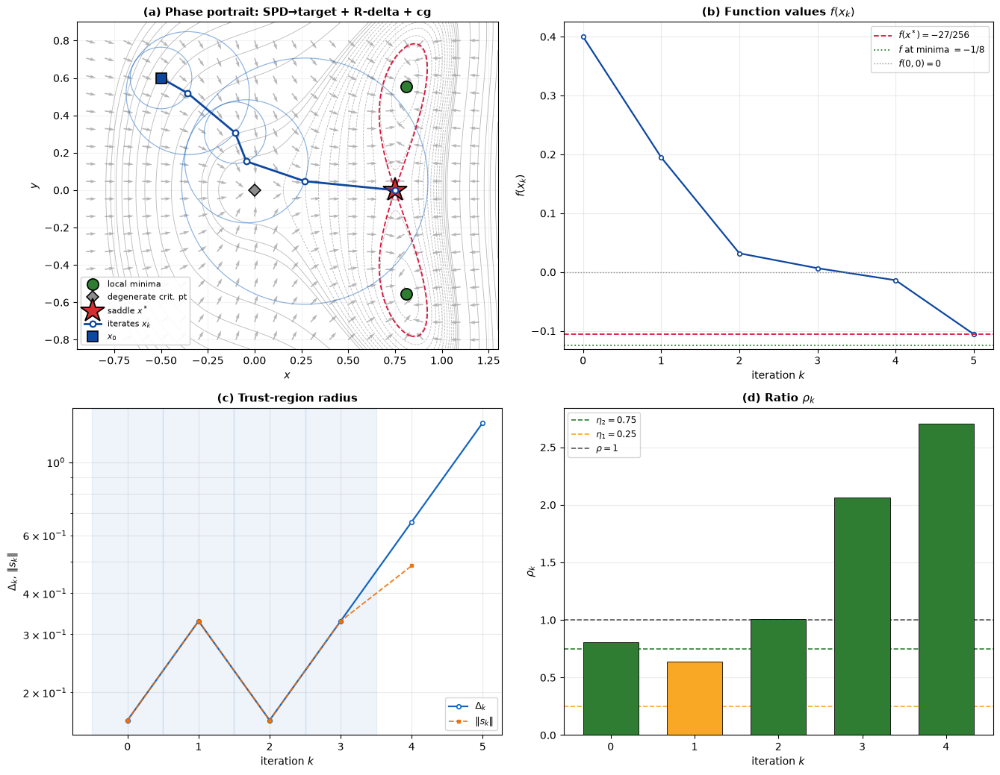

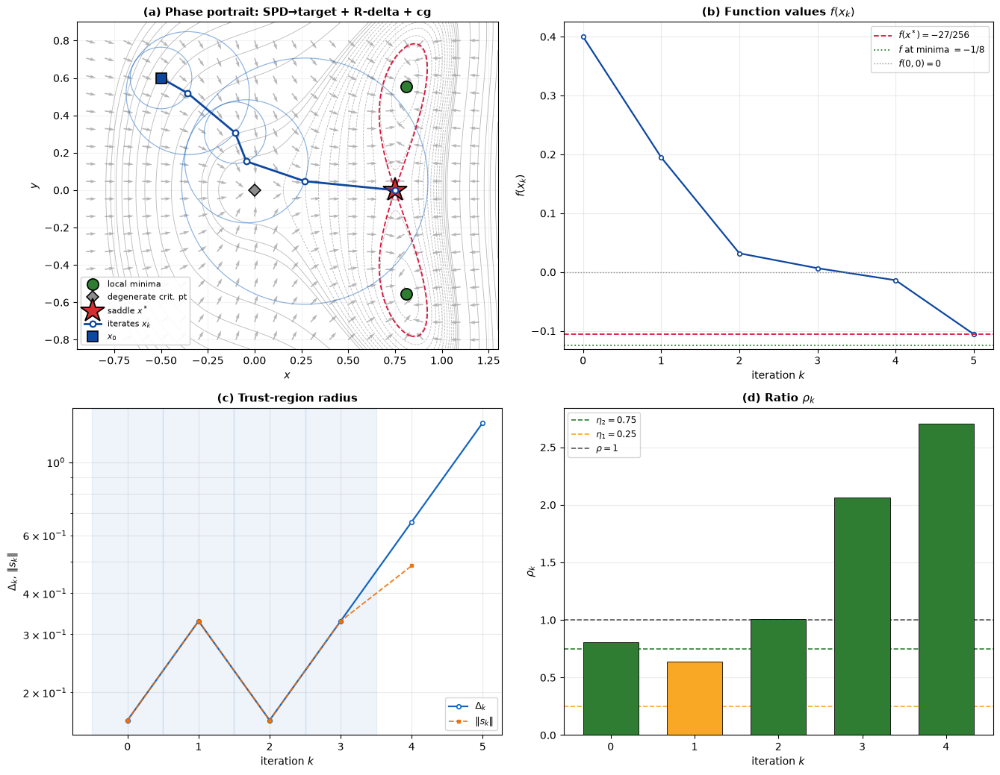

In [65]:
diagnose(radius=RDelta(),        model=SPDTarget(target=SADDLE), solver=:cg,
         savepath="diag_spd_saddle.pdf")

SR1 + R-grad(μmax=1) + exact : converged in 31 iters -> min-


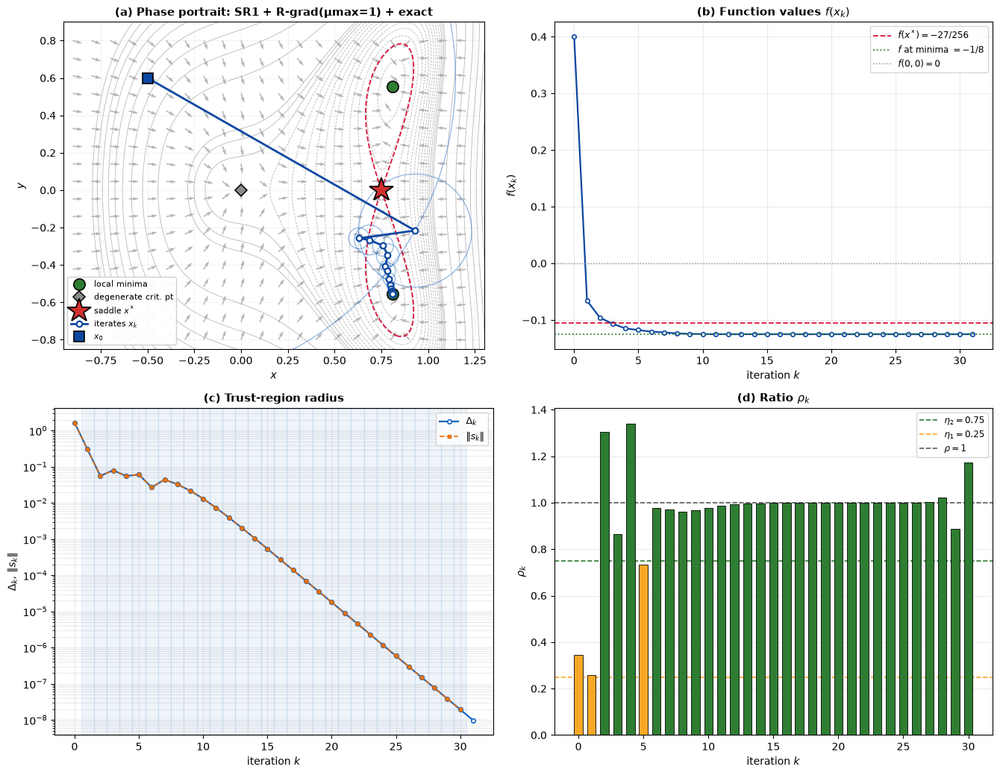

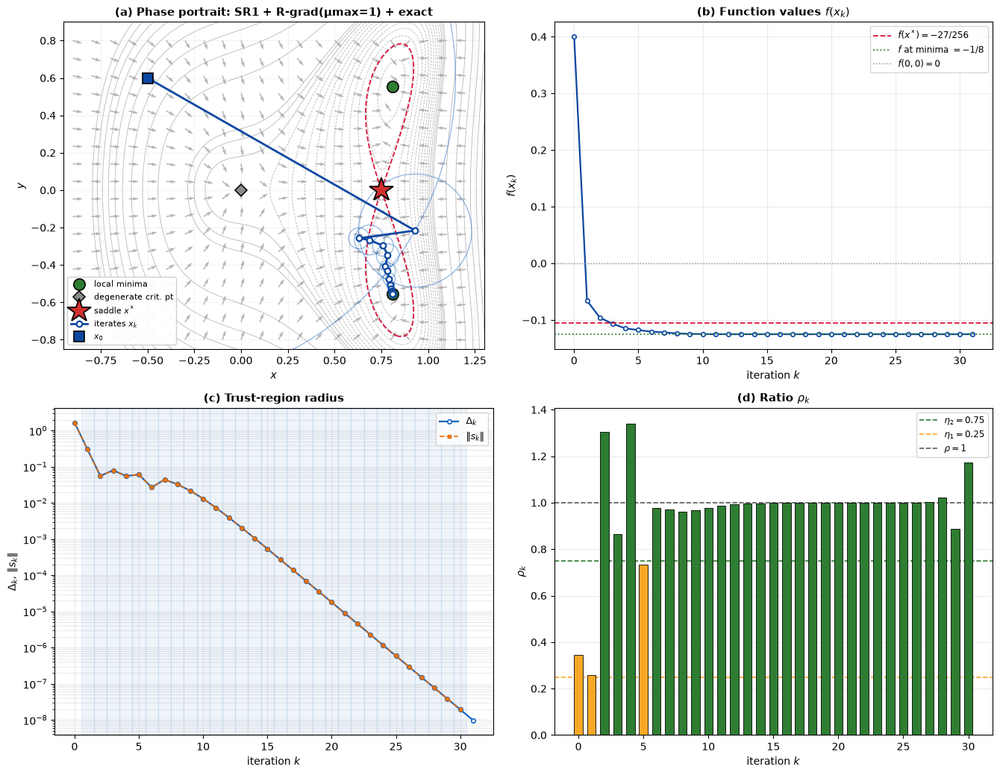

In [66]:
diagnose(radius=RGrad(μmax=1.0), model=SR1(),        solver=:exact,
         savepath="diag_sr1_min.pdf")

true + R-DFO(ζ=1) + cg : converged in 15 iters -> origin


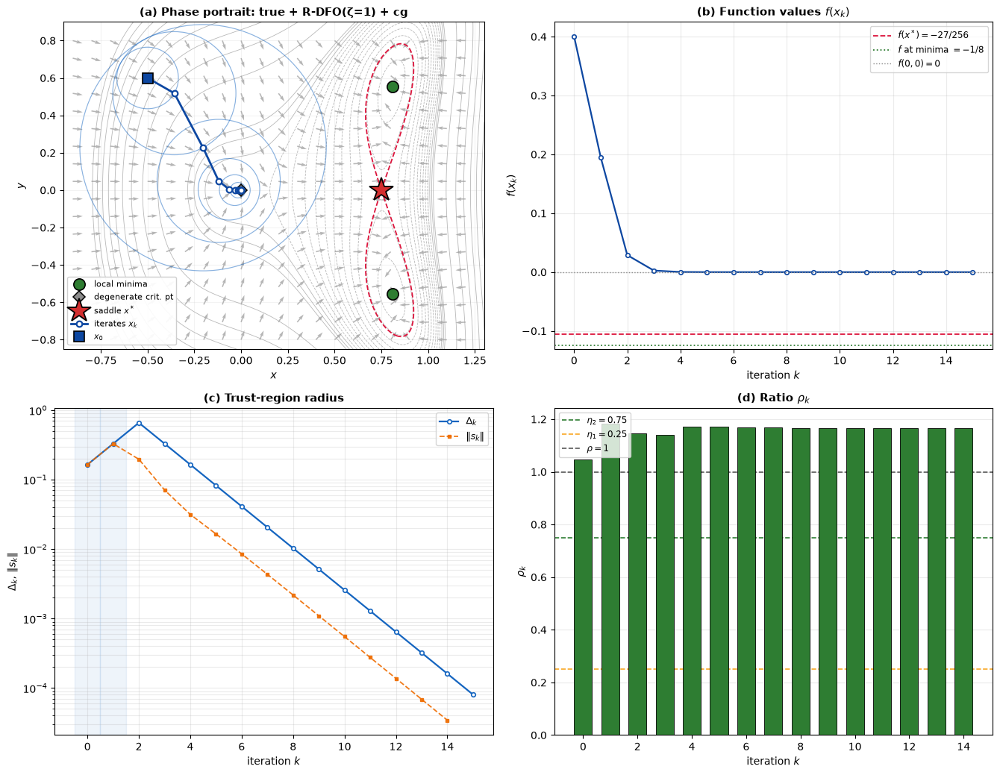

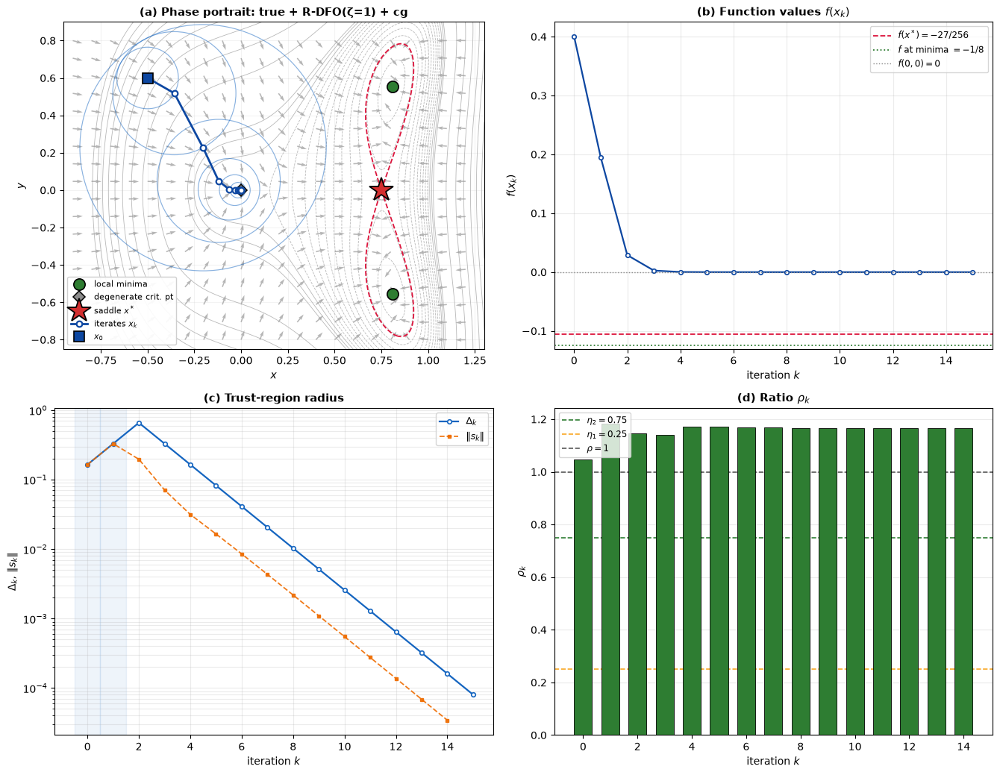

In [67]:
diagnose(radius=RDFO(ζ=1.0),     model=TrueHessian(), solver=:cg,
         savepath="diag_true_origin.pdf")

true + R-grad(μmax=1) + cg : converged in 5763 iters -> origin


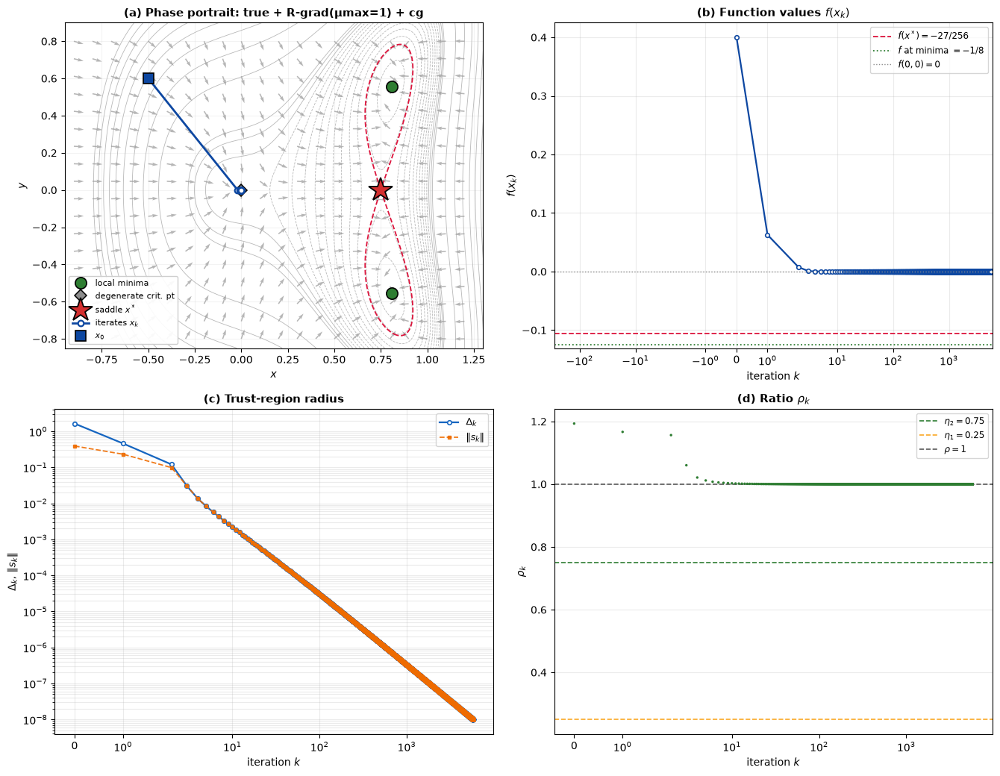

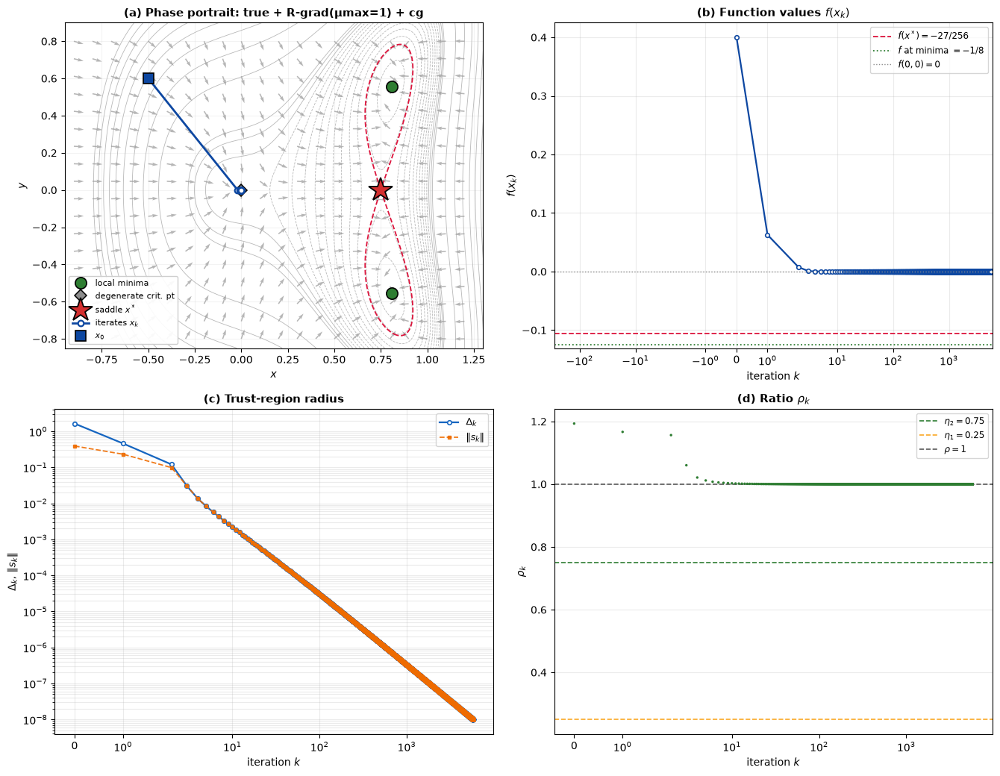

In [70]:
diagnose(radius=RGrad(μmax=1), model=TrueHessian(), solver=:cg, kmax=60000,
         savepath="diag_crawl.pdf") 

### Figure 1 — phase portrait with iterate trajectories

Rendered with **PyPlot.jl** (matplotlib) for publication-quality output. Level sets in grey, the
normalised negative-gradient field as a quiver, and the four critical points marked. Trust-region
circles are deliberately omitted: with several trajectories overlaid they obscure the level sets,
and the point of this figure is *where the runs go*, not how large the region was at each step.

The three trajectories are chosen to be the ones with genuinely different limits — the same
starting point delivered to three different critical points by three different model Hessians.

One detail is worth watching. The true-Hessian and SPD runs are **identical for $k = 0,\dots,3$**:
the initial radius is small enough that CG truncates at the Cauchy point, so the step is along
$-g_k$ and the model Hessian has no influence on the direction at all. They separate only at
$k=4$, once the radius has grown enough for CG to take a second iteration. The curves are drawn
widest-first so the coincident opening segment stays visible for all of them.

In [18]:
using PyPlot

"""
    plot_phase(runs; savepath=nothing, x0=X0_FIG)

Phase portrait with level sets, the normalised negative-gradient field, the four critical
points, and one polyline per run. `runs` is a vector of `(label, rows, colour, marker)`.
No trust-region circles: they obscure the level sets when several runs are overlaid.
"""
function plot_phase(runs; savepath=nothing, x0=X0_FIG,
                    xlims=(-0.85, 1.30), ylims=(-0.85, 0.90))
    fig = PyPlot.figure(figsize=(8.6, 6.4))
    ax  = fig.add_subplot(1, 1, 1)

    # ---------- level sets ----------
    xg = range(xlims[1], xlims[2], length=420)
    yg = range(ylims[1], ylims[2], length=380)
    Xg = [xi for yi in yg, xi in xg]
    Yg = [yi for yi in yg, xi in xg]
    Zg = @. Xg^4 - Xg^3 + (0.25 - Xg/2)*Yg^2 + Yg^4/4
    lv = sort(vcat(collect(range(-0.13, 0.02, length=14)),
                   collect(range(0.03, 0.9, length=10))))
    ax.contour(Xg, Yg, Zg, levels=lv, colors="0.72", linewidths=0.6, zorder=1)
    ax.contour(Xg, Yg, Zg, levels=[f(SADDLE)], colors="crimson",
               linewidths=1.3, linestyles="--", zorder=2)

    # ---------- normalised -grad field ----------
    xq = range(xlims[1]+0.05, xlims[2]-0.05, length=22)
    yq = range(ylims[1]+0.05, ylims[2]-0.05, length=18)
    QX = Float64[]; QY = Float64[]; QU = Float64[]; QV = Float64[]
    for xi in xq, yi in yq
        gg = -grad([xi, yi]); n = norm(gg)
        n == 0 && continue
        push!(QX, xi); push!(QY, yi); push!(QU, gg[1]/n); push!(QV, gg[2]/n)
    end
    ax.quiver(QX, QY, QU, QV, color="0.62", width=0.0028, scale=42, alpha=0.75, zorder=1)

    # ---------- the invariant line {y = 0} ----------
    ax.plot([xlims[1], xlims[2]], [0.0, 0.0], "-", color="0.45", lw=0.9,
            alpha=0.8, zorder=2, label="invariant line \$y=0\$")

    # ---------- critical points ----------
    ax.plot([MINP[1], MINM[1]], [MINP[2], MINM[2]], "o", ms=10, mfc="#2e7d32",
            mec="k", mew=1.2, zorder=6, label="local minima")
    ax.plot([ORIGIN[1]], [ORIGIN[2]], "D", ms=8, mfc="0.55", mec="k", mew=1.1,
            zorder=6, label="degenerate crit. pt")
    ax.plot([SADDLE[1]], [SADDLE[2]], "*", ms=22, mfc="#d32f2f", mec="k", mew=1.3,
            zorder=7, label="saddle \$x^*\$")

    # ---------- trajectories ----------
    # Draw widest-first: several runs share their opening iterations exactly (the radius
    # is small enough that CG truncates at the Cauchy point, so the model is irrelevant
    # until it grows). Tapering the width lets every coincident curve stay visible.
    nR = length(runs)
    for (j, (lab, rr, col, mk)) in enumerate(runs)
        P  = hcat([r.x for r in rr]...)
        lw = 4.2 - 1.1*(j-1)
        ms = 8.0 - 1.6*(j-1)
        ax.plot(P[1,:], P[2,:], "-"*mk, color=col, ms=ms, lw=lw, mfc="white",
                mec=col, mew=1.3, alpha=0.95, zorder=7+j, label=lab)
        if rr[end].status == "breakdown"
            ax.plot([P[1,end]], [P[2,end]], "X", ms=13, mfc="#c62828", mec="k",
                    mew=1.3, zorder=10)
        end
    end
    ax.plot([x0[1]], [x0[2]], "s", ms=10, mfc="k", mec="k", mew=1.2,
            zorder=9, label="\$x_0\$")

    ax.set_xlabel("\$x\$"); ax.set_ylabel("\$y\$")
    ax.legend(loc="lower left", fontsize=8, framealpha=0.93)
    ax.set_xlim(xlims...); ax.set_ylim(ylims...)
    ax.set_aspect("equal"); ax.grid(alpha=0.14)

    PyPlot.tight_layout()
    savepath === nothing || PyPlot.savefig(savepath, bbox_inches="tight")
    return fig
end

plot_phase

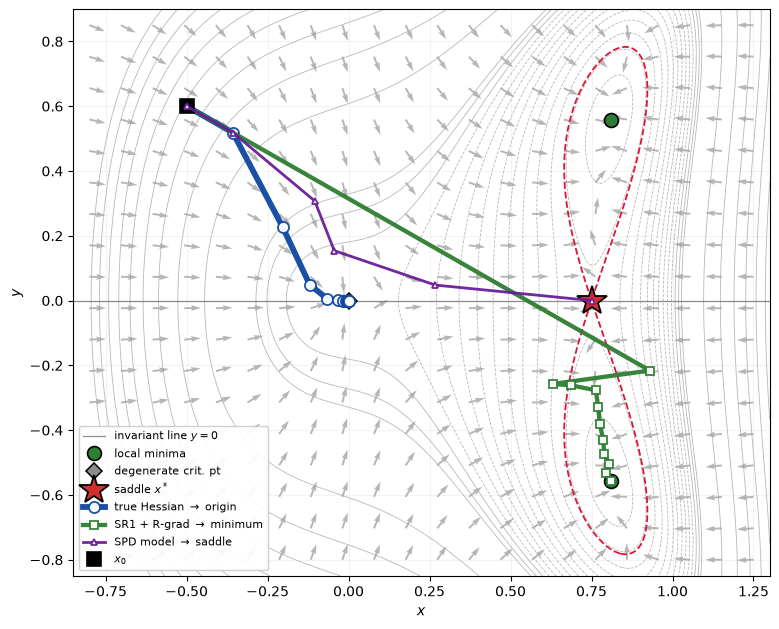

✓ wrote fig1_phase_portrait.pdf


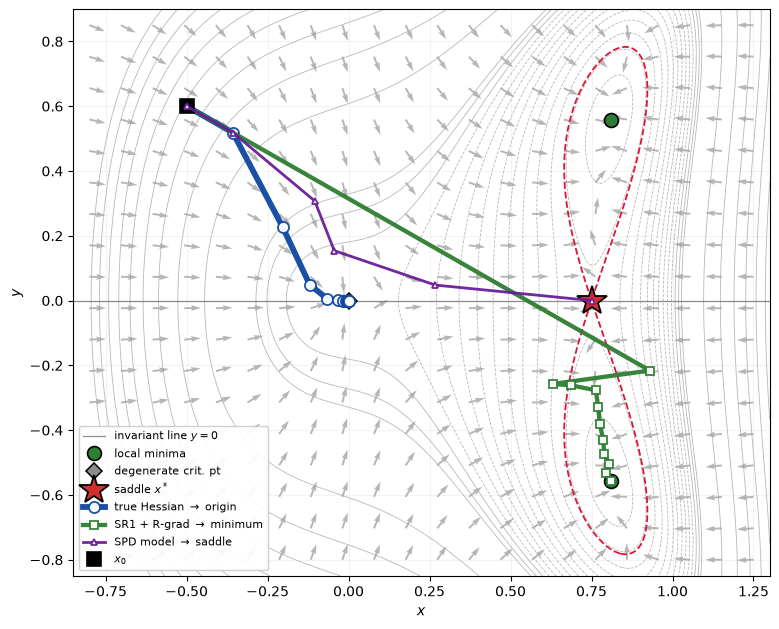

In [19]:
# ---- the three runs with genuinely different limits ----
X0_FIG = [-0.5, 0.6]

rows_true, _, _ = run_tr(X0_FIG; radius=RDelta(), model=TrueHessian(),
                         solver=:cg, kmax=4000, tol=1e-8)
rows_qn,   _, _ = run_tr(X0_FIG; radius=RGrad(μmax=1.0), model=SR1(),
                         solver=:cg, kmax=4000, tol=1e-8)
rows_spd,  _, _ = run_tr(X0_FIG; radius=RDelta(), model=SPDTarget(target=SADDLE),
                         solver=:cg, kmax=4000, tol=1e-8)

fig1 = plot_phase([("true Hessian \$\\to\$ origin",        rows_true, "#0d47a1", "o"),
                   ("SR1 + R-grad \$\\to\$ minimum",       rows_qn,   "#2e7d32", "s"),
                   ("SPD model \$\\to\$ saddle",           rows_spd,  "#6a1b9a", "^")];
                  savepath="fig1_phase_portrait.pdf");
display(fig1);
println("✓ wrote fig1_phase_portrait.pdf");

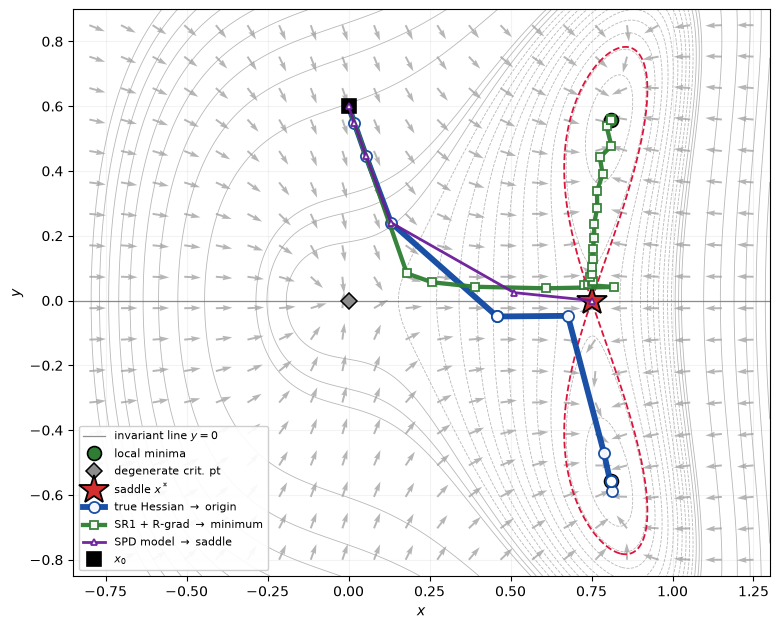

✓ wrote fig1_phase_portrait.pdf


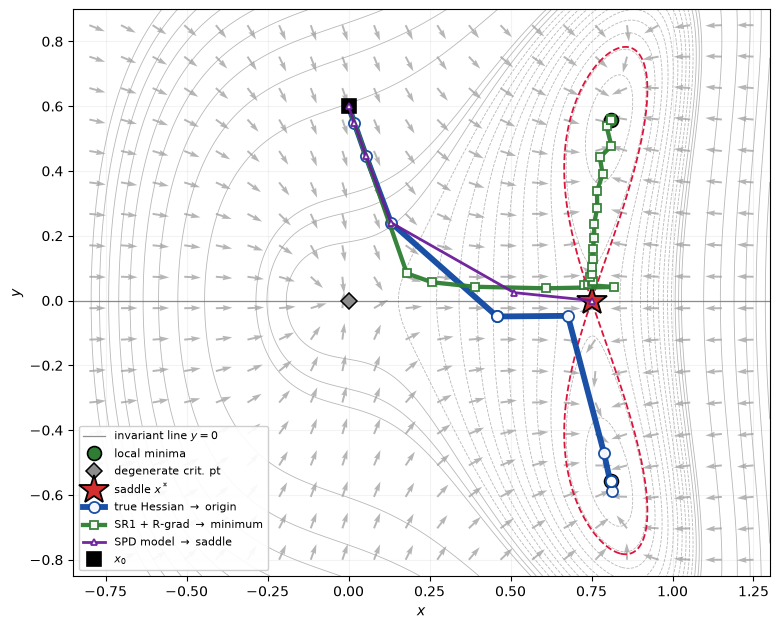

In [20]:
# ---- the three runs with genuinely different limits ----
X0_FIG = [0.0, 0.6]

rows_true, _, _ = run_tr(X0_FIG; radius=RDelta(), model=TrueHessian(),
                         solver=:cg, kmax=4000, tol=1e-8)
rows_qn,   _, _ = run_tr(X0_FIG; radius=RGrad(μmax=1.0), model=SR1(),
                         solver=:cg, kmax=4000, tol=1e-8)
rows_spd,  _, _ = run_tr(X0_FIG; radius=RDelta(), model=SPDTarget(target=SADDLE),
                         solver=:cg, kmax=4000, tol=1e-8)

fig1 = plot_phase([("true Hessian \$\\to\$ origin",        rows_true, "#0d47a1", "o"),
                   ("SR1 + R-grad \$\\to\$ minimum",       rows_qn,   "#2e7d32", "s"),
                   ("SPD model \$\\to\$ saddle",           rows_spd,  "#6a1b9a", "^")];
                  savepath="fig1_phase_portrait.pdf")
display(fig1)
println("✓ wrote fig1_phase_portrait.pdf")

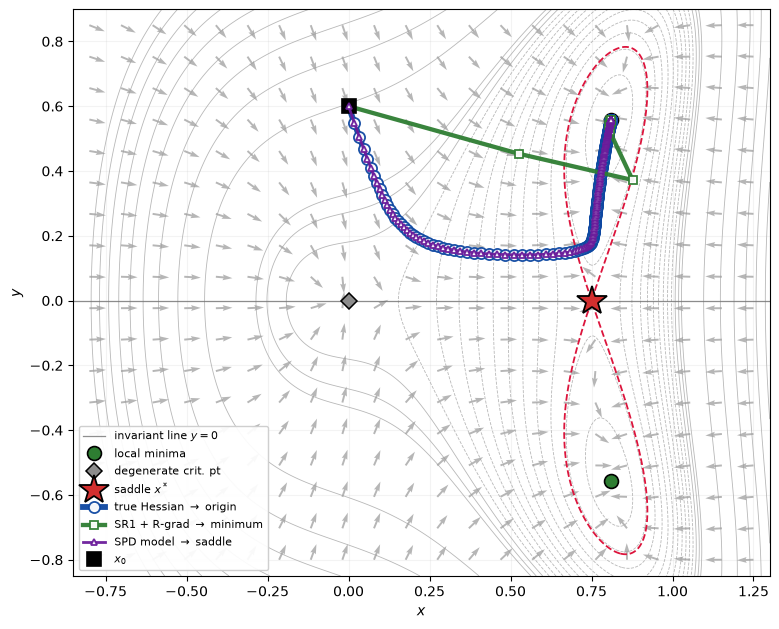

✓ wrote fig1_phase_portrait.pdf


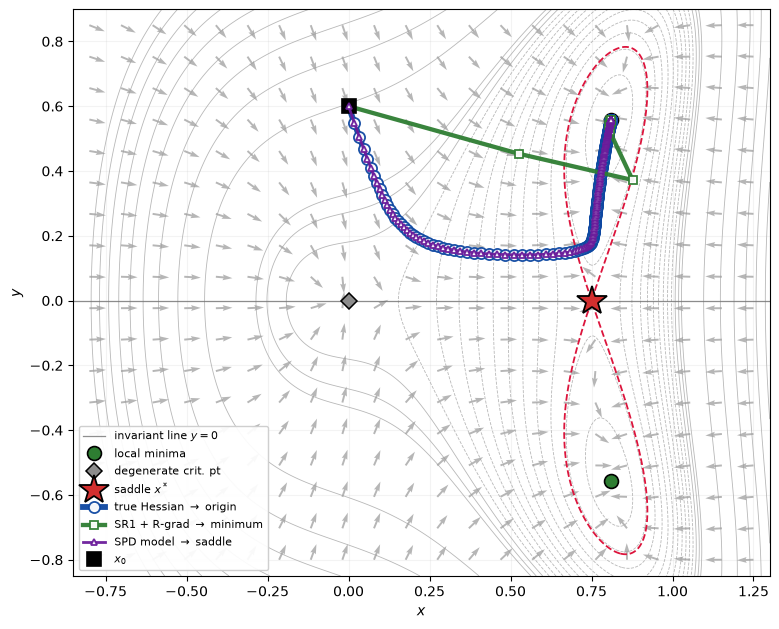

In [21]:
# ---- the three runs with genuinely different limits ----
X0_FIG = [0.0, 0.6]

rows_true, _, _ = run_tr(X0_FIG; radius=RGrad(μmax=0.1), model=TrueHessian(),
                         solver=:cg, kmax=4000, tol=1e-8)
rows_qn,   _, _ = run_tr(X0_FIG; radius=RGrad(μmax=1.0), model=TrueHessian(),
                         solver=:cg, kmax=4000, tol=1e-8)
rows_spd,  _, _ = run_tr(X0_FIG; radius=RGrad(μmax=0.1), model=TrueHessian(),
                         solver=:cg, kmax=4000, tol=1e-8)

fig1 = plot_phase([("true Hessian \$\\to\$ origin",        rows_true, "#0d47a1", "o"),
                   ("SR1 + R-grad \$\\to\$ minimum",       rows_qn,   "#2e7d32", "s"),
                   ("SPD model \$\\to\$ saddle",           rows_spd,  "#6a1b9a", "^")];
                  savepath="fig1_phase_portrait.pdf")
display(fig1)
println("✓ wrote fig1_phase_portrait.pdf")

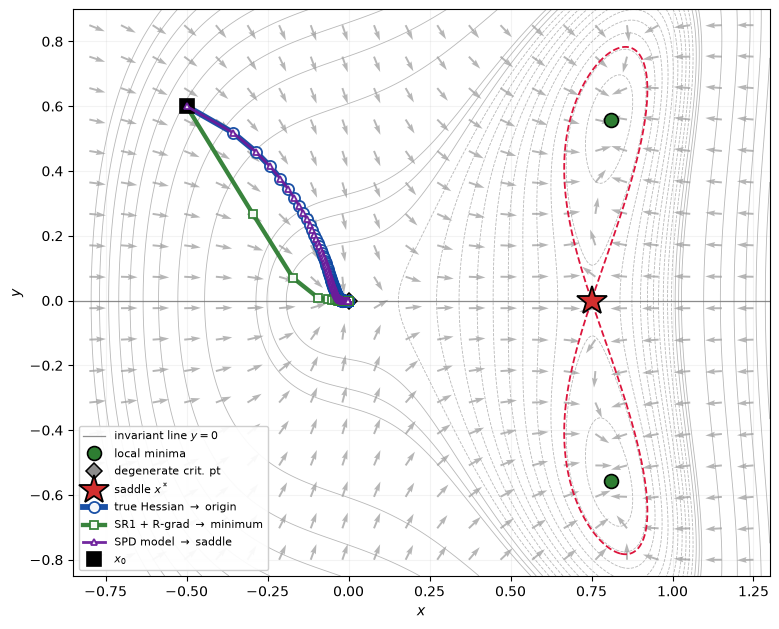

✓ wrote fig1_phase_portrait.pdf


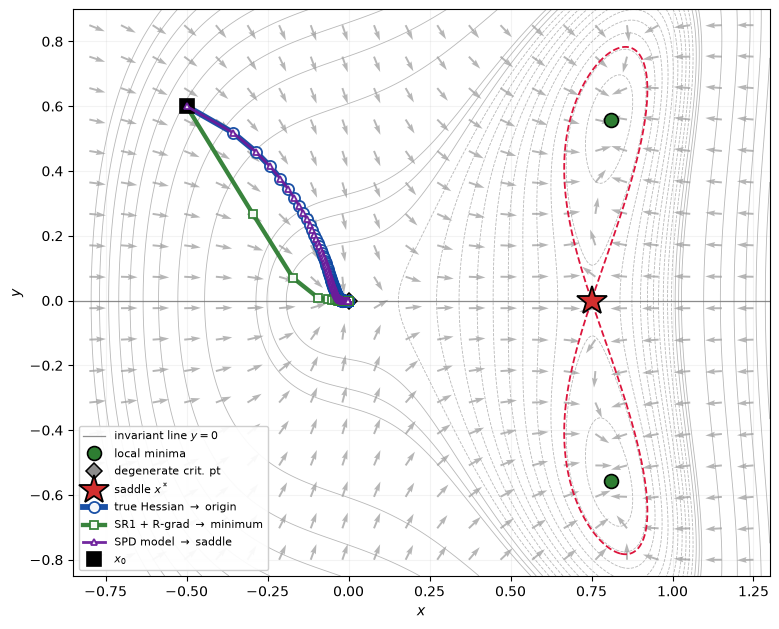

In [22]:
# ---- the three runs with genuinely different limits ----
X0_FIG = [-0.5, 0.6]

rows_true, _, _ = run_tr(X0_FIG; radius=RGrad(μmax=0.1), model=TrueHessian(),
                         solver=:cg, kmax=4000, tol=1e-8)
rows_qn,   _, _ = run_tr(X0_FIG; radius=RGrad(μmax=1.0), model=TrueHessian(),
                         solver=:cg, kmax=4000, tol=1e-8)
rows_spd,  _, _ = run_tr(X0_FIG; radius=RGrad(μmax=0.1), model=TrueHessian(),
                         solver=:cg, kmax=4000, tol=1e-8)

fig1 = plot_phase([("true Hessian \$\\to\$ origin",        rows_true, "#0d47a1", "o"),
                   ("SR1 + R-grad \$\\to\$ minimum",       rows_qn,   "#2e7d32", "s"),
                   ("SPD model \$\\to\$ saddle",           rows_spd,  "#6a1b9a", "^")];
                  savepath="fig1_phase_portrait.pdf")
display(fig1)
println("✓ wrote fig1_phase_portrait.pdf")

ζ =    0.001 : maxiter     k =  3999, limit = maxiter    |x_final| = 7.291e-02
ζ =    0.100 : stagnated   k =   556, limit = min+       |x_final| = 9.816e-01
ζ =    0.500 : converged   k =    44, limit = min+       |x_final| = 9.816e-01
ζ =    1.000 : converged   k =    19, limit = min+       |x_final| = 9.816e-01
ζ =    2.000 : converged   k =    13, limit = min-       |x_final| = 9.816e-01
ζ =   10.000 : converged   k =    16, limit = min-       |x_final| = 9.816e-01
ζ =  100.000 : converged   k =    16, limit = min-       |x_final| = 9.816e-01


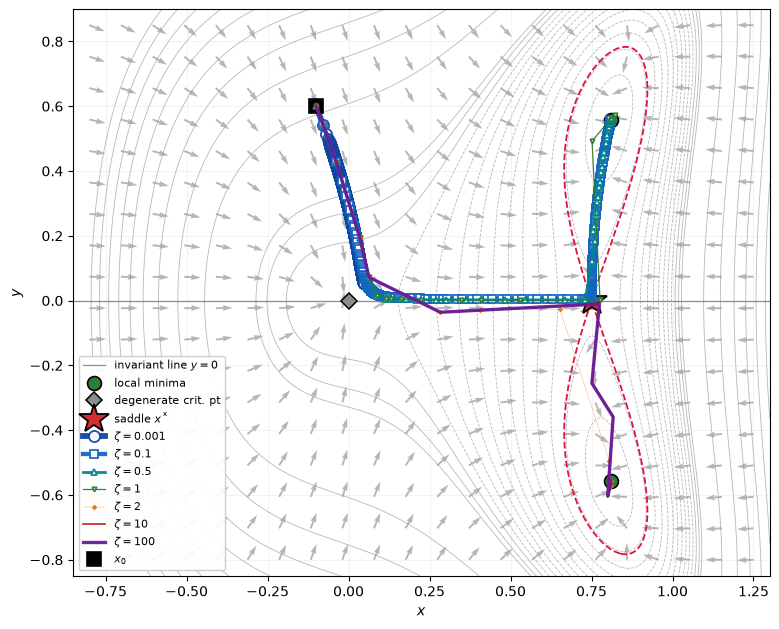

✓ wrote fig4_rdfo_zeta_phase.pdf


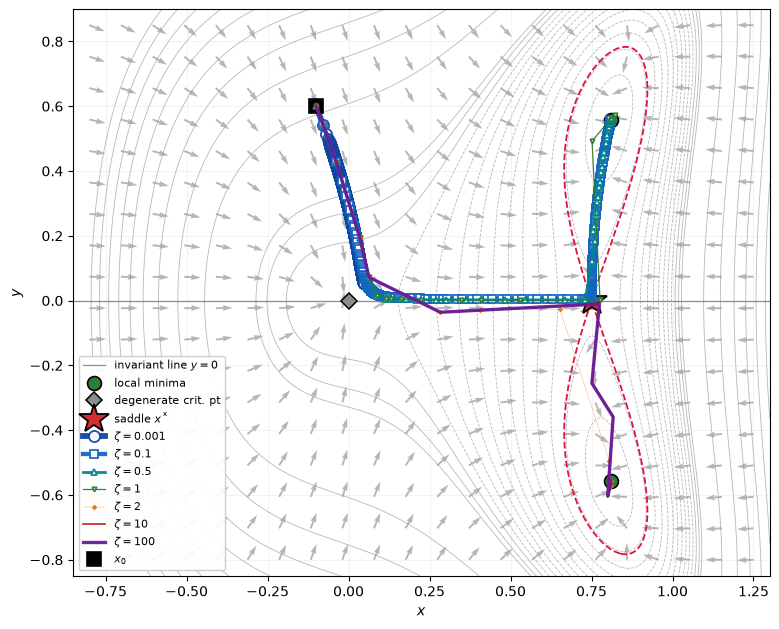

In [23]:
# ---- R-DFO with the true Hessian, across the ζ sweep ----
X0_ZFIG    = [-0.1, 0.6]
ZETA_SWEEP = [0.001, 0.1, 0.5, 1.0, 2.0, 10.0, 100.0]
KMAX_ZFIG  = 4000

ZCOLS = ["#0d47a1", "#1565c0", "#00838f", "#2e7d32",
         "#ef6c00", "#c62828", "#6a1b9a"]
ZMKS  = ["o", "s", "^", "v", "D", "P", "*"]

zeta_runs = Tuple{String,Vector{Row},String,String}[]
for (j, ζ) in enumerate(ZETA_SWEEP)
    rws, st, xf = run_tr(X0_ZFIG; radius=RDFO(ζ=ζ), model=TrueHessian(),
                         solver=:cg, kmax=KMAX_ZFIG, tol=1e-8)
    lab = "\$\\zeta = " * (ζ < 0.01 ? @sprintf("%.3f", ζ) : @sprintf("%g", ζ)) * "\$"
    push!(zeta_runs, (lab, rws, ZCOLS[j], ZMKS[j]))
    @printf("ζ = %8.3f : %-11s k = %5d, limit = %-10s |x_final| = %.3e\n",
            ζ, st, rws[end].k, classify(xf, st; tol=1e-3), norm(xf))
end

fig_z = plot_phase(zeta_runs; x0 = X0_ZFIG,
                   savepath = "fig4_rdfo_zeta_phase.pdf")
display(fig_z)
println("✓ wrote fig4_rdfo_zeta_phase.pdf")

ζ =    0.001 : maxiter     k =  3999, limit = maxiter    |x_final| = 5.010e-02
ζ =    0.100 : converged   k =    15, limit = origin     |x_final| = 3.913e-05
ζ =    0.500 : converged   k =    15, limit = origin     |x_final| = 3.913e-05
ζ =    1.000 : converged   k =    15, limit = origin     |x_final| = 3.913e-05
ζ =    2.000 : converged   k =    15, limit = origin     |x_final| = 3.913e-05
ζ =   10.000 : converged   k =    15, limit = origin     |x_final| = 3.913e-05
ζ =  100.000 : converged   k =    15, limit = origin     |x_final| = 3.913e-05


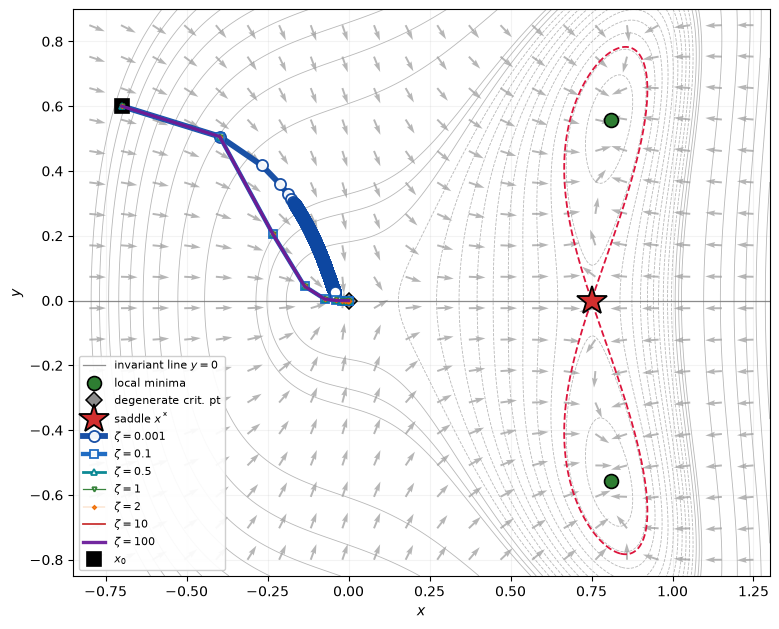

✓ wrote fig4_rdfo_zeta_phase.pdf


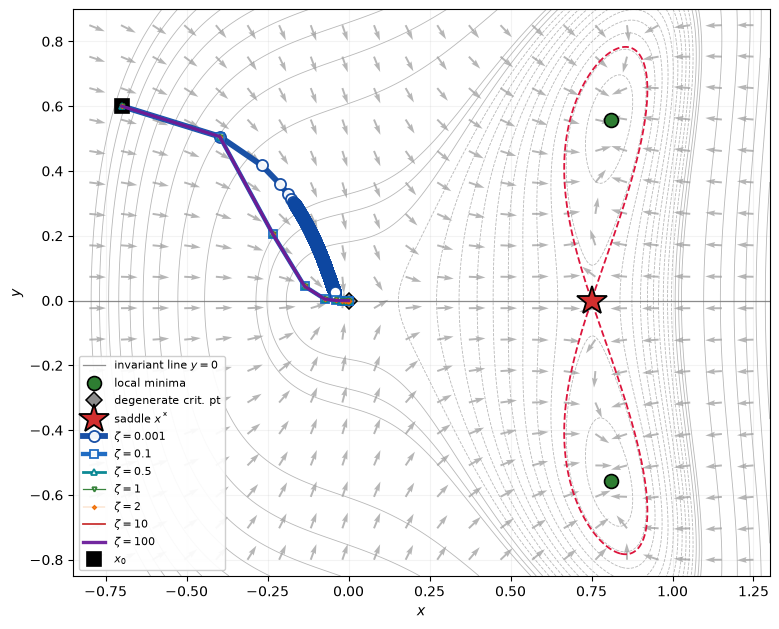

In [24]:
# ---- R-DFO with the true Hessian, across the ζ sweep ----
X0_ZFIG    = [-0.7, 0.6]
ZETA_SWEEP = [0.001, 0.1, 0.5, 1.0, 2.0, 10.0, 100.0]
KMAX_ZFIG  = 4000

ZCOLS = ["#0d47a1", "#1565c0", "#00838f", "#2e7d32",
         "#ef6c00", "#c62828", "#6a1b9a"]
ZMKS  = ["o", "s", "^", "v", "D", "P", "*"]

zeta_runs = Tuple{String,Vector{Row},String,String}[]
for (j, ζ) in enumerate(ZETA_SWEEP)
    rws, st, xf = run_tr(X0_ZFIG; radius=RDFO(ζ=ζ), model=TrueHessian(),
                         solver=:cg, kmax=KMAX_ZFIG, tol=1e-8)
    lab = "\$\\zeta = " * (ζ < 0.01 ? @sprintf("%.3f", ζ) : @sprintf("%g", ζ)) * "\$"
    push!(zeta_runs, (lab, rws, ZCOLS[j], ZMKS[j]))
    @printf("ζ = %8.3f : %-11s k = %5d, limit = %-10s |x_final| = %.3e\n",
            ζ, st, rws[end].k, classify(xf, st; tol=1e-3), norm(xf))
end

fig_z = plot_phase(zeta_runs; x0 = X0_ZFIG,
                   savepath = "fig4_rdfo_zeta_phase.pdf")
display(fig_z)
println("✓ wrote fig4_rdfo_zeta_phase.pdf")

In [25]:
# ---- R-DFO with the true Hessian, across the ζ sweep ----
X0_ZFIG    = [-0.5, 0.6]
ZETA_SWEEP = [0.001, 0.01,  0.1, 0.5, 1.0, 2.0, 10.0, 100.0]
KMAX_ZFIG  = 4000

ZCOLS = ["#0d47a1", "#1565c0", "#00838f", "#2e7d32",
         "#ef6c00", "#c62828", "#6a1b9a", "#d32f2f"]
ZMKS  = ["o", "s", "^", "v", "D", "P", "*", "X"]

"Run the ζ sweep for one model, printing a summary and returning plot tuples.
 Bit-identical trajectories are plotted once and named jointly in the legend."
function zeta_sweep(modelf; x0=X0_ZFIG, ζs=ZETA_SWEEP, kmax=KMAX_ZFIG, label="")
    runs = Tuple{String,Vector{Row},String,String}[]
    seen = Matrix{Float64}[]
    dups = Dict{Int,Vector{Float64}}()          # first-occurrence index -> ζ values merged
    println("R-DFO ζ sweep — ", label, ", from ", x0, "\n")
    @printf("%9s %7s %-11s %-11s %10s\n", "ζ", "iters", "status", "limit", "λmin(∇²f)")
    println("-"^54)
    for (j, ζ) in enumerate(ζs)
        rws, st, xf = run_tr(x0; radius=RDFO(ζ=ζ), model=modelf(),
                             solver=:cg, kmax=kmax, tol=1e-8)
        P = hcat([r.x for r in rws]...)
        dup = findfirst(Q -> size(Q) == size(P) && Q == P, seen)
        push!(seen, P)
        λH = eigvals(Symmetric(hess(xf)))[1]
        @printf("%9.3f %7d %-11s %-11s %10.4f%s\n",
                ζ, rws[end].k, st, classify(xf, st; tol=1e-3), λH,
                dup === nothing ? "" : @sprintf("  [= ζ %g]", ζs[dup]))
        if dup === nothing
            push!(runs, ("\$\\zeta = " * @sprintf("%g", ζ) * "\$", rws, ZCOLS[j], ZMKS[j]))
            dups[length(runs)] = Float64[]
        else
            ri = findfirst(k -> seen[dup] == hcat([r.x for r in runs[k][2]]...), eachindex(runs))
            ri === nothing || push!(dups[ri], ζ)
        end
    end
    # name any saturated family in its legend entry
    for (ri, extra) in dups
        isempty(extra) && continue
        lab, rr, col, mk = runs[ri]
        runs[ri] = (lab * " (= " * join(map(x -> @sprintf("%g", x), extra), ", ") * ")",
                    rr, col, mk)
    end
    return runs
end

zeta_sweep

R-DFO ζ sweep — true Hessian, from [-0.5, 0.6]

        ζ   iters status      limit        λmin(∇²f)
------------------------------------------------------
    0.001    3999 maxiter     maxiter         0.2838
    0.010    3999 maxiter     maxiter         0.0445
    0.100      15 converged   origin          0.0002
    0.500      15 converged   origin          0.0002
    1.000      15 converged   origin          0.0002  [= ζ 0.5]
    2.000      15 converged   origin          0.0002  [= ζ 0.5]
   10.000      15 converged   origin          0.0002  [= ζ 0.5]
  100.000      15 converged   origin          0.0002  [= ζ 0.5]


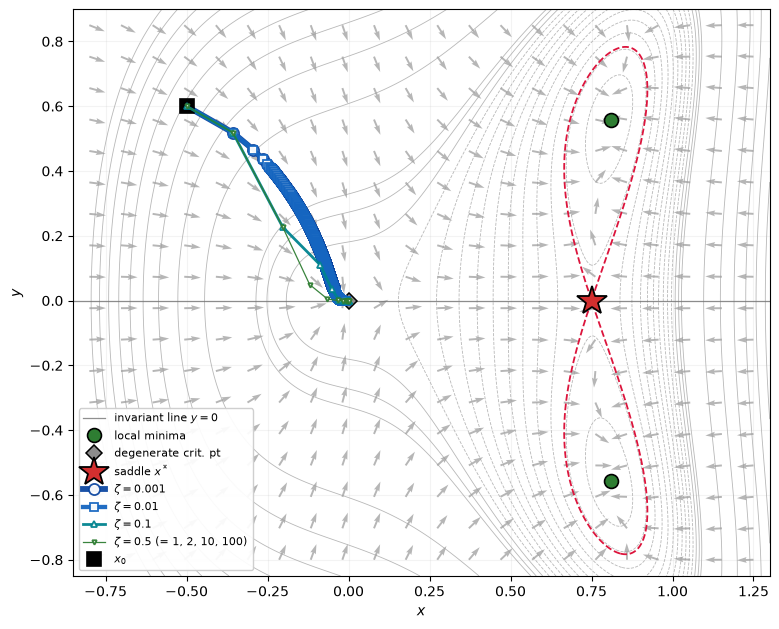


✓ wrote fig9_rdfo_zeta_true_phase.pdf


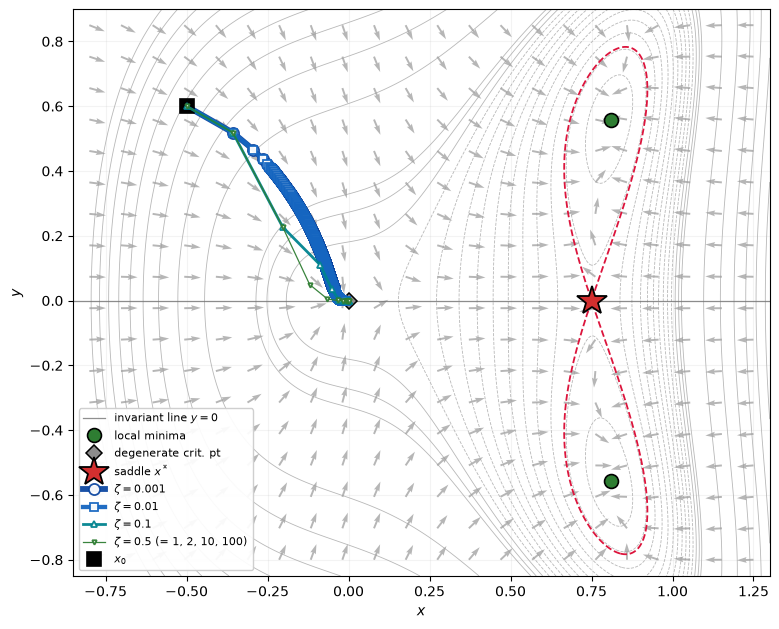

In [26]:
runs_z_true = zeta_sweep(() -> TrueHessian(); label = "true Hessian")

fig_z_true = plot_phase(runs_z_true; x0 = X0_ZFIG,
                        savepath = "fig9_rdfo_zeta_true_phase.pdf")
display(fig_z_true)
println("\n✓ wrote fig9_rdfo_zeta_true_phase.pdf")

R-DFO ζ sweep — SR1, from [-0.5, 0.6]

        ζ   iters status      limit        λmin(∇²f)
------------------------------------------------------
    0.001    3999 maxiter     maxiter         0.2838
    0.010    3999 maxiter     maxiter         0.0445
    0.100    3999 maxiter     origin          0.0047
    0.500    3999 maxiter     origin          0.0009
    1.000    3999 maxiter     origin          0.0005
    2.000    2675 converged   origin          0.0003
   10.000     290 converged   origin          0.0003
  100.000      21 converged   origin          0.0002


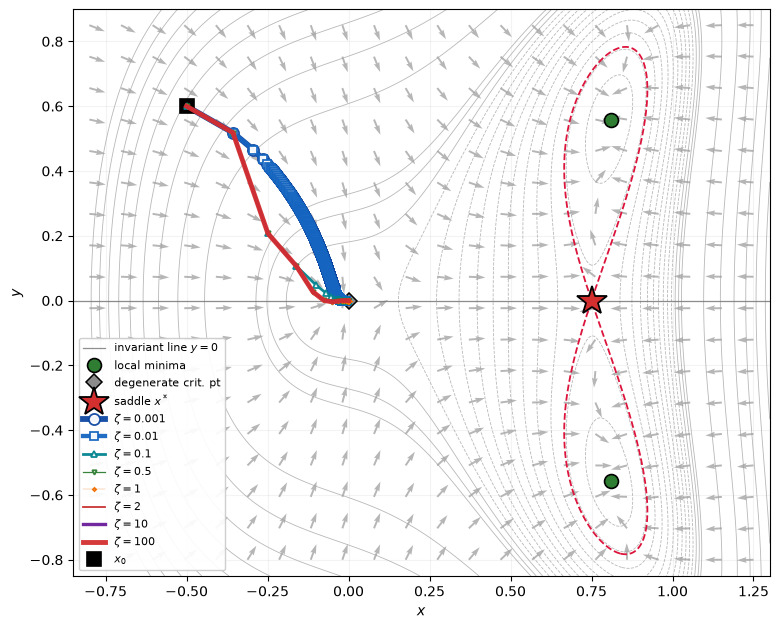


✓ wrote fig10_rdfo_zeta_sr1_phase.pdf


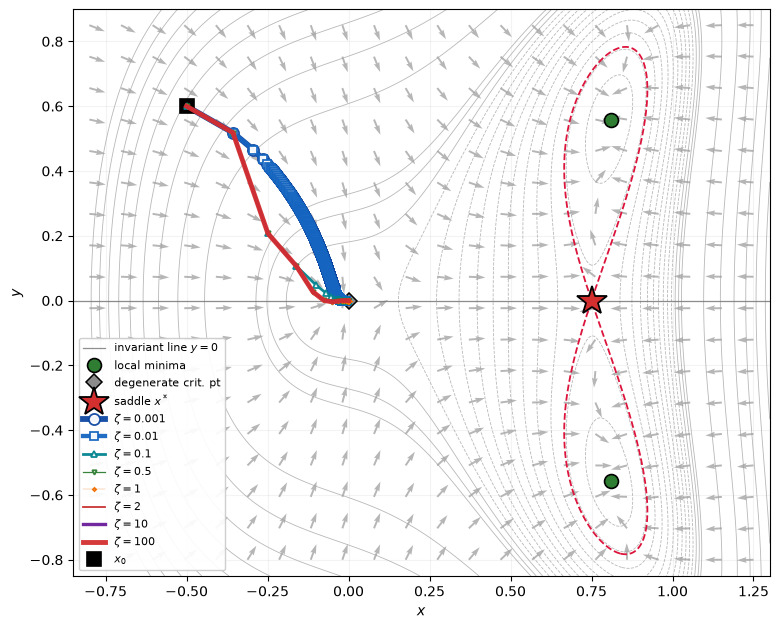

In [27]:
# ---- R-DFO with SR1, across the ζ sweep ----
runs_z_sr1 = zeta_sweep(() -> SR1(); label = "SR1")

fig_z_sr1 = plot_phase(runs_z_sr1; x0 = X0_ZFIG,
                       savepath = "fig10_rdfo_zeta_sr1_phase.pdf")
display(fig_z_sr1)
println("\n✓ wrote fig10_rdfo_zeta_sr1_phase.pdf")

R-DFO ζ sweep — L-BFGS(m=5), from [-0.5, 0.6]

        ζ   iters status      limit        λmin(∇²f)
------------------------------------------------------
    0.001    3999 maxiter     maxiter         0.2838
    0.010    3999 maxiter     maxiter         0.0445
    0.100    3999 maxiter     origin          0.0047
    0.500    3999 maxiter     origin          0.0009
    1.000    3999 maxiter     origin          0.0005
    2.000    1051 converged   origin          0.0003
   10.000      24 converged   origin          0.0001
  100.000      24 converged   origin          0.0001


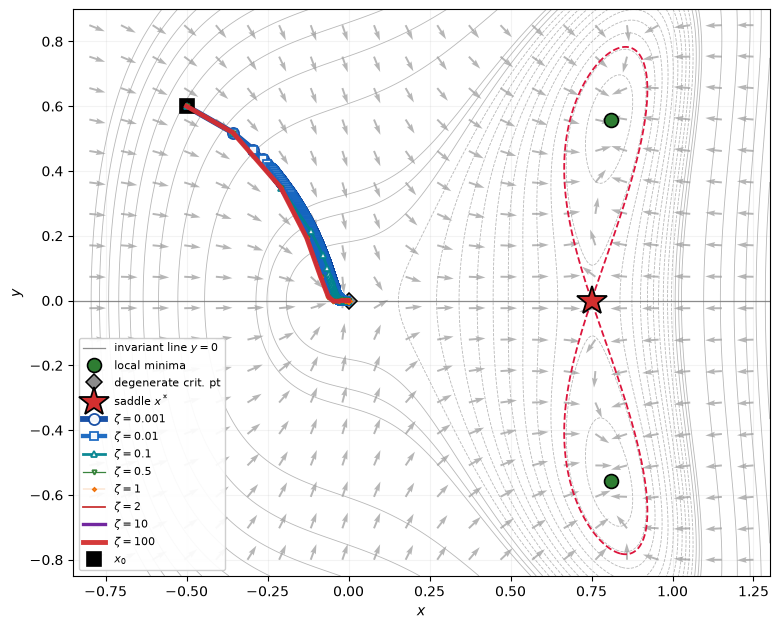


✓ wrote fig11_rdfo_zeta_lbfgs_phase.pdf


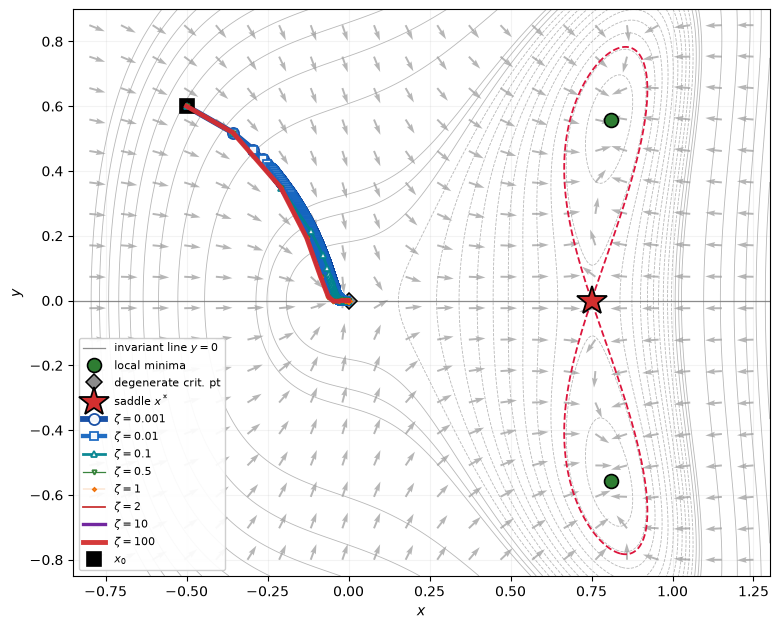

In [28]:
# ---- R-DFO with L-BFGS, across the ζ sweep ----
runs_z_lbfgs = zeta_sweep(() -> LBFGS(m=5); label = "L-BFGS(m=5)")

fig_z_lbfgs = plot_phase(runs_z_lbfgs; x0 = X0_ZFIG,
                         savepath = "fig11_rdfo_zeta_lbfgs_phase.pdf")
display(fig_z_lbfgs)
println("\n✓ wrote fig11_rdfo_zeta_lbfgs_phase.pdf")

R-grad μmax sweep — true Hessian, from [-0.5, 0.6]

     μmax   iters status      limit        λmin(∇²f)
------------------------------------------------------
     0.01    3999 maxiter     maxiter         0.0464
     0.05    3999 maxiter     maxiter         0.0098
     0.10    3999 maxiter     origin          0.0049
     0.30    3999 maxiter     origin          0.0017
     0.50    3999 maxiter     origin          0.0010
     1.00    3999 maxiter     origin          0.0005
     2.00    2880 converged   origin          0.0003
     4.00    1707 converged   origin          0.0003
     8.00     530 converged   origin          0.0003
   128.00      41 converged   origin          0.0003


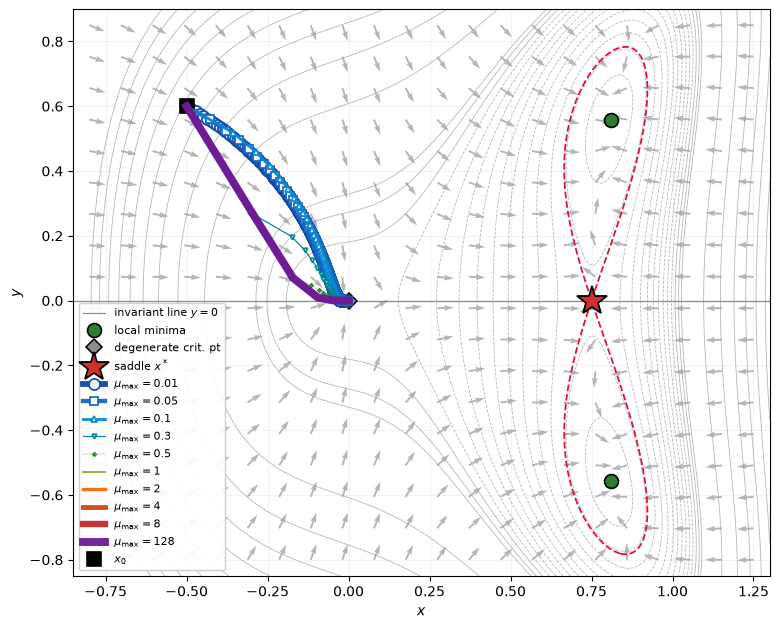


✓ wrote fig6_rgrad_mu_true_phase.pdf


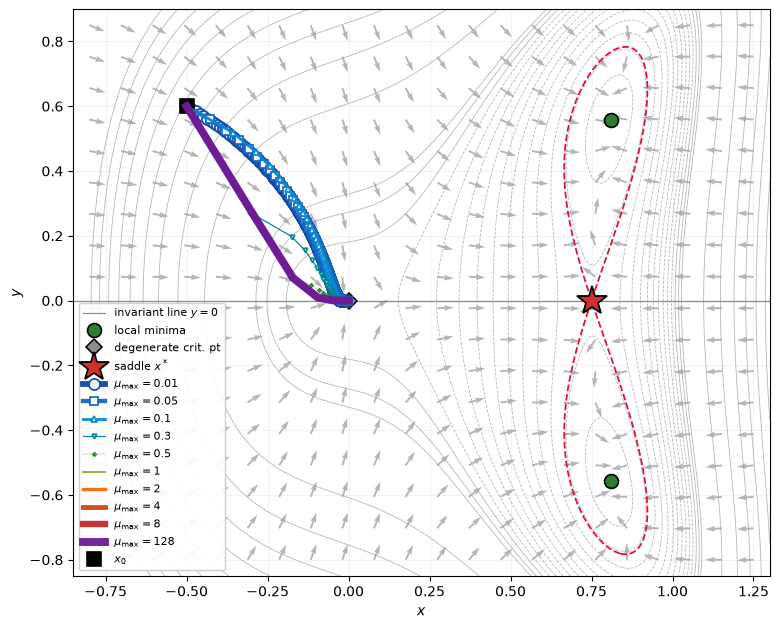

In [29]:
# ---- R-grad with the true Hessian, across the μmax sweep ----
X0_MFIG   = [-0.5, 0.6]
MU_SWEEP  = [0.01, 0.05, 0.1, 0.3, 0.5, 1.0, 2.0, 4.0, 8.0, 128.0]
KMAX_MFIG = 4000

MCOLS = ["#0d47a1", "#1565c0", "#0288d1", "#00838f", "#2e7d32",
         "#9e9d24", "#ef6c00", "#d84315", "#c62828", "#6a1b9a"]
MMKS  = ["o", "s", "^", "v", "D", "P", "*", "X", "<", ">"]

"Run the μmax sweep for one model, printing a summary and returning plot tuples."
function mu_sweep(modelf; x0=X0_MFIG, μs=MU_SWEEP, kmax=KMAX_MFIG, label="")
    runs = Tuple{String,Vector{Row},String,String}[]
    seen = Matrix{Float64}[]
    println("R-grad μmax sweep — ", label, ", from ", x0, "\n")
    @printf("%9s %7s %-11s %-11s %10s\n", "μmax", "iters", "status", "limit", "λmin(∇²f)")
    println("-"^54)
    for (j, μ) in enumerate(μs)
        rws, st, xf = run_tr(x0; radius=RGrad(μmax=μ), model=modelf(),
                             solver=:cg, kmax=kmax, tol=1e-8)
        P = hcat([r.x for r in rws]...)
        dup = findfirst(Q -> size(Q) == size(P) && Q == P, seen)
        push!(seen, P)
        λH = eigvals(Symmetric(hess(xf)))[1]
        @printf("%9.2f %7d %-11s %-11s %10.4f%s\n",
                μ, rws[end].k, st, classify(xf, st; tol=1e-3), λH,
                dup === nothing ? "" : @sprintf("  [= μmax %g]", μs[dup]))
        dup === nothing || continue
        push!(runs, ("\$\\mu_{\\max} = " * @sprintf("%g", μ) * "\$",
                     rws, MCOLS[j], MMKS[j]))
    end
    return runs
end

runs_mu_true = mu_sweep(() -> TrueHessian(); label = "true Hessian")

fig_mu_true = plot_phase(runs_mu_true; x0 = X0_MFIG,
                         savepath = "fig6_rgrad_mu_true_phase.pdf")
display(fig_mu_true)
println("\n✓ wrote fig6_rgrad_mu_true_phase.pdf")

R-grad μmax sweep — SR1, from [-0.5, 0.6]

     μmax   iters status      limit        λmin(∇²f)
------------------------------------------------------
     0.01    3999 maxiter     maxiter         0.0464
     0.05    3999 maxiter     maxiter         0.0098
     0.10    3999 maxiter     origin          0.0049
     0.30    3999 maxiter     origin          0.0016
     0.50      85 stagnated   min+            0.4947
     1.00      15 converged   min-            0.4947
     2.00      18 converged   min-            0.4947
     4.00      14 converged   min-            0.4947
     8.00      16 converged   min-            0.4947
   128.00      18 converged   min-            0.4947


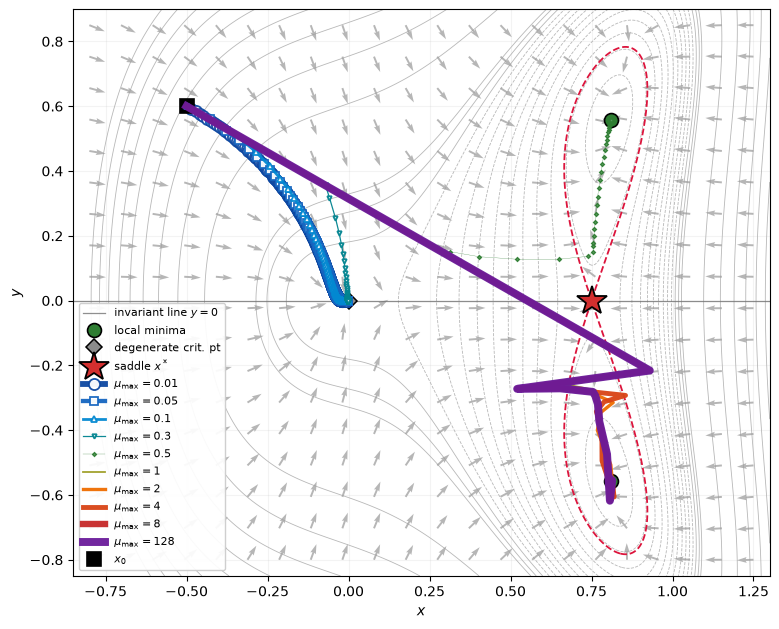


✓ wrote fig7_rgrad_mu_sr1_phase.pdf


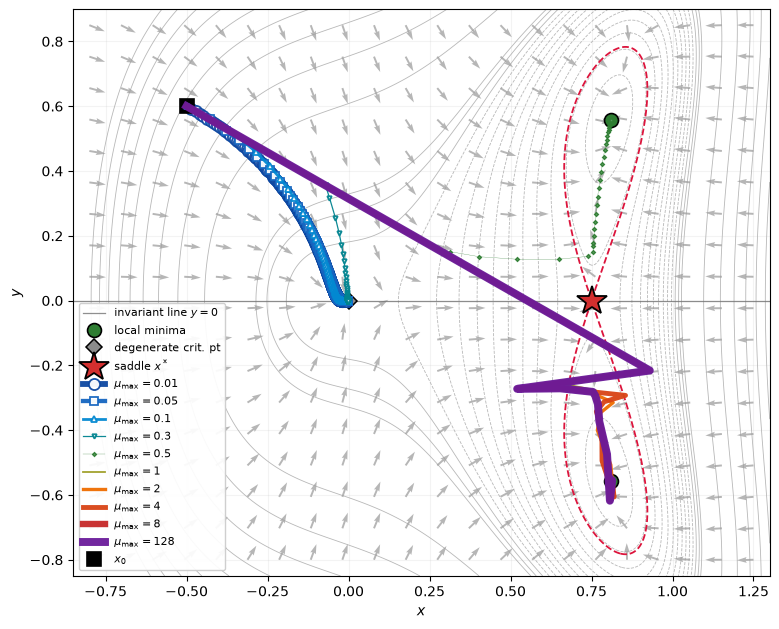

In [30]:
# ---- R-grad with SR1, across the μmax sweep ----
runs_mu_sr1 = mu_sweep(() -> SR1(); label = "SR1")

fig_mu_sr1 = plot_phase(runs_mu_sr1; x0 = X0_MFIG,
                        savepath = "fig7_rgrad_mu_sr1_phase.pdf")
display(fig_mu_sr1)
println("\n✓ wrote fig7_rgrad_mu_sr1_phase.pdf")

R-grad μmax sweep — L-BFGS(m=5), from [-0.5, 0.6]

     μmax   iters status      limit        λmin(∇²f)
------------------------------------------------------
     0.01    3999 maxiter     maxiter         0.0464
     0.05    3999 maxiter     maxiter         0.0098
     0.10    3999 maxiter     origin          0.0049
     0.30    3999 maxiter     origin          0.0016
     0.50      85 stagnated   min+            0.4947
     1.00      19 converged   min-            0.4947
     2.00      15 converged   min-            0.4947
     4.00      16 converged   min-            0.4947
     8.00      21 converged   min-            0.4947
   128.00      23 converged   min-            0.4947


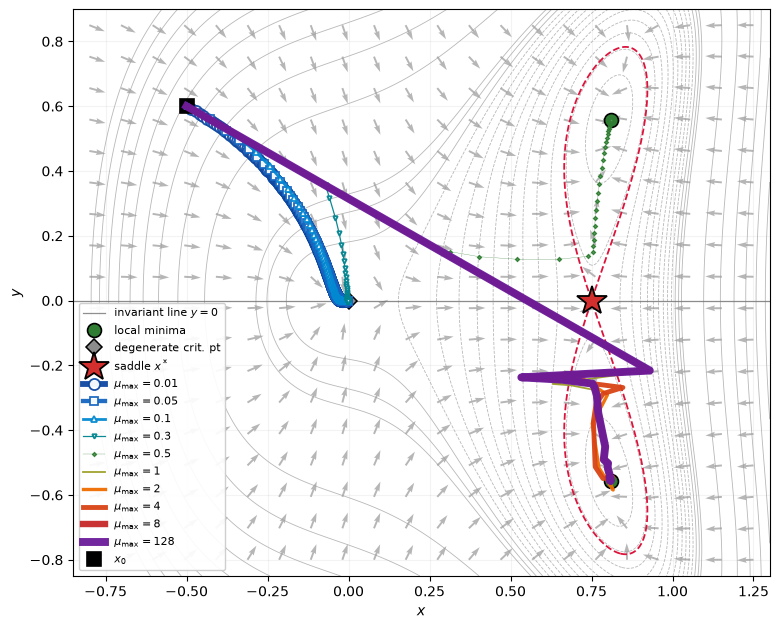


✓ wrote fig8_rgrad_mu_lbfgs_phase.pdf


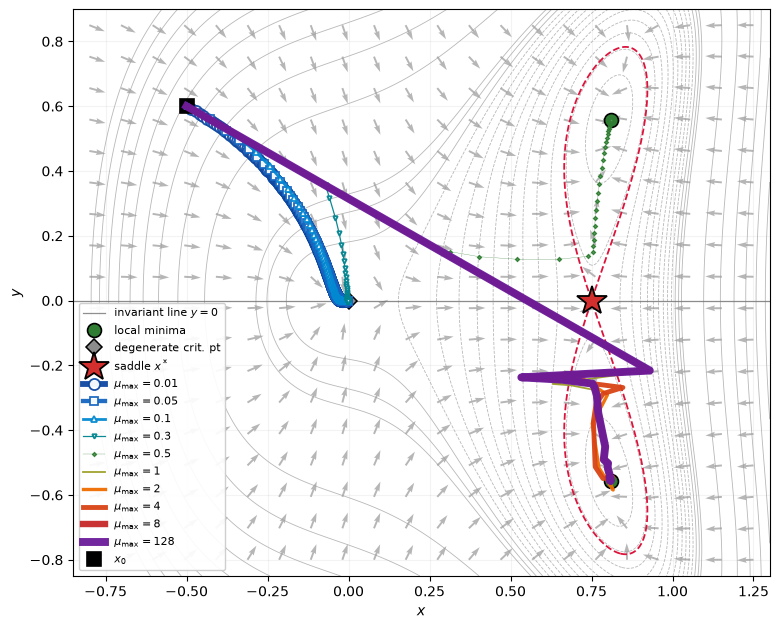

In [31]:
# ---- R-grad with L-BFGS, across the μmax sweep ----
runs_mu_lbfgs = mu_sweep(() -> LBFGS(m=5); label = "L-BFGS(m=5)")

fig_mu_lbfgs = plot_phase(runs_mu_lbfgs; x0 = X0_MFIG,
                          savepath = "fig8_rgrad_mu_lbfgs_phase.pdf")
display(fig_mu_lbfgs)
println("\n✓ wrote fig8_rgrad_mu_lbfgs_phase.pdf")

In [32]:
# ================================================================
# A nonsingular saddle with an arbitrarily long stall
# ================================================================
f_slow(p, ε)    = 0.5*p[1]^2 + ε*(p[2]^4/4 - p[2]^2/2)
grad_slow(p, ε) = [p[1], ε*p[2]*(p[2]^2 - 1)]
hess_slow(p, ε) = [1.0 0.0; 0.0 ε*(3p[2]^2 - 1)]

println("Critical points of f_ε(x,y) = ½x² + ε(¼y⁴ - ½y²)\n")
@printf("%-10s %-16s %-14s %-24s %s\n", "ε", "point", "f", "eig(∇²f)", "type")
println("-"^84)
for ε in [1e-1, 1e-2, 1e-3, 1e-4]
    for (nm, p) in [("(0,0)", [0.0,0.0]), ("(0,1)", [0.0,1.0])]
        w = eigvals(Symmetric(hess_slow(p, ε)))
        ty = w[1] < 0 ? "SADDLE (nonsingular)" : "minimiser"
        @printf("%-10.0e %-16s %-14.3e (%+.5f, %+.5f)   %s\n",
                ε, nm, f_slow(p, ε), w[1], w[2], ty)
    end
end
println("\ndet ∇²f(0,0) = -ε ≠ 0 : the saddle is NONSINGULAR for every ε > 0,")
println("and τ(0,0) = max{‖g‖, -λ⁻} = ε > 0 correctly flags it.")
println("The minimisers stay at distance 1 from the saddle as ε → 0.")

Critical points of f_ε(x,y) = ½x² + ε(¼y⁴ - ½y²)

ε          point            f              eig(∇²f)                 type
------------------------------------------------------------------------------------
1e-01      (0,0)            0.000e+00      (-0.10000, +1.00000)   SADDLE (nonsingular)
1e-01      (0,1)            -2.500e-02     (+0.20000, +1.00000)   minimiser
1e-02      (0,0)            0.000e+00      (-0.01000, +1.00000)   SADDLE (nonsingular)
1e-02      (0,1)            -2.500e-03     (+0.02000, +1.00000)   minimiser
1e-03      (0,0)            0.000e+00      (-0.00100, +1.00000)   SADDLE (nonsingular)
1e-03      (0,1)            -2.500e-04     (+0.00200, +1.00000)   minimiser
1e-04      (0,0)            0.000e+00      (-0.00010, +1.00000)   SADDLE (nonsingular)
1e-04      (0,1)            -2.500e-05     (+0.00020, +1.00000)   minimiser

det ∇²f(0,0) = -ε ≠ 0 : the saddle is NONSINGULAR for every ε > 0,
and τ(0,0) = max{‖g‖, -λ⁻} = ε > 0 correctly flags it.
The minimisers st

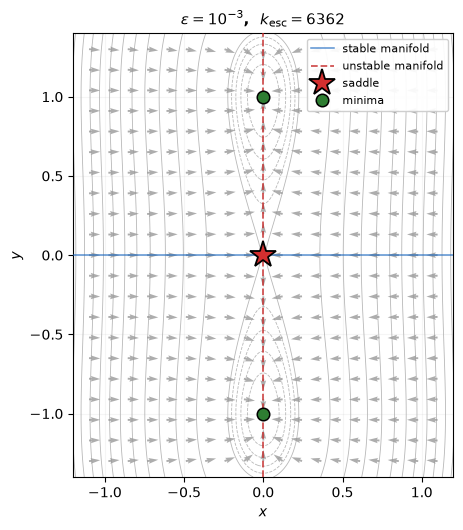

✓ wrote fig_slow_saddle_flow_eps1.pdf


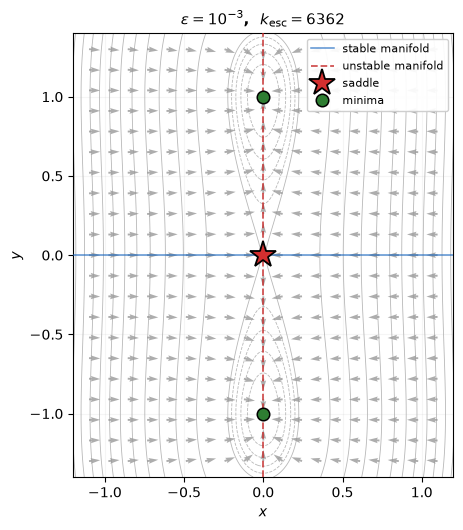

In [58]:
# Contour + gradient flow for ONE ε, with the escaping trajectory overlaid
ε_PLOT   = 0.1          # <- change this to plot a different ε
Y0_PANEL = 1e-3

fig_flow = PyPlot.figure(figsize=(5.6, 5.4))
ax = fig_flow.add_subplot(1, 1, 1)

# ---- level sets ----
xg = range(-1.2, 1.2, length=320)
yg = range(-1.4, 1.4, length=340)
Xg = [xi for yi in yg, xi in xg]
Yg = [yi for yi in yg, xi in xg]
Zg = @. 0.5*Xg^2 + ε_PLOT*(Yg^4/4 - Yg^2/2)
lv = sort(vcat(collect(range(-ε_PLOT/4, 0.0, length=6))[1:end-1],
               collect(range(1e-4, 0.7, length=12))))
ax.contour(Xg, Yg, Zg, levels=lv, colors="0.72", linewidths=0.6, zorder=1)

# ---- normalised -grad field ----
xq = range(-1.1, 1.1, length=19)
yq = range(-1.3, 1.3, length=21)
QX = Float64[]; QY = Float64[]; QU = Float64[]; QV = Float64[]
for xi in xq, yi in yq
    gg = -grad_slow([xi, yi], ε_PLOT); n = norm(gg)
    n < 1e-14 && continue
    push!(QX, xi); push!(QY, yi); push!(QU, gg[1]/n); push!(QV, gg[2]/n)
end
ax.quiver(QX, QY, QU, QV, color="0.60", width=0.005, scale=34, alpha=0.8, zorder=2)

# ---- stable / unstable manifolds of the saddle ----
ax.axhline(0.0, color="#1565c0", ls="-",  lw=1.1, alpha=0.7, zorder=3,
           label="stable manifold")
ax.axvline(0.0, color="#c62828", ls="--", lw=1.3, alpha=0.8, zorder=3,
           label="unstable manifold")

# ---- critical points ----
ax.plot([0.0], [0.0], "*", ms=20, mfc="#d32f2f", mec="k", mew=1.3, zorder=6,
        label="saddle")
ax.plot([0.0, 0.0], [1.0, -1.0], "o", ms=9, mfc="#2e7d32", mec="k", mew=1.1,
        zorder=6, label="minima")

ax.set_title(ttl, fontsize=11, fontweight="bold")
ax.set_xlabel("\$x\$"); ax.set_ylabel("\$y\$")
ax.set_xlim(-1.2, 1.2); ax.set_ylim(-1.4, 1.4)
ax.set_aspect("equal"); ax.grid(alpha=0.12)
ax.legend(loc="upper right", fontsize=8, framealpha=0.93)

PyPlot.tight_layout()
tag = "eps" * string(round(Int, -log10(ε_PLOT)))     # "eps3" for 1e-3
PyPlot.savefig("fig_slow_saddle_flow_$tag.pdf", bbox_inches="tight")
display(fig_flow)
println("✓ wrote fig_slow_saddle_flow_$tag.pdf")

In [39]:
"First iteration with |y_k| > 1/2, or `nothing` if the run never escapes."
function escape_k(h)
    i = findfirst(x -> abs(x[2]) > 0.5, h.xs)
    return i === nothing ? nothing : h.ks[i]
end

escape_k

In [44]:
"""
    run_slow(ε, y0; model, c, kmax, tol) -> (rows, status, xfinal)

Trust-region run on f_ε from (0.8, y0) with R-delta and truncated CG.
`model = :true` uses ∇²f; `model = :blind` uses the curvature-blind B = diag(1,c),
which is what BFGS, Gauss–Newton and any PSD-enforcing scheme produce.
"""
function run_slow(ε, y0; model::Symbol = :blind, c = 1.0, x1 = 0.8,
                  Δ0 = 0.5, kmax = 400_000, tol = 1e-9,
                  η = 1e-4, η1 = 0.25, η2 = 0.75, γ1 = 0.25, γ3 = 2.0, Δmax = 10.0)
    x = [x1, y0]; Δ = Δ0
    Bblind = [1.0 0.0; 0.0 c]
    ks = Int[]; xs = Vector{Float64}[]; gs = Float64[]; Δs = Float64[]
    status = "maxiter"
    for k in 0:kmax-1
        g = grad_slow(x, ε); gn = norm(g); fk = f_slow(x, ε)
        push!(ks, k); push!(xs, copy(x)); push!(gs, gn); push!(Δs, Δ)
        if gn < tol
            status = "converged"; break
        end
        B = model === :truehess ? hess_slow(x, ε) : Bblind
        s, act, _ = steihaug(g, B, Δ)
        pred = -(dot(g,s) + 0.5*dot(s, B*s))
        ared = fk - f_slow(x .+ s, ε)
        ρ    = pred > 1e-300 ? ared/pred : -Inf
        if abs(ared) <= 1e-15*max(1.0, abs(fk)) && norm(s) < 1e-13
            status = "stagnated"; break
        end
        ρ >= η && (x = x .+ s)
        Δ = ρ < η1 ? γ1*Δ : (ρ >= η2 ? min(γ3*Δ, Δmax) : Δ)
    end
    return (ks=ks, xs=xs, gs=gs, Δs=Δs), status, x
end

println("The SAME problem under two models, from (0.8, 1e-3):\n")
@printf("%-10s %-8s %-11s %8s %10s\n", "ε", "model", "status", "iters", "escape k")
println("-"^52)
for ε in [1e-2, 1e-3, 1e-4], m in (:truehess, :blind)
    h, st, xf = run_slow(ε, 1e-3; model=m)
    e = escape_k(h)
    @printf("%-10.0e %-8s %-11s %8d %10s\n",
            ε, string(m), st, length(h.ks), e === nothing ? "---" : string(e))
end
println("\nTrue Hessian: escapes at k = 2 for EVERY ε — CG detects the negative")
println("curvature on its first iteration and follows it to the boundary.")
println("Blind model: the stall grows without bound as ε → 0.")

The SAME problem under two models, from (0.8, 1e-3):

ε          model    status         iters   escape k
----------------------------------------------------
1e-02      truehess converged          6          2
1e-02      blind    converged       1494        640
1e-03      truehess converged          6          2
1e-03      blind    converged      13814       6362
1e-04      truehess converged          6          2
1e-04      blind    converged     126642      63588

True Hessian: escapes at k = 2 for EVERY ε — CG detects the negative
curvature on its first iteration and follows it to the boundary.
Blind model: the stall grows without bound as ε → 0.


1e-01      blind    stagnated        178         67


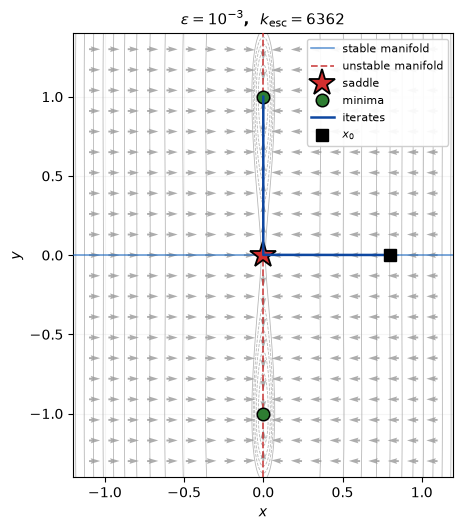

✓ wrote fig_slow_saddle_flow_eps2.pdf


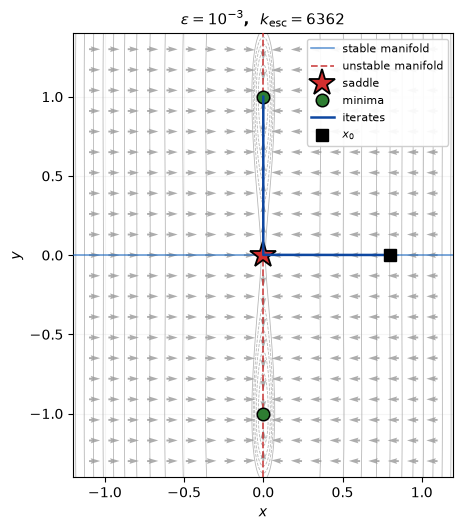

In [61]:
# Contour + gradient flow for ONE ε, with the escaping trajectory overlaid
ε_PLOT   = 0.01          # <- change this to plot a different ε
Y0_PANEL = 1e-3

fig_flow = PyPlot.figure(figsize=(5.6, 5.4))
ax = fig_flow.add_subplot(1, 1, 1)

# ---- level sets ----
xg = range(-1.2, 1.2, length=320)
yg = range(-1.4, 1.4, length=340)
Xg = [xi for yi in yg, xi in xg]
Yg = [yi for yi in yg, xi in xg]
Zg = @. 0.5*Xg^2 + ε_PLOT*(Yg^4/4 - Yg^2/2)
lv = sort(vcat(collect(range(-ε_PLOT/4, 0.0, length=6))[1:end-1],
               collect(range(1e-4, 0.7, length=12))))
ax.contour(Xg, Yg, Zg, levels=lv, colors="0.72", linewidths=0.6, zorder=1)

# ---- normalised -grad field ----
xq = range(-1.1, 1.1, length=19)
yq = range(-1.3, 1.3, length=21)
QX = Float64[]; QY = Float64[]; QU = Float64[]; QV = Float64[]
for xi in xq, yi in yq
    gg = -grad_slow([xi, yi], ε_PLOT); n = norm(gg)
    n < 1e-14 && continue
    push!(QX, xi); push!(QY, yi); push!(QU, gg[1]/n); push!(QV, gg[2]/n)
end
ax.quiver(QX, QY, QU, QV, color="0.60", width=0.005, scale=34, alpha=0.8, zorder=2)

# ---- stable / unstable manifolds of the saddle ----
ax.axhline(0.0, color="#1565c0", ls="-",  lw=1.1, alpha=0.7, zorder=3,
           label="stable manifold")
ax.axvline(0.0, color="#c62828", ls="--", lw=1.3, alpha=0.8, zorder=3,
           label="unstable manifold")

# ---- critical points ----
ax.plot([0.0], [0.0], "*", ms=20, mfc="#d32f2f", mec="k", mew=1.3, zorder=6,
        label="saddle")
ax.plot([0.0, 0.0], [1.0, -1.0], "o", ms=9, mfc="#2e7d32", mec="k", mew=1.1,
        zorder=6, label="minima")
m = :blind
h, st, xf = run_slow(ε, 1e-3; model=m)
e = escape_k(h)
@printf("%-10.0e %-8s %-11s %8d %10s\n",
        ε, string(m), st, length(h.ks), e === nothing ? "---" : string(e))

P = hcat(h.xs...)
stride = max(1, size(P, 2) ÷ 1500)          # thin the near-saddle crawl
idx = unique(vcat(1:stride:size(P,2), size(P,2)))
ax.plot(P[1,idx], P[2,idx], "-", color="#0d47a1", lw=1.8, zorder=7, label="iterates")
ax.plot([P[1,1]], [P[2,1]], "s", ms=8, mfc="k", mec="k", zorder=8, label="\$x_0\$")


ax.set_title(ttl, fontsize=11, fontweight="bold")
ax.set_xlabel("\$x\$"); ax.set_ylabel("\$y\$")
ax.set_xlim(-1.2, 1.2); ax.set_ylim(-1.4, 1.4)
ax.set_aspect("equal"); ax.grid(alpha=0.12)
ax.legend(loc="upper right", fontsize=8, framealpha=0.93)

PyPlot.tight_layout()
tag = "eps" * string(round(Int, -log10(ε_PLOT)))     # "eps3" for 1e-3
PyPlot.savefig("fig_slow_saddle_flow_$tag.pdf", bbox_inches="tight")
display(fig_flow)
println("✓ wrote fig_slow_saddle_flow_$tag.pdf")

In [62]:
h.xs

178-element Vector{Vector{Float64}}:
 [0.8, 0.001]
 [0.3000000039062422, 0.0010624999370117203]
 [0.0, 0.0011687498107666246]
 [0.0, 0.001285624632194854]
 [0.0, 0.001414186882922354]
 [0.0, 0.0015556052883878842]
 [0.0, 0.0017111654407845334]
 [0.0, 0.0018822814838188302]
 [0.0, 0.0020705089653114735]
 [0.0, 0.0022775589742139004]
 [0.0, 0.002505313690202845]
 [0.0, 0.0027558434867387687]
 [0.0, 0.0030314257424395442]
 ⋮
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]
 [0.0, 0.9999999913453612]

In [45]:
EPS_SWEEP = [1e-1, 1e-2, 1e-3, 1e-4]
Y0_SWEEP  = [1e-3, 1e-6]
GTHRESH   = 1e-5

slow_rows = Vector{String}[]
println("Escape scaling: k_esc·ε should equal ln(1/y₀)\n")
@printf("%-8s %-8s %-11s %9s %9s %11s %10s %-10s\n",
        "ε", "y₀", "status", "iters", "k_esc", "k_esc·ε", "#|g|<1e-5", "limit")
println("-"^88)
for ε in EPS_SWEEP, y0 in Y0_SWEEP
    h, st, xf = run_slow(ε, y0; model=:blind)
    e    = escape_k(h)
    near = count(<(GTHRESH), h.gs)
    lim  = norm(xf) < 1e-3 ? "SADDLE" : (abs(abs(xf[2]) - 1) < 1e-3 ? "minimiser" : "other")
    @printf("%-8.0e %-8.0e %-11s %9d %9s %11s %10d %-10s\n",
            ε, y0, st, length(h.ks), e === nothing ? "---" : string(e),
            e === nothing ? "---" : @sprintf("%.2f", e*ε), near, lim)
    push!(slow_rows, [sci(ε; d=0), sci(y0; d=0), st, string(length(h.ks)),
                      e === nothing ? "---" : string(e),
                      string(near),
                      lim == "SADDLE" ? "\\textbf{saddle}" : lim])
end
@printf("\nln(1/y₀) = %.3f for y₀ = 1e-3,  %.3f for y₀ = 1e-6\n", log(1e3), log(1e6))
println("The last row TERMINATES AT THE SADDLE: ‖g₀‖ ≈ ε·y₀ = 1e-10 < tol.")

open(io -> latex_table(io,
        [raw"$\varepsilon$", raw"$y_0$", "Status", "Iters", raw"$k_{\mathrm{esc}}$",
         raw"$\#\{\|g_k\|<10^{-5}\}$", "Limit"],
        slow_rows;
        align   = "rrlrrrl",
        caption = raw"Trust-region runs on $f_\varepsilon$ from $x_0=(0.8,y_0)$ under the " *
                  raw"curvature-blind model $B_k=\operatorname{diag}(1,1)$, with truncated CG, " *
                  raw"R-delta, and first-order tolerance $10^{-9}$. The product " *
                  raw"$\varepsilon\,k_{\mathrm{esc}}$ is constant at $\approx\ln(1/y_0)$. The " *
                  raw"final row terminates \emph{at the saddle}, where " *
                  raw"$\|g_0\|\approx\varepsilon y_0=10^{-10}$ is already below tolerance. " *
                  raw"Under the true Hessian every run instead escapes at $k=2$.",
        label   = "tab: slow saddle"),
     "tab_slow_saddle.txt", "w")
println("\n✓ wrote tab_slow_saddle.txt")

Escape scaling: k_esc·ε should equal ln(1/y₀)

ε        y₀       status          iters     k_esc     k_esc·ε  #|g|<1e-5 limit     
----------------------------------------------------------------------------------------
1e-01    1e-03    stagnated         178        67        6.70         63 minimiser 
1e-01    1e-06    stagnated         251       140       14.00        111 minimiser 
1e-02    1e-03    converged        1494       640        6.40        457 minimiser 
1e-02    1e-06    converged        2188      1334       13.34       1150 minimiser 
1e-03    1e-03    converged       13814      6362        6.36       6912 minimiser 
1e-03    1e-06    converged       20725     13273       13.27      13823 minimiser 
1e-04    1e-03    converged      126642     63588        6.36      93094 minimiser 
1e-04    1e-06    converged           3       ---         ---          1 SADDLE    

ln(1/y₀) = 6.908 for y₀ = 1e-3,  13.816 for y₀ = 1e-6
The last row TERMINATES AT THE SADDLE: ‖g₀‖ ≈ ε·y₀ = 

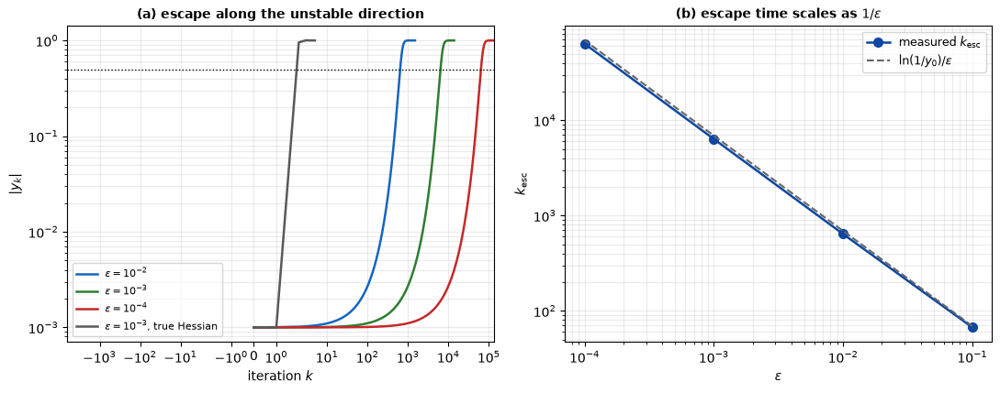

✓ wrote fig12_slow_saddle.pdf


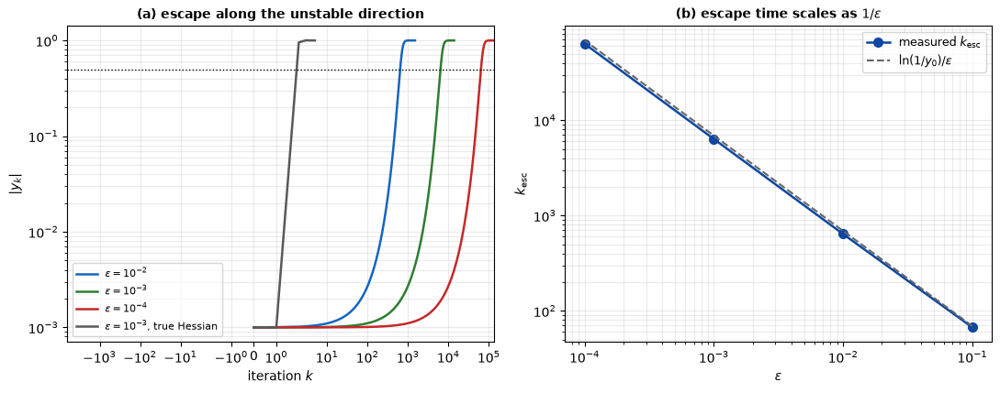

In [51]:
h_a, _, _ = run_slow(1e-2, 1e-3; model=:blind)
h_b, _, _ = run_slow(1e-3, 1e-3; model=:blind)
h_c, _, _ = run_slow(1e-4, 1e-3; model=:blind)
h_t, _, _ = run_slow(1e-3, 1e-3; model=:truehess)

fig_s = PyPlot.figure(figsize=(11.0, 4.4))

axL = fig_s.add_subplot(1, 2, 1)
for (h, lab, col) in [(h_a, "\$\\varepsilon = 10^{-2}\$", "#1565c0"),
                      (h_b, "\$\\varepsilon = 10^{-3}\$", "#2e7d32"),
                      (h_c, "\$\\varepsilon = 10^{-4}\$", "#c62828"),
                      (h_t, "\$\\varepsilon = 10^{-3}\$, true Hessian", "0.35")]
    axL.semilogy(h.ks, max.(abs.([x[2] for x in h.xs]), 1e-18), "-", color=col, lw=1.8, label=lab)
end
axL.axhline(0.5, color="k", ls=":", lw=1.0)
axL.set_xlabel("iteration \$k\$"); axL.set_ylabel("\$|y_k|\$")
axL.set_xscale("symlog"); axL.legend(fontsize=8); axL.grid(alpha=0.25, which="both")
axL.set_title("(a) escape along the unstable direction", fontsize=10, fontweight="bold")

axR = fig_s.add_subplot(1, 2, 2)
εs = EPS_SWEEP
ke = [escape_k(run_slow(ε, 1e-3; model=:blind)[1]) for ε in εs]
axR.loglog(εs, ke, "o-", color="#0d47a1", ms=7, lw=1.8, label="measured \$k_{\\mathrm{esc}}\$")
axR.loglog(εs, log(1e3) ./ εs, "--", color="0.4", lw=1.5,
           label="\$\\ln(1/y_0)/\\varepsilon\$")
axR.set_xlabel("\$\\varepsilon\$"); axR.set_ylabel("\$k_{\\mathrm{esc}}\$")
axR.legend(fontsize=9); axR.grid(alpha=0.25, which="both")
axR.set_title("(b) escape time scales as \$1/\\varepsilon\$", fontsize=10, fontweight="bold")

PyPlot.tight_layout()
PyPlot.savefig("fig12_slow_saddle.pdf", bbox_inches="tight")
display(fig_s)
println("✓ wrote fig12_slow_saddle.pdf")

Note: R-delta, R-step and R-DFO terminate within ~20 iterations here;
      R-grad continues to k = 400. The x-axis is clipped to 60 to keep
      the short runs legible — widen XLIM_FIG2 to see R-grad's full decay.


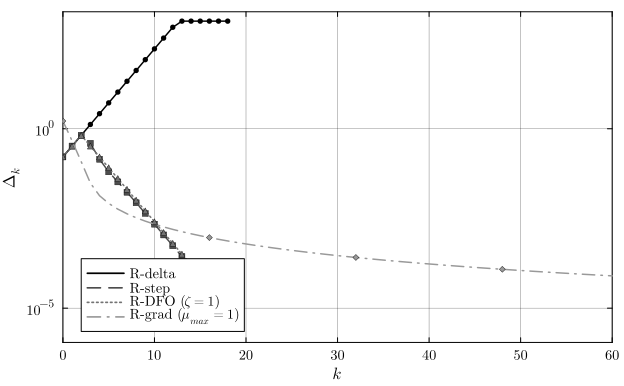

✓ wrote fig2_radius_per_rule.pdf


In [33]:
# ---------------- Figure 2: radius versus iteration, per mechanism ----------------
KMAX_FIG2 = 400
XLIM_FIG2 = 60          # the blind rules finish in ~20 iterations; R-grad runs on

p2 = Plots.plot(xlabel = L"k", ylabel = L"\Delta_k", yscale = :log10, legend = :bottomleft,
          xlims = (0, XLIM_FIG2))

rules_fig = [(RDelta(),        "R-delta",        :solid,   :circle,  :black),
             (RStep(),         "R-step",         :dash,    :square,  :gray30),
             (RDFO(ζ=1.0),     L"R-DFO ($\zeta=1$)",   :dot,     :utriangle, :gray45),
             (RGrad(μmax=1.0), L"R-grad ($\mu_{max}=1$)", :dashdot, :diamond, :gray60)]

for (R, lab, ls, mk, col) in rules_fig
    rws, st, xf = run_tr(X0_FIG; radius=R, model=TrueHessian(), solver=:cg,
                         kmax=KMAX_FIG2, tol=1e-12)
    ks = [r.k for r in rws]; Δs = [r.Δ for r in rws]
    # draw the full curve, but only mark a subsample so the markers stay legible
    step = max(1, length(ks) ÷ 25)
    idx  = 1:step:length(ks)
    Plots.plot!(p2, ks, Δs, label = lab, linestyle = ls, color = col, linewidth = 1.5)
    Plots.scatter!(p2, ks[idx], Δs[idx], label = "", marker = mk, color = col,
             markersize = 3.0, markerstrokewidth = 0.5)
end

println("Note: R-delta, R-step and R-DFO terminate within ~20 iterations here;")
println("      R-grad continues to k = $KMAX_FIG2. The x-axis is clipped to $XLIM_FIG2 to keep")
println("      the short runs legible \u2014 widen XLIM_FIG2 to see R-grad's full decay.")

Plots.savefig(p2, "fig2_radius_per_rule.pdf")
display(p2)
println("✓ wrote fig2_radius_per_rule.pdf")

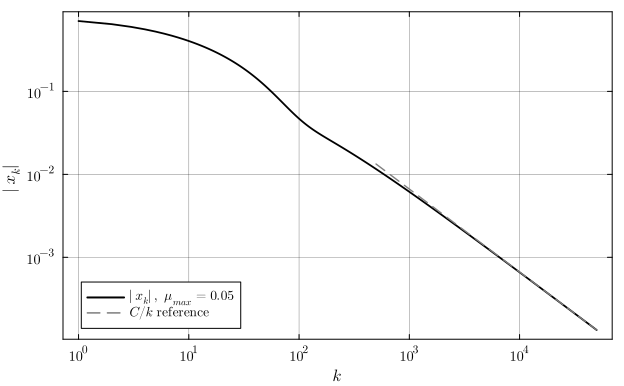

✓ wrote fig3_sublinear_crawl.pdf


In [34]:
# ---------------- Figure 3: the sublinear crawl ----------------
ks_c  = [r.k for r in rows_crawl if r.k >= 1]
nrm_c = [norm(r.x) for r in rows_crawl if r.k >= 1]

p3 = Plots.plot(xlabel = L"k", ylabel = L"\|x_k\|", xscale = :log10, yscale = :log10,
          legend = :bottomleft)
Plots.plot!(p3, ks_c, nrm_c, label = L"\|x_k\|,\ \mu_{max} = 0.05",
      color = :black, linewidth = 1.8, marker = :none)
kk = ks_c[max(1, length(ks_c) ÷ 100):end]
Plots.plot!(p3, kk, 6.65 ./ kk, label = L"C/k\ \mathrm{reference}",
      color = :gray50, linestyle = :dash, linewidth = 1.4)

Plots.savefig(p3, "fig3_sublinear_crawl.pdf")
display(p3)
println("✓ wrote fig3_sublinear_crawl.pdf")

## 13. What the matrix shows

**The limit is set by the model, not by the radius rule.** Across the whole configuration matrix
the radius mechanism never changes which critical point is reached. It changes how fast, and
sometimes whether the run terminates cleanly, but the three distinct limits — degenerate origin,
local minimiser, saddle — track the three model choices. This is structural rather than accidental:
the radius rule chooses the *length* of $s_k$, while its *direction* is dictated by $B_k$.

**Small $\mu_{\max}$ silently converts the method into gradient descent.** With truncated CG and a
small cap, CG never gets past its first iteration, so the step is the Cauchy point and $B_k$ enters
only through $\rho_k$. The method stops being a trust-region method in any meaningful sense and
inherits gradient-descent asymptotics — here a sublinear $\Theta(1/k)$ crawl into a degenerate
point.

With quasi-Newton models this is not merely a slowdown. §10 exhibits a **threshold** near
$\mu_{\max} \approx 0.5$: below it the accumulated curvature is never used for direction and the
run reaches the degenerate origin, where $\lambda_{\min}(\nabla^2 f) = 0$ and the limit is not a
minimiser; above it the curvature enters the step and the run reaches a genuine local minimiser in
a few dozen iterations. Any bound $\mu_k \le \overline{\mu}$ needed for the asymptotic theory must
therefore be read as an *upper* bound whose smallness changes not just the rate but the
**destination**.

**First-order theory is not violated anywhere.** In the SPD-model runs every hypothesis holds and
every conclusion is correct: $f$ decreases monotonically, every $\rho_k$ is successful,
$\|g_k\| \to 0$, the iterates converge, the radius behaves impeccably. And the limit is a saddle.
The second-order criticality measure $\tau(x) = \max\{\|g\|,-\lambda^-\}$ catches this **only**
when $\lambda^-$ is the leftmost eigenvalue of the *true* Hessian; evaluated on the model,
$\lambda_{\min}(B_k) > 0$ always and $\tau$ reports convergence.

**And $\tau$ is not sufficient either.** The origin, which is where most configurations actually
land, has $\tau = 0$ exactly: $\nabla^2 f(0,0) = \operatorname{diag}(0,\tfrac12)$ is singular and
positive semidefinite. Yet $f(x,0) = x^3(x-1) < 0$ for small $x > 0$, so it is not a local
minimiser. A second-order measure certifies a point that is not a minimum, because the deciding
information is third order.

In [35]:
println("Files written:\n")
for fn in ["tab_config_matrix.txt", "tab_rgrad_mumax.txt", "tab_crawl.txt",
           "tab_rdfo_zeta.txt", "tab_mumax_threshold.txt",
           "tab_spd_saddle.txt", "tab_spd_all_rules.txt",
           "fig1_phase_portrait.pdf", "fig2_radius_per_rule.pdf",
           "fig3_sublinear_crawl.pdf"]
    @printf("  %-28s %s\n", fn, isfile(fn) ? "✓" : "(not yet generated)")
end
println("\nTables are complete booktabs environments: paste directly, or rename to .tex and \\input.")
println("Preamble needs \\usepackage{booktabs}.")

Files written:

  tab_config_matrix.txt        ✓
  tab_rgrad_mumax.txt          ✓
  tab_crawl.txt                ✓
  tab_rdfo_zeta.txt            ✓
  tab_mumax_threshold.txt      ✓
  tab_spd_saddle.txt           ✓
  tab_spd_all_rules.txt        ✓
  fig1_phase_portrait.pdf      ✓
  fig2_radius_per_rule.pdf     ✓
  fig3_sublinear_crawl.pdf     ✓

Tables are complete booktabs environments: paste directly, or rename to .tex and \input.
Preamble needs \usepackage{booktabs}.


# Discussion on the trust-region radius mechanisms R-DFO and R-grad

What about inactivity ? What is the influence of $\zeta$ and $\mu_{\max}$ on the convergence rate ?

In [71]:
# ================================================================
# κ̄ = 4/λ_min* and the trust-region radius: f(x,y) = sin(x)/x + y²
# ================================================================
sinc(x)   = abs(x) < 1e-10 ? 1.0 : sin(x)/x
f_sc(p)   = sinc(p[1]) + p[2]^2
function grad_sc(p)
    x, y = p
    gx = abs(x) < 1e-8 ? 0.0 : (x*cos(x) - sin(x))/x^2
    return [gx, 2y]
end
function hess_sc(p)
    x, y = p
    gxx = abs(x) < 1e-6 ? -1/3 :
          -sin(x)/x - 2cos(x)/x^2 + 2sin(x)/x^3
    return [gxx 0.0; 0.0 2.0]
end

# Target: the positive-definite critical point (minimiser in x) at tan x = x, x ≈ 10.904.
const XSTAR_SC = [10.9041216594289, 0.0]
const LMIN_SC  = hess_sc(XSTAR_SC)[1,1]           # = 0.09133
const KAPPA_SC = 4 / LMIN_SC                        # κ̄ = 4/λ_min* ≈ 43.8

@printf("Target x* = (%.5f, 0),  f(x*) = %.6f\n", XSTAR_SC[1], f_sc(XSTAR_SC))
@printf("eig ∇²f(x*) = (%.5f, %.1f)  =>  λ_min* = %.5f\n",
        LMIN_SC, hess_sc(XSTAR_SC)[2,2], LMIN_SC)
@printf("κ̄ = 4/λ_min* = %.2f\n", KAPPA_SC)

Target x* = (10.90412, 0),  f(x*) = -0.091325
eig ∇²f(x*) = (0.09133, 2.0)  =>  λ_min* = 0.09133
κ̄ = 4/λ_min* = 43.80


In [72]:
# --- self-contained driver recording everything the plots need ---
Base.@kwdef struct RowSC
    k::Int; x::Vector{Float64}; f::Float64; gn::Float64
    Δ::Float64; ρ::Float64; ns::Float64; active::Bool
end

"Steihaug–Toint truncated CG (local copy so this section stands alone)."
function cg_sc(g, B, Δ; tol=1e-12, maxit=50)
    z = zeros(2); r = copy(g); d = -r
    norm(r) < tol && return z, false
    for _ in 1:maxit
        dBd = dot(d, B*d)
        if dBd <= 0
            aa=dot(d,d); bb=2dot(z,d); cc=dot(z,z)-Δ^2
            return z + (-bb+sqrt(bb^2-4aa*cc))/(2aa)*d, true
        end
        α = dot(r,r)/dBd; zn = z + α*d
        if norm(zn) >= Δ
            aa=dot(d,d); bb=2dot(z,d); cc=dot(z,z)-Δ^2
            return z + (-bb+sqrt(bb^2-4aa*cc))/(2aa)*d, true
        end
        rn = r + α*(B*d)
        norm(rn) < tol*norm(g) && return zn, false
        d = -rn + (dot(rn,rn)/dot(r,r))*d; z = zn; r = rn
    end
    return z, false
end

"""
    run_sc(x0; rule, ζ, μmax, Δ0, kmax, tol) -> (rows, status, xfinal)

Trust-region on f_sc with the true Hessian and truncated CG.
`rule ∈ (:rdelta, :rdfo, :rgrad)`.
"""
function run_sc(x0; rule::Symbol, ζ=nothing, μmax=nothing, Δ0=0.03,
                kmax=4000, tol=1e-9, η=1e-4, η1=0.25, η2=0.75,
                γ1=0.25, γ2=0.5, γ3=2.0, Δmax=1e3)
    x = collect(float.(x0))
    μ = μmax
    Δ = rule === :rgrad ? μ*norm(grad_sc(x)) : Δ0
    rows = RowSC[]; status = "maxiter"
    for k in 0:kmax-1
        g = grad_sc(x); gn = norm(g); fk = f_sc(x)
        rule === :rgrad && (Δ = μ*gn)
        if gn < tol
            status = "converged"
            push!(rows, RowSC(k=k, x=copy(x), f=fk, gn=gn, Δ=Δ, ρ=NaN, ns=NaN, active=false))
            break
        end
        B = hess_sc(x)
        s, act = cg_sc(g, B, Δ)
        pred = -(dot(g,s) + 0.5*dot(s, B*s))
        ared = fk - f_sc(x .+ s)
        ρ = pred > 1e-300 ? ared/pred : -Inf
        push!(rows, RowSC(k=k, x=copy(x), f=fk, gn=gn, Δ=Δ, ρ=ρ, ns=norm(s), active=act))
        ρ >= η && (x = x .+ s)
        if rule === :rdelta
            Δ = ρ < η1 ? γ1*Δ : (ρ >= η2 ? min(γ3*Δ, Δmax) : Δ)
        elseif rule === :rdfo
            Δ = ρ < η1 ? γ1*Δ : (Δ > ζ*gn ? γ2*Δ : min(γ3*Δ, Δmax))
        else  # :rgrad
            μ = ρ < η1 ? γ1*μ : (ρ < η2 ? γ2*μ : min(γ3*μ, μmax))
        end
    end
    return rows, status, x
end

# --- the five configurations, straddling κ̄ ≈ 43.8 ---
X0_SC = [9.6, 0.4]
configs = [("R-DFO, ζ = 60 > κ̄",      (rule=:rdfo,  ζ=60.0),  "#1565c0", "-"),
           ("R-DFO, ζ = 0.5 ≪ κ̄",     (rule=:rdfo,  ζ=0.5),   "#c62828", "--"),
           ("R-grad, μmax = 50 > κ̄",   (rule=:rgrad, μmax=50.0),"#2e7d32", "-"),
           ("R-grad, μmax = 1 ≪ κ̄",    (rule=:rgrad, μmax=1.0), "#ef6c00", "--"),
           ("R-delta",                  (rule=:rdelta,),        "0.35",    "-.")]

results = Tuple{String,Vector{RowSC},String,String,String}[]
println("\nFive configurations from x0 = ", X0_SC, ",  κ̄ = ", round(KAPPA_SC, digits=2), "\n")
@printf("%-24s %-11s %7s %10s %12s\n", "config", "status", "iters", "#active", "dist to x*")
println("-"^70)
for (lab, kw, col, ls) in configs
    rows, st, xf = run_sc(X0_SC; kw...)
    nact = count(r -> r.active, rows)
    @printf("%-24s %-11s %7d %10d %12.2e\n",
            lab, st, rows[end].k, nact, norm(xf .- XSTAR_SC))
    push!(results, (lab, rows, col, ls, st))
end
println("\nOnly the two ≪ κ̄ runs keep the trust region active indefinitely:")
println("for R-DFO the contraction branch needs Δ > ζ‖g‖, and for R-grad μ is capped")
println("below κ̄, so Δ = μ‖g‖ can never reach ‖s‖ — both crawl with the constraint binding.")


Five configurations from x0 = [9.6, 0.4],  κ̄ = 43.8

config                   status        iters    #active   dist to x*
----------------------------------------------------------------------
R-DFO, ζ = 60 > κ̄        converged         9          5     1.78e-15
R-DFO, ζ = 0.5 ≪ κ̄       maxiter        3999       4000     5.98e-08
R-grad, μmax = 50 > κ̄    converged         6          1     1.78e-15
R-grad, μmax = 1 ≪ κ̄     maxiter        3999       4000     3.98e-08
R-delta                  converged         9          5     1.78e-15

Only the two ≪ κ̄ runs keep the trust region active indefinitely:
for R-DFO the contraction branch needs Δ > ζ‖g‖, and for R-grad μ is capped
below κ̄, so Δ = μ‖g‖ can never reach ‖s‖ — both crawl with the constraint binding.


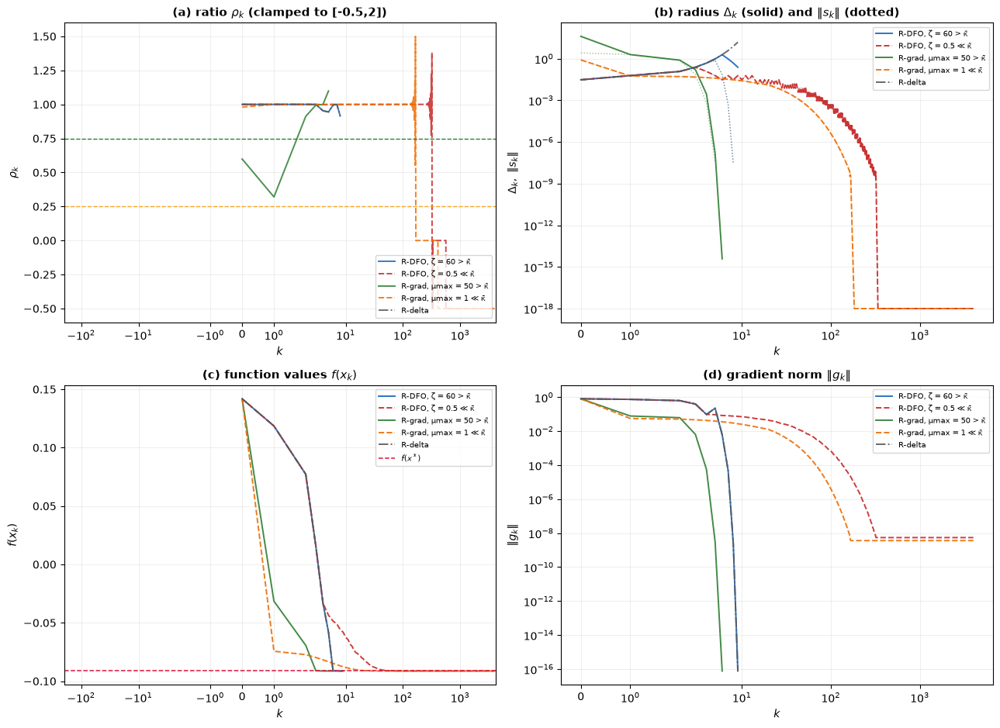

✓ wrote fig_kappa_diagnostics.pdf


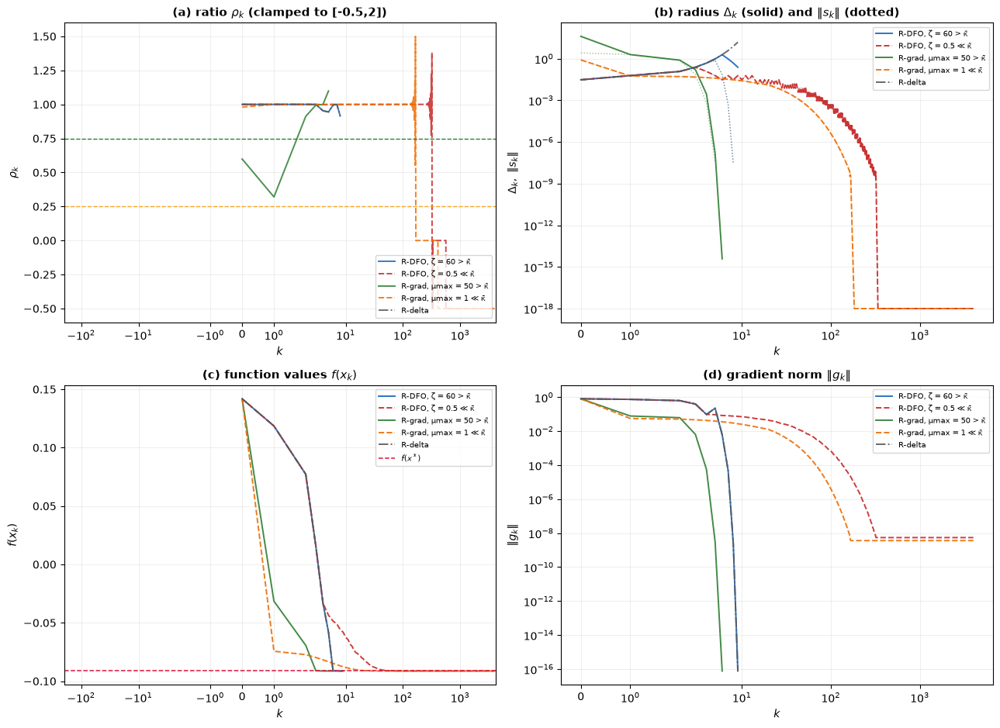

In [73]:
# --- four diagnostic panels: ρ, (Δ, ‖s‖), f, ‖g‖ ---
fig_sc = PyPlot.figure(figsize=(13.0, 9.5))
axρ = fig_sc.add_subplot(2, 2, 1)
axΔ = fig_sc.add_subplot(2, 2, 2)
axf = fig_sc.add_subplot(2, 2, 3)
axg = fig_sc.add_subplot(2, 2, 4)

for (lab, rows, col, ls, st) in results
    K  = [r.k for r in rows]
    # (a) ρ_k — scatter, since the crawling runs have thousands of points
    KR = [r.k for r in rows if !isnan(r.ρ)]
    R  = [clamp(r.ρ, -0.5, 2.0) for r in rows if !isnan(r.ρ)]
    axρ.plot(KR, R, ls, color=col, lw=1.4, alpha=0.85, label=lab)
    # (b) Δ_k solid, ‖s_k‖ faint — log scale
    axΔ.semilogy(K, max.([r.Δ for r in rows], 1e-18), ls, color=col, lw=1.4, alpha=0.9, label=lab)
    Ks = [r.k for r in rows if !isnan(r.ns)]
    sv = [max(r.ns, 1e-18) for r in rows if !isnan(r.ns)]
    axΔ.semilogy(Ks, sv, ":", color=col, lw=1.0, alpha=0.5)
    # (c) f_k
    axf.plot(K, [r.f for r in rows], ls, color=col, lw=1.4, alpha=0.9, label=lab)
    # (d) ‖g_k‖ — log scale
    axg.semilogy(K, max.([r.gn for r in rows], 1e-18), ls, color=col, lw=1.4, alpha=0.9, label=lab)
end

axρ.axhline(0.75, color="#2e7d32", ls="--", lw=1.0); axρ.axhline(0.25, color="#f9a825", ls="--", lw=1.0)
axρ.set_title("(a) ratio \$\\rho_k\$ (clamped to [-0.5,2])", fontsize=11, fontweight="bold")
axρ.set_xlabel("\$k\$"); axρ.set_ylabel("\$\\rho_k\$"); axρ.set_xscale("symlog")
axρ.legend(fontsize=7.5, loc="lower right"); axρ.grid(alpha=0.2)

axΔ.set_title("(b) radius \$\\Delta_k\$ (solid) and \$\\|s_k\\|\$ (dotted)", fontsize=11, fontweight="bold")
axΔ.set_xlabel("\$k\$"); axΔ.set_ylabel("\$\\Delta_k,\\ \\|s_k\\|\$"); axΔ.set_xscale("symlog")
axΔ.legend(fontsize=7.5); axΔ.grid(alpha=0.2, which="both")

axf.axhline(f_sc(XSTAR_SC), color="crimson", ls="--", lw=1.1, label="\$f(x^*)\$")
axf.set_title("(c) function values \$f(x_k)\$", fontsize=11, fontweight="bold")
axf.set_xlabel("\$k\$"); axf.set_ylabel("\$f(x_k)\$"); axf.set_xscale("symlog")
axf.legend(fontsize=7.5); axf.grid(alpha=0.2)

axg.set_title("(d) gradient norm \$\\|g_k\\|\$", fontsize=11, fontweight="bold")
axg.set_xlabel("\$k\$"); axg.set_ylabel("\$\\|g_k\\|\$"); axg.set_xscale("symlog")
axg.legend(fontsize=7.5); axg.grid(alpha=0.2, which="both")

PyPlot.tight_layout()
PyPlot.savefig("fig_kappa_diagnostics.pdf", bbox_inches="tight")
display(fig_sc)
println("✓ wrote fig_kappa_diagnostics.pdf")

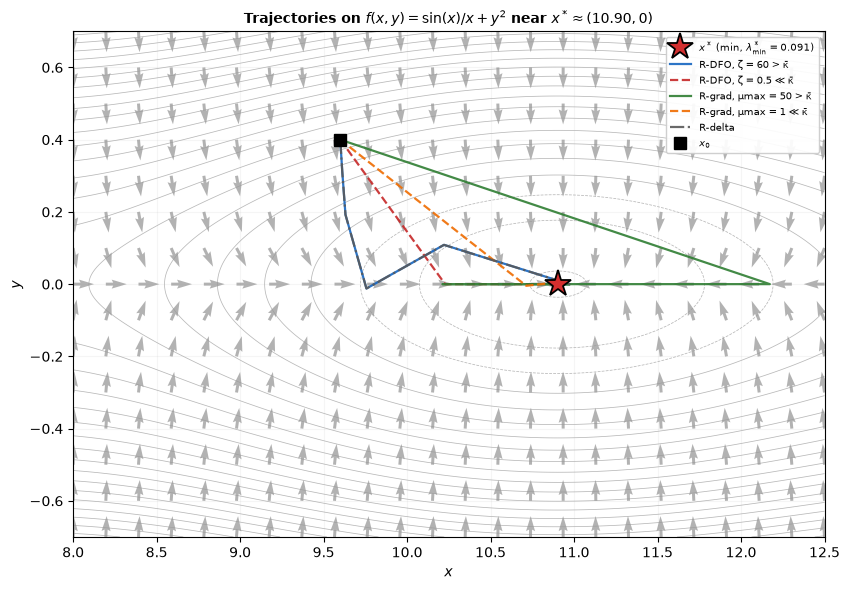

✓ wrote fig_kappa_trajectories.pdf


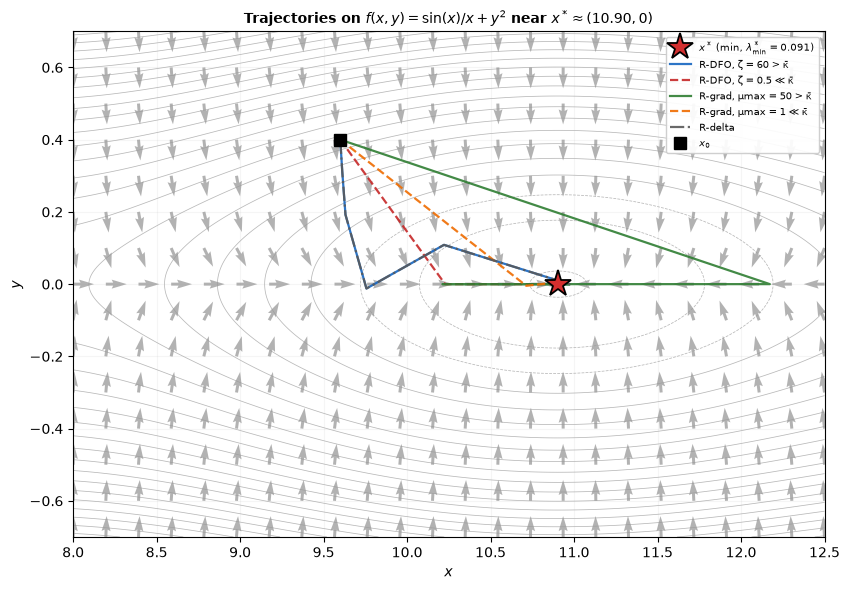

In [75]:
# --- trajectories over contour + gradient flow ---
fig_tr = PyPlot.figure(figsize=(8.6, 6.0))
ax = fig_tr.add_subplot(1, 1, 1)

xg = range(8.0, 12.5, length=360)
yg = range(-0.7, 0.7, length=280)
Xg = [xi for yi in yg, xi in xg]
Yg = [yi for yi in yg, xi in xg]
Zg = [f_sc([Xg[i], Yg[i]]) for i in eachindex(Xg)]
Zg = reshape(Zg, size(Xg))
ax.contour(Xg, Yg, Zg, levels=25, colors="0.72", linewidths=0.55, zorder=1)

xq = range(8.0, 12.5, length=24); yq = range(-0.7, 0.7, length=15)
QX=Float64[]; QY=Float64[]; QU=Float64[]; QV=Float64[]
for xi in xq, yi in yq
    gg = -grad_sc([xi, yi]); n = norm(gg)
    n < 1e-14 && continue
    push!(QX, xi); push!(QY, yi); push!(QU, gg[1]/n); push!(QV, gg[2]/n)
end
ax.quiver(QX, QY, QU, QV, color="0.60", width=0.004, scale=36, alpha=0.75, zorder=2)

# neighbouring saddles at x ≈ 7.73 and 14.07 lie off-frame; mark x* and start
ax.plot([XSTAR_SC[1]], [XSTAR_SC[2]], "*", ms=20, mfc="#d32f2f", mec="k", mew=1.3,
        zorder=7, label="\$x^*\$ (min, \$\\lambda_{\\min}^* = " *
                        @sprintf("%.3f", LMIN_SC) * "\$)")

for (lab, rows, col, ls, st) in results
    P = hcat([r.x for r in rows]...)
    stride = max(1, size(P,2) ÷ 300)
    idx = unique(vcat(1:stride:size(P,2), size(P,2)))
    ax.plot(P[1,idx], P[2,idx], ls, color=col, lw=1.6, alpha=0.9, zorder=6, label=lab)
end
ax.plot([X0_SC[1]], [X0_SC[2]], "s", ms=9, mfc="k", mec="k", zorder=8, label="\$x_0\$")

ax.set_title("Trajectories on \$f(x,y)=\\sin(x)/x + y^2\$ near \$x^*\\approx(10.90,0)\$",
             fontsize=10, fontweight="bold")
ax.set_xlabel("\$x\$"); ax.set_ylabel("\$y\$")
ax.set_xlim(8.0, 12.5); ax.set_ylim(-0.7, 0.7)
ax.legend(fontsize=7.5, loc="upper right", framealpha=0.93); ax.grid(alpha=0.12)

PyPlot.tight_layout()
PyPlot.savefig("fig_kappa_trajectories.pdf", bbox_inches="tight")
display(fig_tr)
println("✓ wrote fig_kappa_trajectories.pdf")

---
# 14. Second-order radius mechanisms and the limit point

Everything above measures criticality by $\|g_k\|$, which vanishes at **every** critical
point — the two minima, the saddle at $(0.75,0)$, and the degenerate origin alike. The
whole notebook is about which of those a configuration lands on, so the natural question is
whether a *second-order* measure changes the answer.

The second-order criticality measure is

$$\tau_k \;=\; \max\bigl\{\,\|g_k\|,\; -\lambda_{\min}(B_k)\,\bigr\},$$

and replacing one by the other is the whole of the upgrade: the update logic does not
change. In the package `SecondOrder` is a wrapper that forwards `update_radius!` to the
rule it wraps and overrides only `criticality`, so `RGradTau` *is* `RGrad` with a different
anchor — which is what makes the comparison clean.

**This function is unusually good at showing what $\tau$ does and does not repair**, because
its two non-minimising critical points fail in different ways.

In [ ]:
import TrustRegionRadius as TRR

# τ at each critical point of THIS function, computed from the exact Hessian.
println("τ = max{‖g‖, −λ_min(∇²f)} at the critical points\n")
@printf("%-8s %-24s %10s %10s %10s   %s\n",
        "name", "x", "‖g‖", "λ_min", "τ", "what τ does")
println("-"^92)
for (nm, p) in CRITPTS
    gn = norm(grad(p))
    λ  = eigvals(Symmetric(hess(p)))[1]
    τ  = max(gn, -λ)
    verdict = τ > 1e-12 ? "keeps Δ alive" : "collapses, exactly as ‖g‖ does"
    @printf("%-8s (%+.4f, %+.4f) %10.2e %10.4f %10.4f   %s\n",
            nm, p[1], p[2], gn, λ, τ, verdict)
end

### The result worth stating plainly

$\tau$ repairs the **saddle** and is powerless at the **origin**.

- At $(0.75, 0)$ the Hessian is $\mathrm{diag}(2.25, -0.25)$, so $\lambda_{\min} = -0.25$
  and $\tau = 0.25 > 0$. A $\tau$-anchored radius stays at the scale of the curvature that
  is actually available, and a subsolver that can move along $v_{\min}$ escapes.
- At the origin the Hessian is $\mathrm{diag}(0,\,0.5)$ — positive **semi**definite,
  $\lambda_{\min} = 0$. So $\tau = \max\{0, 0\} = 0$, and the $\tau$-anchored radius
  collapses *exactly as the $\|g\|$-anchored one does*.

The origin is a genuine second-order critical point: it satisfies the second-order
necessary conditions, and no second-order mechanism can detect that it is not a minimiser.
Along $p_2 = 0$ we have $f = p_1^4 - p_1^3 = p_1^3(p_1 - 1)$, which is negative for small
$p_1 > 0$ — the descent direction is **third order**, and invisible to $\tau$.

This is the honest limit of the second-order machinery, and it is worth having a concrete
instance of it. The literature's saddle examples are almost always non-degenerate, where
$\tau$ looks like a complete fix.

In [ ]:
# The p1-axis is invariant: grad₂ = p₂(p₂² + 0.5 − p₁) vanishes when p₂ = 0.
# So a start on the axis runs exactly into one of the two axis critical points,
# and which one is decided by the sign of p₁.
#
#   f'(p₁) = p₁²(4p₁ − 3) < 0 on (−∞, 0) ∪ (0, 0.75)
#   ⇒ from p₁ = −0.5 the flow climbs to the ORIGIN   (λ_min = 0,     degenerate)
#   ⇒ from p₁ = +0.30 the flow climbs to the SADDLE  (λ_min = −0.25, non-degenerate)
const X0_TO_ORIGIN = [-0.5, 0.0]
const X0_TO_SADDLE = [ 0.3, 0.0]

f_pkg(p) = p[1]^4 - p[1]^3 + (0.25 - p[1]/2)*p[2]^2 + p[2]^4/4
mk_nlp(x0) = ADNLPModel(f_pkg, copy(x0), name = "quartic")

"Classify a limit point by distance to the four known critical points."
function which_limit(x)
    best, bd = "other", Inf
    for (nm, p) in CRITPTS
        d = norm(x .- p);  d < bd && (bd = d; best = nm)
    end
    return bd < 1e-4 ? best : "other"
end

function probe(x0, rulef, subf, tolH; kmax = 5_000)
    st = TRR.tr_solve(mk_nlp(x0); rule = rulef(), model = TRR.ExactHessian(),
                      subsolver = subf(), trace = true,
                      params = TRR.TRParams(tol = 1e-8, tol_H = tolH,
                                            max_iterations = kmax))
    ss = st.solver_specific
    return (status = st.status, iters = st.iter, limit = which_limit(st.solution),
            f = st.objective, Δend = ss[:delta_trajectory][end],
            λend = haskey(ss, :lambda_min_trajectory) ? ss[:lambda_min_trajectory][end] : NaN)
end

const TOL_H = 1e-6
const PROBES = [
  ("RGrad   ‖g‖  Steihaug",   () -> TRR.RGrad(μ = 1.0),    () -> TRR.SteihaugCG(),                -1.0),
  ("RGrad   τ    Steihaug",   () -> TRR.RGradTau(μ = 1.0), () -> TRR.SteihaugCG(),                TOL_H),
  ("RGrad   τ    EigenPoint", () -> TRR.RGradTau(μ = 1.0), () -> TRR.EigenPoint(TRR.SteihaugCG()), TOL_H),
  ("RDFO    ‖g‖  Steihaug",   () -> TRR.RDFO(ζ = 1.0),     () -> TRR.SteihaugCG(),                -1.0),
  ("RDFO    τ    EigenPoint", () -> TRR.RDFOTau(ζ = 1.0),  () -> TRR.EigenPoint(TRR.SteihaugCG()), TOL_H),
]

for (tag, x0) in (("→ SADDLE  (λ_min = −0.25, non-degenerate)", X0_TO_SADDLE),
                  ("→ ORIGIN  (λ_min = 0, degenerate)",         X0_TO_ORIGIN))
    println("\n", "="^94)
    println("start x₀ = ", x0, "   ", tag)
    println("="^94)
    @printf("%-26s %14s %7s %10s %12s %12s\n",
            "configuration", "status", "iters", "limit", "f(x*)", "Δ_end")
    println("-"^94)
    for (label, rf, sf, tH) in PROBES
        r = probe(x0, rf, sf, tH)
        @printf("%-26s %14s %7d %10s %12.6f %12.3e\n",
                label, string(r.status), r.iters, r.limit, r.f, r.Δend)
    end
end

### Reading the two tables

**From $(0.3, 0)$, into the non-degenerate saddle.** The $\|g\|$-anchored rules stop there
and report `:first_order` — correctly by their own test, since $\|g\| = 0$ at the saddle
just as it does at a minimum. It is the test that is wrong, not the run. Under $\tau$ the
radius survives, and with `EigenPoint` supplying a step along $v_{\min}$ the run leaves and
reaches a minimiser, reporting `:second_order`.

Note the middle row: **$\tau$ with plain Steihaug is not enough.** $\tau$ keeps the radius
positive; it does not make the step go anywhere. Steihaug stops at the first direction of
negative curvature the CG recurrence happens to reach, and its guaranteed decrease carries
no $|\lambda_{\min}|\Delta^2$ term. `EigenPoint` compares the inner step against
$\pm\Delta v_{\min}$ and keeps the better, which is what supplies that term. The measure and
the subsolver are independent requirements.

**From $(-0.5, 0)$, into the degenerate origin.** Every row lands on the origin. $\tau = 0$
there, so the $\tau$-rules behave identically to their $\|g\|$-twins — and the runs with
`tol_H > 0` report `:second_order`, which is *true*: $\lambda_{\min}(\nabla^2 f) = 0 \geq
-\texttt{tol\_H}$. The status is correct and the point is not a minimiser. Second-order
sufficiency simply does not hold here.

That is the boundary of what the machinery claims. `:second_order` certifies the
second-order **necessary** conditions on the **model**; it is not a certificate of local
minimality, and on a degenerate critical point the two come apart.

### The third ingredient: the model has to be able to see the curvature

§11 steers an `SPDTarget` model at the saddle and every radius rule converges there. The
second-order machinery cannot rescue that run either, and for a reason worth separating
from the two above: **an SPD model has $\lambda_{\min}(B) > 0$ by construction**, so
$\tau = \max\{\|g\|, -\lambda_{\min}\} \equiv \|g\|$ identically. The $\tau$-rule *is* its
$\|g\|$-twin, and the `:second_order` status it can still report says only that the
gradient is small.

The same holds for `LBFGSModel`, which enforces $B \succ 0$. Three ingredients, and all
three must line up:

| ingredient | supplies | failure mode without it |
|:--|:--|:--|
| $\tau$ (`SecondOrder`) | a positive radius near a saddle | radius collapses; `RGrad` halts, `RDFO` crawls |
| a model reporting $\lambda_{\min} < 0$ | the curvature to anchor to | $\tau \equiv \|g\|$, an expensive no-op |
| `EigenPoint` / `ExactMS` | a step along $v_{\min}$ | positive radius, nowhere to go |
| `tol_H > 0` | refusal to stop at a saddle | `:first_order` reported at a saddle |

In [ ]:
# The blind spot, on the same start that ran into the saddle.
println("τ-anchoring over models that cannot report negative curvature\n")
@printf("%-16s %14s %7s %10s %14s %12s\n",
        "model", "status", "iters", "limit", "min λ_min(B)", "τ ≡ ‖g‖?")
println("-"^80)
for (mname, mf) in (("ExactHessian", () -> TRR.ExactHessian()),
                    ("SR1Model",     () -> TRR.SR1Model(mem = 5)),
                    ("LBFGSModel",   () -> TRR.LBFGSModel(mem = 5)),
                    ("SPDTarget",    () -> TRR.SPDTarget(target = SADDLE)))
    local st
    try
        st = TRR.tr_solve(mk_nlp(X0_TO_SADDLE); rule = TRR.RGradTau(μ = 1.0),
                          model = mf(), subsolver = TRR.EigenPoint(TRR.SteihaugCG()),
                          trace = true,
                          params = TRR.TRParams(tol = 1e-8, tol_H = TOL_H,
                                                max_iterations = 5_000))
    catch err
        @printf("%-16s %14s\n", mname, "DomainError")   # SPDTarget: no such model here
        continue
    end
    λ = get(st.solver_specific, :lambda_min_trajectory, Float64[])
    mn = isempty(λ) ? NaN : minimum(λ)
    @printf("%-16s %14s %7d %10s %14.4f %12s\n",
            mname, string(st.status), st.iter, which_limit(st.solution), mn,
            mn >= 0 ? "yes — no-op" : "no")
end

println()
println("A model whose min λ_min is ≥ 0 never gave τ anything to work with:")
println("the τ-rule ran as its ‖g‖-twin, and any :second_order it reports")
println("certifies the MODEL, not the function.")

### What this adds to §13

The configuration matrix in §13 shows that the limit point depends on all three axes. The
second-order variants sharpen that into a statement about *which* axis is responsible:

1. **The radius rule decides whether you can leave a saddle at all.** Under $\|g\|$-anchoring
   the radius collapses at the saddle and the run is trapped whatever the subsolver. Under
   $\tau$ it does not.
2. **The subsolver decides whether you actually do.** $\tau$ + Steihaug keeps the radius
   alive with no reliable negative-curvature step.
3. **The model decides whether $\tau$ means anything.** Over `LBFGSModel` or `SPDTarget`,
   $\tau \equiv \|g\|$ and the whole apparatus is decoration.
4. **None of it helps at a degenerate critical point.** At the origin $\lambda_{\min} = 0$,
   $\tau$ collapses with $\|g\|$, and `:second_order` is reported truthfully at a
   non-minimiser. Escaping *that* needs third-order information, which no mechanism in the
   survey uses.

Point 4 is the one this function contributes that a standard saddle example cannot: it
separates "the measure is too weak" from "the point is genuinely second-order critical and
still not a minimum".